<a href="https://colab.research.google.com/github/HirakuShibuya/data/blob/master/SalesAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#過年度分ファイルアップロード（前月末まで）

In [ ]:
############################################
#必要な関数をインポート
############################################
import numpy as np
import pandas as pd
import datetime
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
fm.findSystemFonts()
%matplotlib inline

from PIL import Image
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
import glob
import os
from google.colab import files
    

############################################
#売上情報をアップロード
############################################

!rm -rf *
'''
!wget https://raw.githubusercontent.com/HirakuShibuya/data/master/SAC/sales_base_data/fileupload.py
from fileupload import fupload
'''

uploaded = files.upload()
if os.path.splitext(list(uploaded)[0])[1][1:]=='xlsx':
  df=pd.read_excel(list(uploaded)[0])
else:
  df=pd.read_csv(list(uploaded)[0])

#df=fupload.uploadFile(sname="all")



Saving SAC_ALL_SALES.xlsx to SAC_ALL_SALES.xlsx


In [ ]:
display(df)

,会社,年,月,伝票起票日,伝票番号,部門(特大),部門,得意先,得意先国,得意先VAT-ID,...,取引通貨,会社通貨,合計総重量,合計正味重量,売上高 数量,売上高 金額（取引通貨）,売上高 金額(会社通貨),売上高 金額(照会通貨),変動費 金額(会社通貨),変動費 金額(照会通貨)
0,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,NaN,GBP,NaN,NaN,1.0,191.00,153.02,22567.0,-105.63,-15578.0
1,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,NaN,GBP,NaN,NaN,3.0,174.00,139.40,20559.0,-106.47,-15702.0
2,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,NaN,GBP,NaN,NaN,2.0,158.00,126.58,18668.0,-114.00,-16813.0
3,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,NaN,GBP,NaN,NaN,1.0,6.00,4.81,709.0,-3.96,-584.0
4,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,NaN,GBP,NaN,NaN,10.0,180.00,144.21,21268.0,-118.58,-17488.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290792,オプテックス株式会社,2022,5,2022-05-31,1030127999,SEC事業本部,A100/15 SEC 事業戦略課(EMEA/米州）,9900460000 OPTEX SECURITY B.V.,NL,NL861665156B01,...,EUR,JPY,6.00,4.30,50.0,227.00,30872.00,30872.0,-27521.00,-27521.0
290793,オプテックス株式会社,2022,5,2022-05-31,1030127999,SEC事業本部,A100/15 SEC 事業戦略課(EMEA/米州）,9900460000 OPTEX SECURITY B.V.,NL,NL861665156B01,...,EUR,JPY,2.58,1.38,6.0,223.62,30410.00,30410.0,-18467.00,-18467.0
290794,オプテックス株式会社,2022,5,2022-05-31,1030127999,SEC事業本部,A100/15 SEC 事業戦略課(EMEA/米州）,9900460000 OPTEX SECURITY B.V.,NL,NL861665156B01,...,EUR,JPY,2.15,1.15,5.0,186.35,25344.00,25344.0,-15389.00,-15389.0
290795,オプテックス株式会社,2022,5,2022-05-31,5000013157,SEC事業本部,A100/15 SEC 事業戦略課(EMEA/米州）,# 未割当,#,#,...,JPY,JPY,NaN,NaN,NaN,NaN,NaN,NaN,-90530.00,-90530.0


#変動費情報追加

In [ ]:
##ファイルアップロード、エクセル読み込み
uploaded = files.upload()
cost=pd.read_excel(list(uploaded)[0])

Saving ProductCost.xlsx to ProductCost.xlsx


In [ ]:

#変動費データ前処理（NaN置換）
import math
for i in range(len(cost)):
  latest_cost=np.nan
  for j in range(3, len(cost.columns)):#costデータの部分
    if pd.isnull(cost.iloc[i,j]):#セルの値がNaNだった場合
      if math.isnan(latest_cost):#前の値がNaNだったら何もしない
        pass
      else:#前の値があればその値を使用する
        cost.iloc[i,j]=latest_cost
    else:
      latest_cost=cost.iloc[i,j]

for i in range(len(cost)):
  oldest_cost=np.nan
  for j in range(3, len(cost.columns)):#costデータの部分
    if pd.isnull(cost.iloc[i,j]):#セルの値がNaNだった場合
      for k in range(j+1, len(cost.columns)):
        if pd.isnull(cost.iloc[i,k]):
          pass
        else:
          if math.isnan(oldest_cost):
            oldest_cost=cost.iloc[i,k]
            cost.iloc[i,j]=oldest_cost
          else:
            cost.iloc[i,j]=oldest_cost

cost=cost.dropna(thresh=3)#欠損値が3つ以上の行を削除

#売上データ、変動費データの結合
def merge_cost(df, cost, year, half):
  df['item_c']=df['品目'].str[:9]
  if half==1:
    df=df[(df['年']==year)&(df['月']<=6)]
  else:
    df=df[(df['年']==year)&(df['月']>6)]
  df=df.merge(cost, on=['item_c'], how='left')
  df=df.rename(columns={str(year)+'H'+str(half):'OJ_cost'})
  df['OJ_cost_amount']=df['OJ_cost']*df['売上高　数量']
  df['Consolidated_profit_amount']=df['売上高　金額(照会通貨)']-df['OJ_cost_amount']
  return df

#変動費情報加工
cost_2018H1=cost[['製品C','2018H1']].rename(columns={'製品C':'item_c'})
cost_2018H1['item_c']=cost_2018H1['item_c'].astype(str).str.zfill(9)

cost_2018H2=cost[['製品C','2018H2']].rename(columns={'製品C':'item_c'})
cost_2018H2['item_c']=cost_2018H2['item_c'].astype(str).str.zfill(9)

cost_2019H1=cost[['製品C','2019H1']].rename(columns={'製品C':'item_c'})
cost_2019H1['item_c']=cost_2019H1['item_c'].astype(str).str.zfill(9)

cost_2019H2=cost[['製品C','2019H2']].rename(columns={'製品C':'item_c'})
cost_2019H2['item_c']=cost_2019H2['item_c'].astype(str).str.zfill(9)

cost_2020H1=cost[['製品C','2020H1']].rename(columns={'製品C':'item_c'})
cost_2020H1['item_c']=cost_2020H1['item_c'].astype(str).str.zfill(9)

cost_2020H2=cost[['製品C','2020H2']].rename(columns={'製品C':'item_c'})
cost_2020H2['item_c']=cost_2020H2['item_c'].astype(str).str.zfill(9)

cost_2021H1=cost[['製品C','2021H1']].rename(columns={'製品C':'item_c'})
cost_2021H1['item_c']=cost_2021H1['item_c'].astype(str).str.zfill(9)

cost_2021H2=cost[['製品C','2021H2']].rename(columns={'製品C':'item_c'})
cost_2021H2['item_c']=cost_2021H2['item_c'].astype(str).str.zfill(9)

cost_2022H1=cost[['製品C','2022H1']].rename(columns={'製品C':'item_c'})
cost_2022H1['item_c']=cost_2022H1['item_c'].astype(str).str.zfill(9)

df_2018H1=merge_cost(df, cost_2018H1, 2018, 1)
df_2018H2=merge_cost(df, cost_2018H2, 2018, 2)
df_2019H1=merge_cost(df, cost_2019H1, 2019, 1)
df_2019H2=merge_cost(df, cost_2019H2, 2019, 2)
df_2020H1=merge_cost(df, cost_2020H1, 2020, 1)
df_2020H2=merge_cost(df, cost_2020H2, 2020, 2)
df_2021H1=merge_cost(df, cost_2021H1, 2021, 1)
df_2021H2=merge_cost(df, cost_2021H2, 2021, 2)
df_2022H1=merge_cost(df, cost_2022H1, 2022, 1)

df_concat=pd.concat([df_2018H1,df_2018H2,df_2019H1,df_2019H2,df_2020H1,df_2020H2,df_2021H1,df_2021H2, df_2022H1])

#OJ変動費情報がないデータは子会社変動費データをコピー（OJ利益0）して連結利益を計算
df_concat = df_concat.reset_index(drop=True)
df_concat.loc[df_concat["OJ_cost_amount"].isnull(),"OJ_cost_amount"]=-df_concat["変動費　金額(照会通貨)"]
df_concat.loc[df_concat["OJ_cost"].isnull(),"OJ_cost"]=df_concat["OJ_cost_amount"]/df["売上高　数量"]
df_concat.loc[df_concat["Consolidated_profit_amount"].isnull(),"Consolidated_profit_amount"]=df_concat["売上高　金額(照会通貨)"]-df_concat["OJ_cost_amount"]

display(df_concat)

with pd.ExcelWriter('SAC_ALL_SALES_with_cost.xlsx') as writer:
    df_concat.to_excel(writer, sheet_name='all')
    data=writer.sheets['all']

from google.colab import files
files.download('SAC_ALL_SALES_with_cost.xlsx')

,会社,年,月,伝票起票日,伝票番号,部門(特大),部門,得意先,得意先国,得意先VAT-ID,...,売上高 数量,売上高 金額（取引通貨）,売上高 金額(会社通貨),売上高 金額(照会通貨),変動費 金額(会社通貨),変動費 金額(照会通貨),item_c,OJ_cost,OJ_cost_amount,Consolidated_profit_amount
0,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,1.0,191.0,153.02,22567.0,-105.63,-15578.0,A10008814,10705.863,10705.863,11861.137
1,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,3.0,174.0,139.40,20559.0,-106.47,-15702.0,A10008481,2372.921,7118.763,13440.237
2,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,2.0,158.0,126.58,18668.0,-114.00,-16813.0,A10008618,3856.676,7713.352,10954.648
3,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,1.0,6.0,4.81,709.0,-3.96,-584.0,A10050055,254.358,254.358,454.642
4,"OPTEX (EUROPE), LTD.",2018,1,2018-01-02,107,#,DACH,1501001716 DEMA S.A.,CH,NaN,...,10.0,180.0,144.21,21268.0,-118.58,-17488.0,A10008113,1192.000,11920.000,9348.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295374,オプテックス株式会社,2022,6,2022-06-30,3000003936,SEC事業本部,A100/15 SEC 事業戦略課(EMEA/米州）,# 未割当,#,#,...,NaN,NaN,NaN,NaN,114707.00,114707.0,A10050288,1367.300,-114707.000,NaN
295375,オプテックス株式会社,2022,6,2022-06-30,4900033101,SEC事業本部,A100/15 SEC 事業戦略課(EMEA/米州）,# 未割当,#,#,...,NaN,NaN,NaN,NaN,151.00,151.0,A10050288,1367.300,-151.000,NaN
295376,オプテックス株式会社,2022,6,2022-06-30,4900033101,SEC事業本部,A100/15 SEC 事業戦略課(EMEA/米州）,# 未割当,#,#,...,NaN,NaN,NaN,NaN,-114858.00,-114858.0,A10050493,NaN,114858.000,NaN
295377,オプテックス株式会社,2022,6,2022-06-30,5300000033,SEC事業本部,A100/15 SEC 事業戦略課(EMEA/米州）,# 未割当,#,#,...,NaN,NaN,NaN,NaN,-114858.00,-114858.0,A10050288,1367.300,114858.000,NaN


KeyboardInterrupt: ignored

In [ ]:
df=pd.read_excel('SAC_ALL_SALES.xlsx')

#本年度分追加データアップロード（月中に確認したい場合など）

In [ ]:
##########################################################################################
#月中に生成し、ダウンロードしたファイルは次回dfとして使用すると重複する可能性があるので注意
##########################################################################################
uploaded = files.upload()
df2=pd.read_csv(list(uploaded)[0])
df=pd.concat([df,df2])

#前処理

In [ ]:

import pandas as pd

df_SEC=df.copy()
df_SEC['得意先']=df_SEC['得意先'].str[11:31]

#OJ売上
df_OJ=df[df['会社'].str.startswith('オプテックス株式会社')]

#内部取引を消去(FSI、FAR向けは含める)
#df_FSI=df[df["得意先"].str.startswith("9900260000")]
#df_FAR=df[df["得意先"].str.startswith("9900230000")]
#df_SEC=df[~df["得意先"].str.startswith("99")]
#df_SEC=pd.concat([df_SEC,df_FSI])
#df_SEC=pd.concat([df_SEC,df_FAR])

#OE
df_OE=df_SEC.copy()
df_OE=df_OE[df_OE['会社'].str.startswith("OPTEX (EUROPE)")]
df_OE=df_OE[(df_OE['部門'].str.endswith("UK&IE")|
             df_OE['部門'].str.endswith("AFRICA")|
             df_OE['部門'].str.endswith("A150/A150 OE")|
             df_OE['部門'].str.startswith("CIS")|
             df_OE['部門'].str.startswith("ME")|
             df_OE['部門'].str.startswith("CDR")
             )]

#ONL
df_ONL=df_SEC.copy()
df_ONL_WEU=df_ONL[df_ONL['部門'].str.startswith('A460/460010')]
df_ONL_WEU['部門']='WEU'

df_ONL_NEU=df_ONL[df_ONL['部門'].str.startswith('A460/460020')]
df_ONL_NEU['部門']='NEU'

df_ONL_DACH=df_ONL[df_ONL['部門'].str.startswith('A460/460030')]
df_ONL_DACH['部門']='DACH'

df_ONL_BENELUX=df_ONL[df_ONL['部門'].str.startswith('A460/460040')]
df_ONL_BENELUX['部門']='BENELUX'

df_ONL_CEE=df_ONL[df_ONL['部門'].str.startswith('A460/460050')]
df_ONL_CEE['部門']='CEE'

df_ONL_OE=df_SEC[df_SEC['会社'].str.startswith("OPTEX (EUROPE)")]
df_ONL_OE=df_ONL_OE[df_ONL_OE['部門'].str.startswith('WEU')|df_ONL_OE['部門'].str.startswith('DACH')|df_ONL_OE['部門'].str.startswith('CEE')]

df_OTBV_SEC=df_SEC.copy()
df_OTBV_SEC=df_OTBV_SEC[df_OTBV_SEC['会社'].str.startswith("OPTEX TECHNOLOGIES B.V.")]
df_OTBV_SEC=df_OTBV_SEC[~df_OTBV_SEC['ディビジョン（大）'].str.contains("ACCESS CONTROL")]
df_OTBV_SEC['部門']="BENELUX"

df_ONL=pd.concat([df_ONL_WEU,df_ONL_NEU], ignore_index=True)
df_ONL=pd.concat([df_ONL,df_ONL_DACH], ignore_index=True)
df_ONL=pd.concat([df_ONL,df_ONL_BENELUX], ignore_index=True)
df_ONL=pd.concat([df_ONL,df_ONL_CEE], ignore_index=True)
df_ONL=pd.concat([df_ONL,df_ONL_OE], ignore_index=True)
df_ONL=pd.concat([df_ONL,df_OTBV_SEC], ignore_index=True)


#OS
df_OS=df_SEC.copy()
df_OS=df_OS[df_OS['会社'].str.startswith("OPTEX SECURITY SAS")]

#OTBV
df_OTBV=df_SEC.copy()
df_OTBV.loc[df_OTBV['会社'] == "OPTEX TECHNOLOGIES B.V.", '会社'] = "OPTEX Technologies B.V."
df_OTBV=df_OTBV[(df_OTBV['会社'].str.startswith("OPTEX Technologies B.V."))|(df_OTBV['会社'].str.startswith("OPTEX TECHNOLOGIES B.V."))]
df_OTBV=df_OTBV[df_OTBV['ディビジョン（大）'].str.contains("ACCESS CONTROL")]

#EMEA
df_EMEA=pd.concat([df_ONL,df_OE, df_OS, df_OTBV], ignore_index=True)

#OI
df_OI=df_SEC.copy()
df_OI=df_OI[df_OI['会社'].str.startswith("OPTEX INCORPORATED")]
df_OI=df_OI[df_OI['部門'].str.contains("SEC")|df_OI['部門'].str.contains("Export")]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

#エクセル作成、データダウンロード

In [ ]:
!rm SAC_ALL_SALES.csv
!rm SAC_ALL_SALES.xlsx

import csv

#df_SEC.to_csv('SAC_ALL_SALES.csv',encoding="SHIFT-JIS")
#df_OJ.to_csv('SAC_OJ.csv',encoding="SHIFT-JIS")

with pd.ExcelWriter('SAC_ALL_SALES.xlsx') as writer:
    df_SEC.to_excel(writer, sheet_name='all')
    data=writer.sheets['all']

with pd.ExcelWriter('SAC_OJ.xlsx') as writer:
    df_OJ.to_excel(writer, sheet_name='OJ')
    data=writer.sheets['OJ']



rm: cannot remove 'SAC_ALL_SALES.csv': No such file or directory


In [ ]:
#データをダウンロード

from google.colab import files

!zip -r sales.zip SAC_ALL_SALES.xlsx SAC_OJ.xlsx
#files.download('SAC_ALL_SALES.xlsx')
#files.download('SAC_OJ.xlsx')
files.download('sales.zip')

#関数

In [ ]:




#######################################################
#関数
#######################################################

#画像保存用のディレクトリ作成
!mkdir img
!mkdir img/barGraph
!mkdir img/price_qty
!mkdir img/productG
!mkdir img/index

d_today = datetime.date.today()


########################################
#pivotをTOP5とそれ以下をその他とするデータ作成
########################################

def create_top5(ddata, item,num):
  #ddata:元となるpivot_table
  #item:データ（value）名
  #num:最大記載データ数

  ddata_top=ddata[:num]
  ddata_other=ddata[num:].sum()[item]
  ddata_other=pd.DataFrame(ddata_other).transpose()
  ddata_index=ddata_top.index.values.tolist()
  ddata_index.append('OTHERS')
  ddata_total=pd.concat([ddata_top[item],ddata_other], ignore_index=True)
  ddata_total['zone']=ddata_index
  ddata_total=ddata_total.set_index('zone')
  return ddata_total

########################################
#pivot作成
########################################
def create_pivot(dframe, value, idx, clmn, YTD=0, num=5):
  #dframe:元となるdataframe
  #value:pivot_tableのデータ名
  #idx:pivot_tableのインデックス（行）名
  #clmn:pivot_tableのカラム（列）名
  #YTD:YTD=0（通年）、YTD=1（YTD）

  d_today = datetime.date.today()

  print(clmn)

  if(YTD==1):
    if(d_today.month>1):
      dframe=dframe[dframe['月'].astype(int)<d_today.month]

  if(clmn=="月"):
    if(d_today.month==1):
      sortby=12
    else:
      sortby=d_today.month-1
  else:
    if(d_today.month==1):
      sortby=d_today.year-1
    else:
      sortby=d_today.year

  dframe=dframe.pivot_table(values=[value],
                               index=[idx],columns=[clmn],
                               aggfunc='sum', fill_value=0)#,margins=True,margins_name='TOTAL')

  dframe = dframe.reindex(dframe[value].sort_values(by=sortby, ascending=False).index)
  dframe[value]=dframe[value].astype(int)
  dframe=create_top5(dframe,value,num)
  return dframe


########################################
#積み上げ棒グラフ作成
########################################
def bar_graph(ddata, xlbl,ylbl,title,new_dir):

  os.makedirs("img", exist_ok=True)
  os.makedirs("img/"+new_dir, exist_ok=True)

  fig, ax = plt.subplots(figsize=(10, 8))

  for i in range(len(ddata)):
    ax.bar(ddata.columns.values, ddata.iloc[i].values, bottom=ddata.iloc[:i].sum())
  
  ax.set(xlabel=xlbl, ylabel=ylbl, title=title)
  ax.set_xticks(ddata.columns.values.astype(int))
  ax.legend(ddata.index,loc='upper left')
  plt.savefig('img/'+new_dir+'/'+title+'.png')
  plt.show()
  plt.close()

########################################
#表画像作成
########################################

def create_table_img(dframe):

  #TOTAL追加
  dframe.loc['Total'] = dframe.sum(numeric_only=True)

  #数字にカンマ区切りをつける
  dframe = dframe.applymap('{:,}'.format)

  dframe = dframe.reset_index()

  table = plt.table(cellText=dframe.values,
                        colLabels=dframe.columns,
                        cellLoc='center',
                        loc='center')
  table.scale(6, 6)
  table.set_fontsize(18)

 
  plt.axis('off') # グラフとセットで表示されるので、表は削除

  plt.show()
  plt.close()

########################################
#台数および移動平均プロット(製品群)
########################################

def plot_qty(dframe,new_dir):

  import pandas as pd
  import matplotlib
  matplotlib.use('Agg')
  import matplotlib.pyplot as plt
  %matplotlib inline
  import os

  os.makedirs("img", exist_ok=True)
  os.makedirs("img/"+new_dir, exist_ok=True)

  #日付（x軸）作成
  dates_list=dateList(dframe)
  darray=np.array(dates_list)

  #dframe=dframe.droplevel(level=0)

  forecast=[]
  for i in range(len(dframe.index)):
    try:
      result=[]
      result.append(dframe.index[i])

      data=pd.DataFrame(dframe.loc[dframe.index[i]].values)

      for j in range(6):
          data=data.append(pd.DataFrame(pd.DataFrame(data).rolling(6).mean().values[-1]))

      for j in range(6):
          result.append(data.values[len(data.values)-6+j][0])

      forecast.append(result)
    
      for j in range(len(data.values)):
          data.values[j][0]=0

      #print(dframe.index[i])

      fig, ax = plt.subplots(figsize=(8, 4))

      ax.xaxis.set_major_locator(mdates.MonthLocator(bymonthday=None, interval=6, tz=None))
      ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
      ax.set_title(dframe.index[i])

      ax.plot(darray, dframe.loc[dframe.index[i]].values, label='result')
      ax.plot(darray, pd.DataFrame(dframe.loc[dframe.index[i]].values).rolling(6).mean(), label='rolling mean')
      ax.plot(darray, pd.DataFrame(dframe.loc[dframe.index[i]].values).rolling(6).mean()+pd.DataFrame(dframe.loc[dframe.index[i]].values).rolling(6).std(), label='upper sigma', linestyle="dotted")
      ax.plot(darray, pd.DataFrame(dframe.loc[dframe.index[i]].values).rolling(6).mean()-pd.DataFrame(dframe.loc[dframe.index[i]].values).rolling(6).std(), label='lower sigma', linestyle="dotted")


      #ax.text(0,dframe.loc[dframe.index[i]].values.max(),'rolling mean : '+str(int((pd.DataFrame(dframe.loc[dframe.index[i]].values).rolling(6).mean().values[-1]))))
      ax.set_ylabel("Unit")
      #ax.legend(bbox_to_anchor=(1, 1), loc='upper right')
      

      plt.savefig('img/'+new_dir+'/'+dframe.index[i]+'.png')

      ax.show()

      plt.show()

      plt.close()

    except:
      print("")


########################################
#製品群時系列プロット（前処理付き）
########################################

def plot_qty_for_each_region(dframe,region, new_dir):

  print("#############################")
  print("#" + region + " 製品群別時系列データ")
  print("#############################")

  dframe=dframe[dframe['ディビジョン'].str.startswith('LE10')|
                    dframe['ディビジョン'].str.startswith('LE11')|
                    dframe['ディビジョン'].str.startswith('LE20')|
                    dframe['ディビジョン'].str.startswith('LE21')|
                    dframe['ディビジョン'].str.startswith('LE30')|
                    dframe['ディビジョン'].str.startswith('LE31')|
                    dframe['ディビジョン'].str.startswith('LE40')|
                    dframe['ディビジョン'].str.startswith('IS10')|
                    dframe['ディビジョン'].str.startswith('IS20')|
                    dframe['ディビジョン'].str.startswith('AC20')]


  dframe=dframe[dframe['部門'].str.startswith(region)]
  dframe=dframe.pivot_table(values=['売上高　数量'],
                                index=['ディビジョン'],columns=['年','月'],
                                aggfunc='sum', fill_value=0)

  plot_qty(dframe, new_dir)


########################################
#顧客売上および移動平均プロット(製品)
########################################

def cust_sales(dframe,new_dir,ylabel):

  forecast=[]

  os.makedirs("img/"+new_dir, exist_ok=True)

  #日付（x軸）作成
  dates_list=dateList(dframe)
  darray=np.array(dates_list)

  for i in range(len(dframe.index)):
    try:
      result=[]
      result.append(dframe.index[i])

      data=pd.DataFrame(dframe.loc[dframe.index[i]].values)

      for j in range(6):
          data=data.append(pd.DataFrame(pd.DataFrame(data).rolling(6).mean().values[-1]))

      for j in range(6):
          result.append(data.values[len(data.values)-6+j][0])

      forecast.append(result)
  
      for j in range(len(data.values)):
          data.values[j][0]=0

      fig, ax = plt.subplots(figsize=(8, 4))
      ax.xaxis.set_major_locator(mdates.MonthLocator(bymonthday=None, interval=2, tz=None))
      ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
      ax.plot(darray,dframe.loc[dframe.index[i]].values, label='result')
      ax.plot(darray,pd.DataFrame(dframe.loc[dframe.index[i]].values).rolling(6).mean(), label='rolling mean')
      ax.set_ylabel(ylabel)
      ax.set_title(dframe.index[i])
      ax.legend(bbox_to_anchor=(1, 1), loc='upper right')
      #ax.text(0,dframe.loc[dframe.index[i]].values.max(),'rolling mean : '+str(int(pd.DataFrame(dframe.loc[dframe.index[i]].values).rolling(6).mean().values[-1])))
      plt.savefig('img/'+new_dir+'/'+dframe.index[i]+'.png')
      ax.show()

      plt.close()

    except:
      print("")



########################################
#台数、価格プロット
########################################
def qty_price(dframe,idx,xdata,ydata,xlabel,ylabel,new_dir):
  import os
  os.makedirs("img/"+new_dir, exist_ok=True)
  
  for i in range(0,len(idx)):
    try:
      data=dframe.loc[idx[i]]
      x=data[xdata].to_list()
      y=data[ydata].to_list()
      plt.scatter(x,y)
      plt.title(idx[i])
      plt.xlabel(xlabel)
      plt.ylabel(ylabel)
      plt.savefig('img/'+new_dir+'/'+idx[i]+'.png')
      plt.show()

    except:
      print("skip")


########################################
#HTML表示用
########################################


def cHtml(dir):
  import os

  files=os.listdir('img/'+dir)
  list=[]
  for i, d in enumerate(files):
    src='<img src="graph/img/'+dir+'/'+d+'" alt="sample" width="100%" height="100%" /><br>'
    list.append(src)

  src2=""
  for i,d in enumerate(list):
    src2=src2+d

  return src2



########################################
#日付(x軸作成)
########################################
import datetime
from dateutil.relativedelta import relativedelta
import matplotlib.dates as mdates

def dateList(dframe):
  dates = datetime.datetime.today()
  dates = dates - relativedelta(months=len(dframe.columns))
  dates =dates.strftime("%Y%m"+"01")
  dates = datetime.datetime.strptime(dates, '%Y%m%d')
  dates_list=[]
  dates_list.append(dates)

  for b in range(1,len(dframe.columns)):
    dates = dates + relativedelta(months=1)
    dates_list.append(dates)

  return dates_list


#SEC ALL 製品群別データプロット

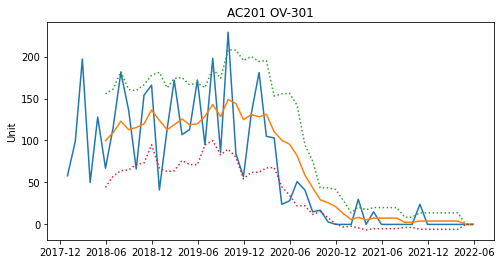

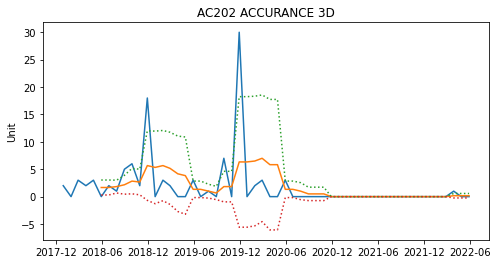

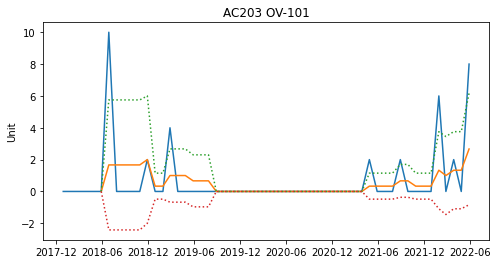

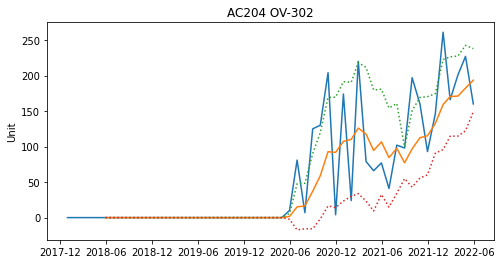

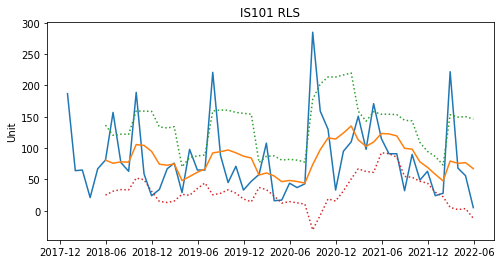

...

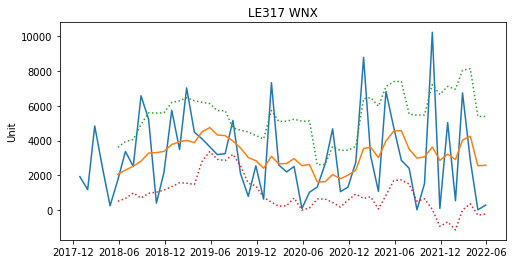

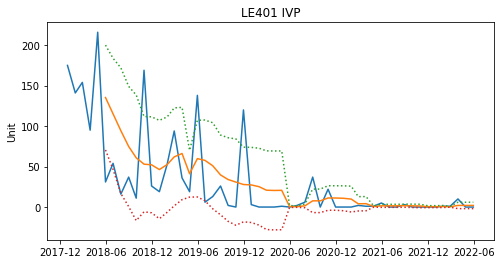

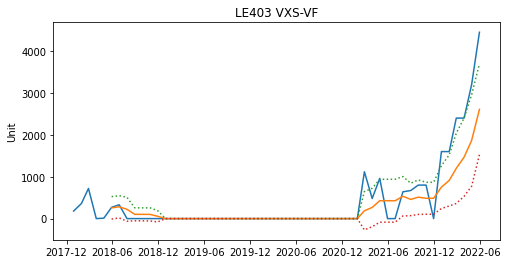

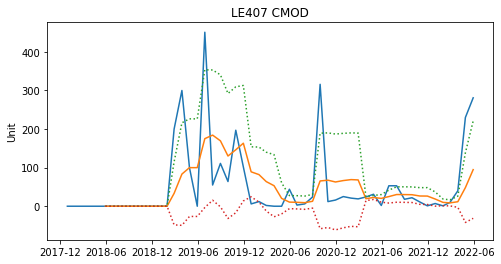

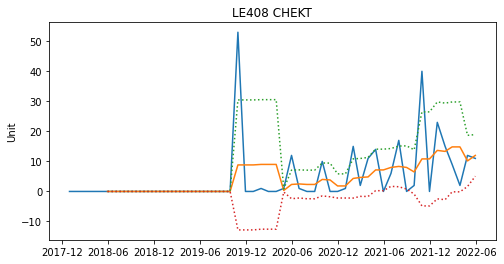

In [ ]:
import warnings
warnings.simplefilter('ignore')

##########################################################################
#製品群別台数のグラフ作成
##########################################################################

#productG=df_SEC
productG=df_EMEA.copy()

productG=productG[productG['ディビジョン'].str.startswith('LE10')|
                  productG['ディビジョン'].str.startswith('LE11')|
                  productG['ディビジョン'].str.startswith('LE20')|
                  productG['ディビジョン'].str.startswith('LE21')|
                  productG['ディビジョン'].str.startswith('LE30')|
                  productG['ディビジョン'].str.startswith('LE31')|
                  productG['ディビジョン'].str.startswith('LE40')|
                  productG['ディビジョン'].str.startswith('IS10')|
                  productG['ディビジョン'].str.startswith('IS20')|
                  productG['ディビジョン'].str.startswith('AC20')]

productG=productG.pivot_table(values=['売上高　数量'],
                               index=['ディビジョン'],columns=['年','月'],
                               aggfunc='sum', fill_value=0)#,margins=True,margins_name='TOTAL')


plot_qty(productG,"index/productG")


In [ ]:
import seaborn as sns
sns.set(font='IPAGothic')

#全体

EMEA売上データ（月次）
月


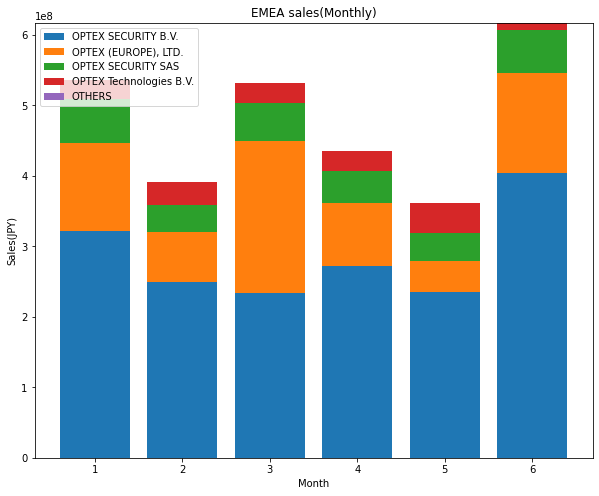

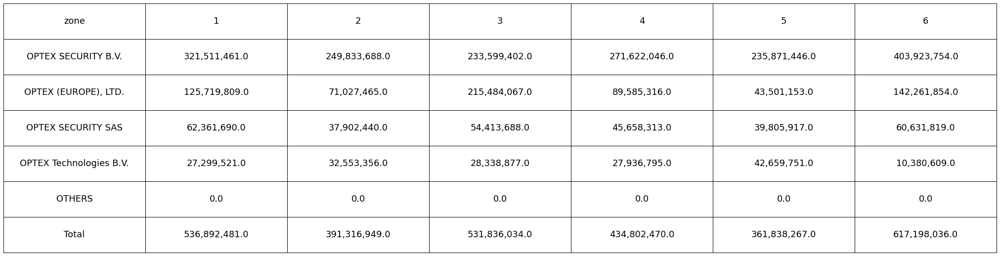

########################################################################################
EMEA 売上データ（YTD）
年


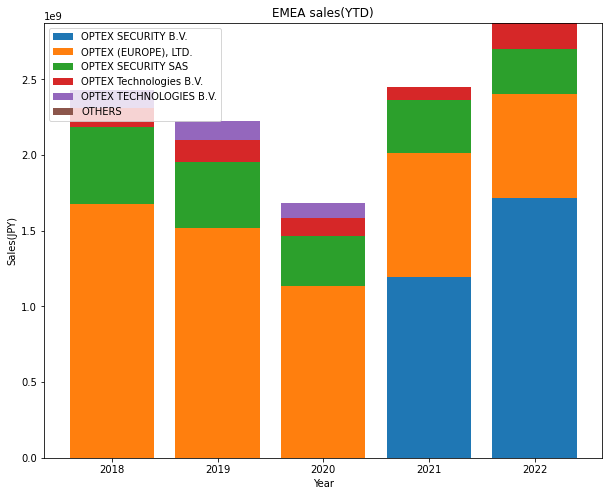

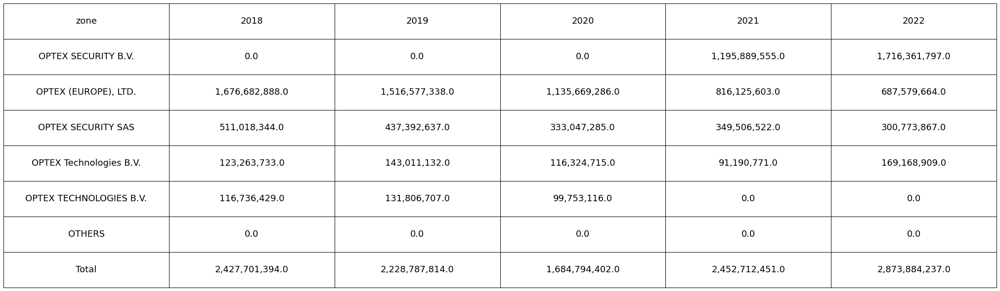

########################################################################################
EMEA ZONE別売上データ（月次）
月


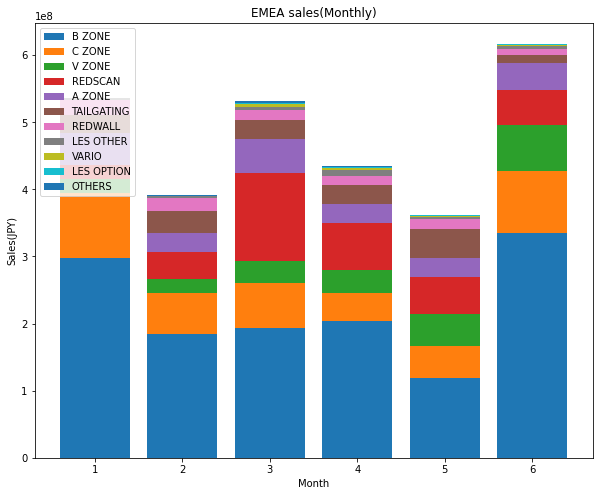

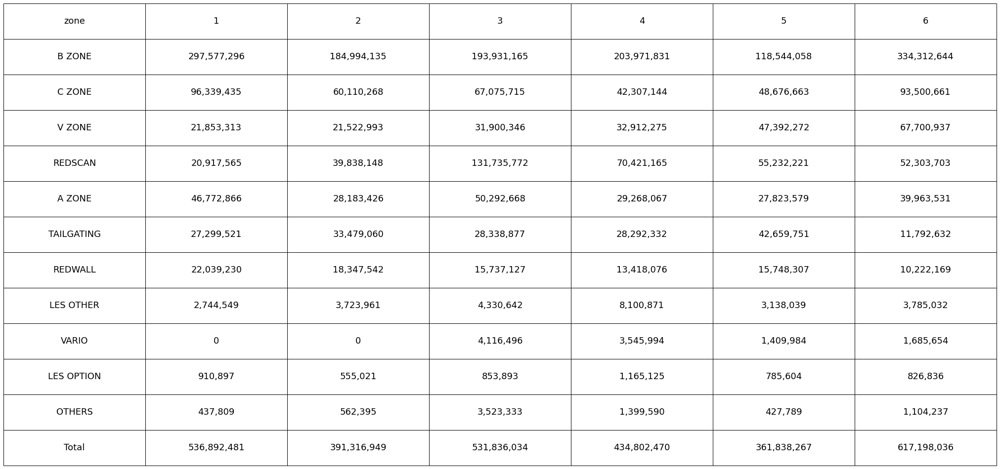

########################################################################################
EMEA ZONE別売上データ（YTD）
年


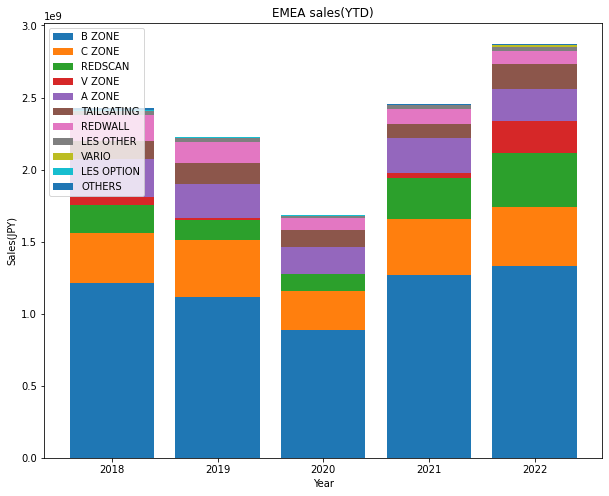

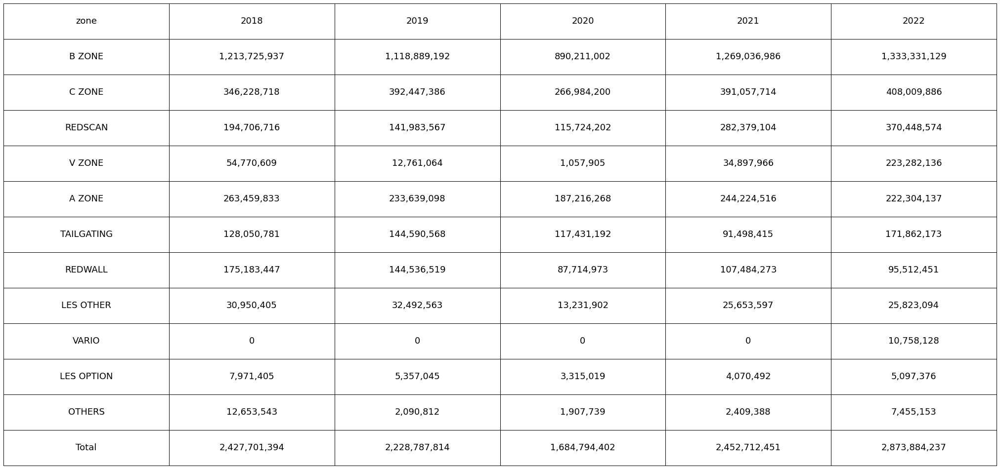

########################################################################################


In [ ]:
import warnings
warnings.simplefilter('ignore')

import time


####################
#EMEA 売上データ（YTD）
####################



print("EMEA売上データ（月次）")

EMEA_dep_YTD=df_EMEA.copy()
if(d_today.month==1):
  EMEA_dep_YTD=EMEA_dep_YTD[EMEA_dep_YTD['年']==d_today.year-1]
else:
  EMEA_dep_YTD=EMEA_dep_YTD[EMEA_dep_YTD['年']==d_today.year]
EMEA_dep_YTD=create_pivot(EMEA_dep_YTD, '売上高　金額(照会通貨)', '会社', '月', YTD=1,num=10)

bar_graph(EMEA_dep_YTD, 'Month','Sales(JPY)','EMEA sales(Monthly)','EMEA')
create_table_img(EMEA_dep_YTD)


print("########################################################################################")

print("EMEA 売上データ（YTD）")

EMEA_dep_YTD=df_EMEA.copy()
EMEA_dep_YTD=create_pivot(EMEA_dep_YTD, '売上高　金額(照会通貨)', '会社', '年', YTD=1,num=10)

bar_graph(EMEA_dep_YTD, 'Year','Sales(JPY)','EMEA sales(YTD)','ONL')
create_table_img(EMEA_dep_YTD)

print("########################################################################################")




print("EMEA ZONE別売上データ（月次）")

EMEA_dep_YTD=df_EMEA.copy()
if(d_today.month==1):
  EMEA_dep_YTD=EMEA_dep_YTD[EMEA_dep_YTD['年']==d_today.year-1]
else:
  EMEA_dep_YTD=EMEA_dep_YTD[EMEA_dep_YTD['年']==d_today.year]
EMEA_dep_YTD=create_pivot(EMEA_dep_YTD, '売上高　金額(照会通貨)', 'ディビジョン（中）', '月', YTD=1,num=10)

bar_graph(EMEA_dep_YTD, 'Month','Sales(JPY)','EMEA sales(Monthly)','EMEA')
create_table_img(EMEA_dep_YTD)


print("########################################################################################")

print("EMEA ZONE別売上データ（YTD）")

EMEA_dep_YTD=df_EMEA.copy()
EMEA_dep_YTD=create_pivot(EMEA_dep_YTD, '売上高　金額(照会通貨)', 'ディビジョン（中）', '年', YTD=1,num=10)

bar_graph(EMEA_dep_YTD, 'Year','Sales(JPY)','EMEA sales(YTD)','ONL')
create_table_img(EMEA_dep_YTD)

print("########################################################################################")


#ONL

#############################
ONL
#############################
ONL 売上データ（月次）
月


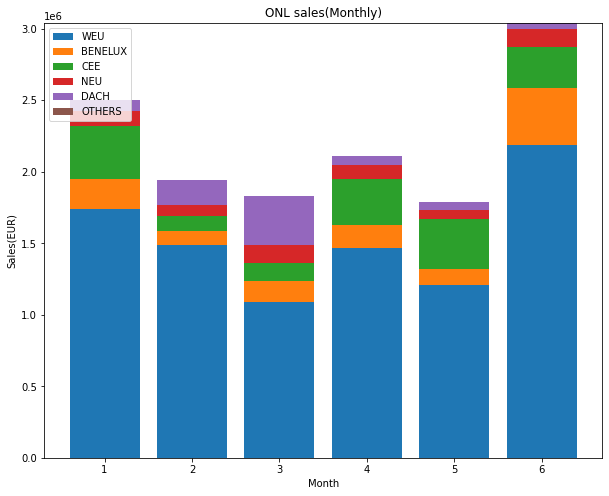

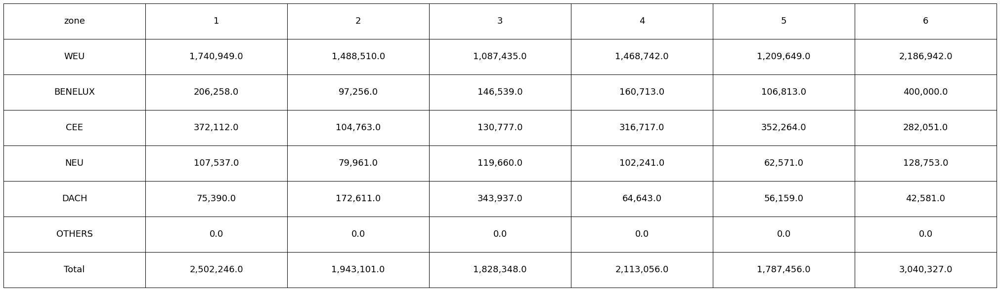

########################################################################################
ONL 売上データ（YTD）
年


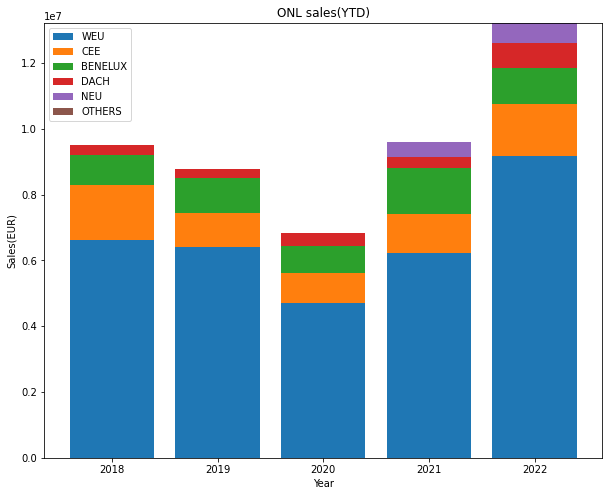

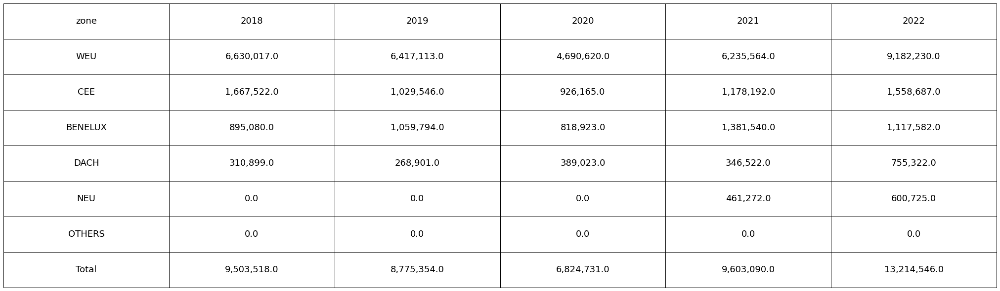

########################################################################################
ONL Zone別売上データ（月次）
月


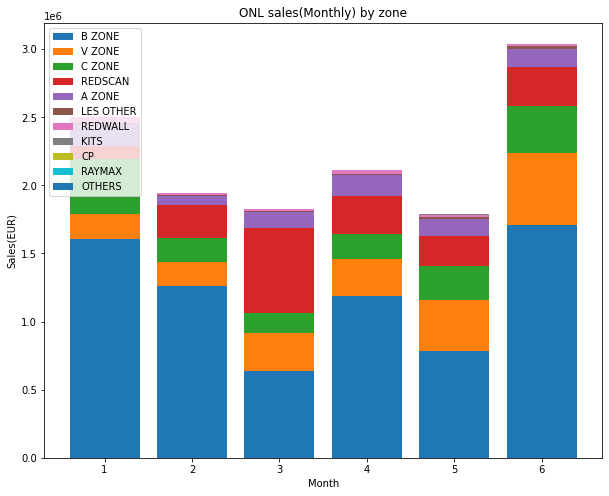

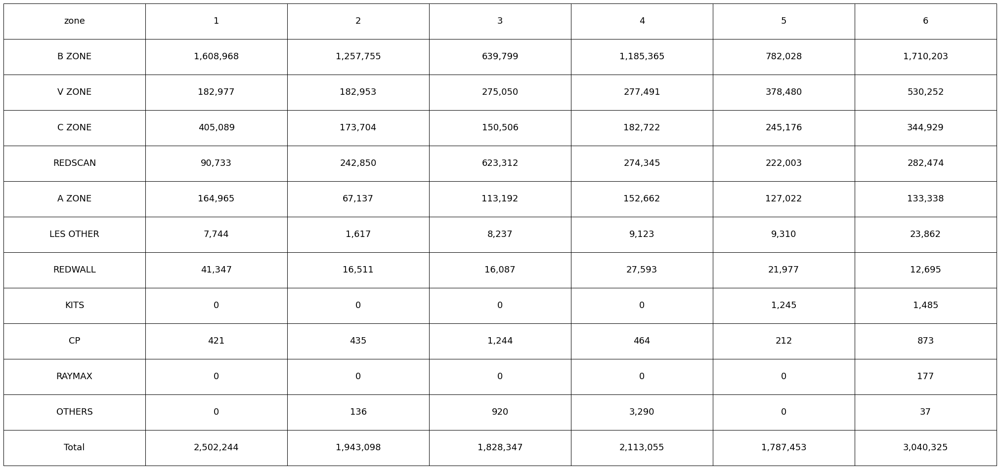

########################################################################################
ONL Zone別売上データ（YTD）
年


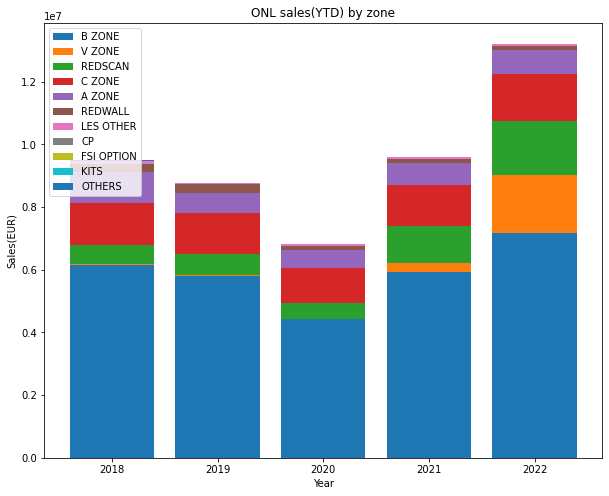

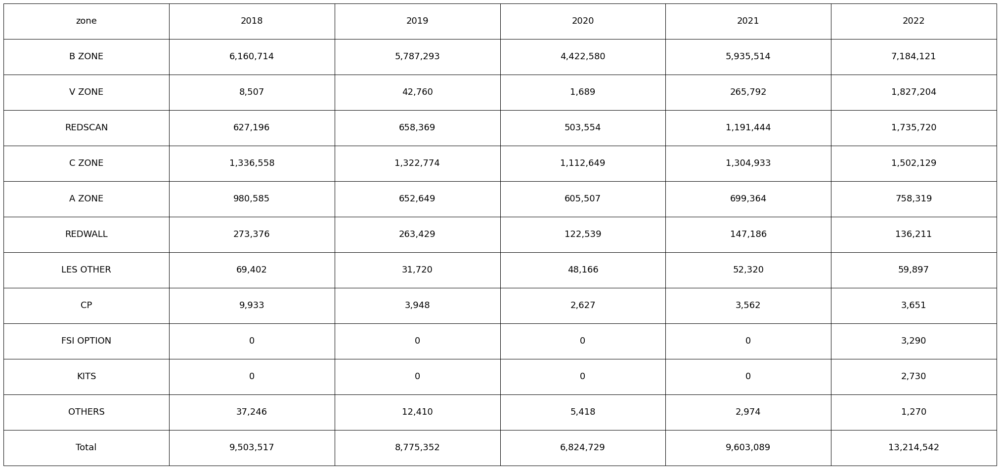

########################################################################################
ONL 顧客別売上データ（月次）
月


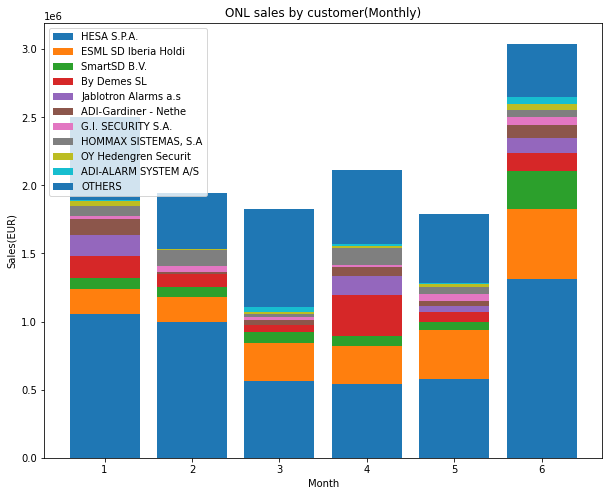

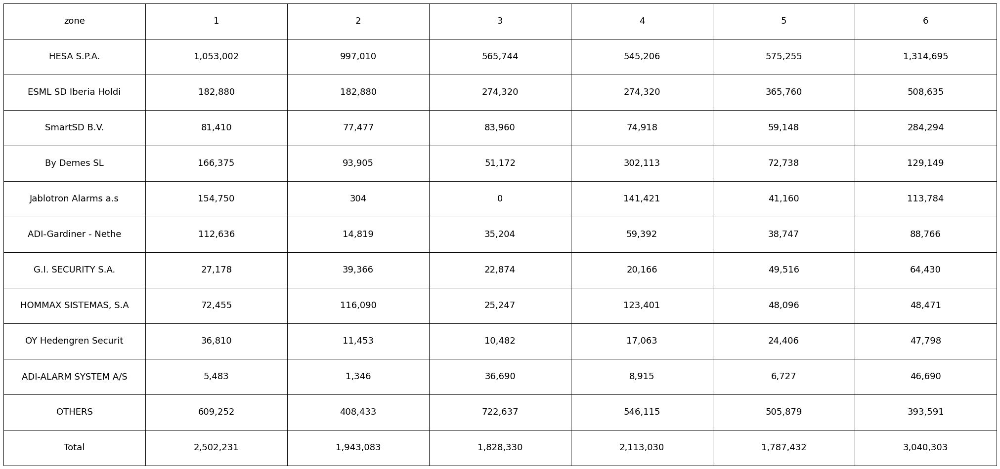

########################################################################################
ONL 顧客別売上データ（YTD）
年


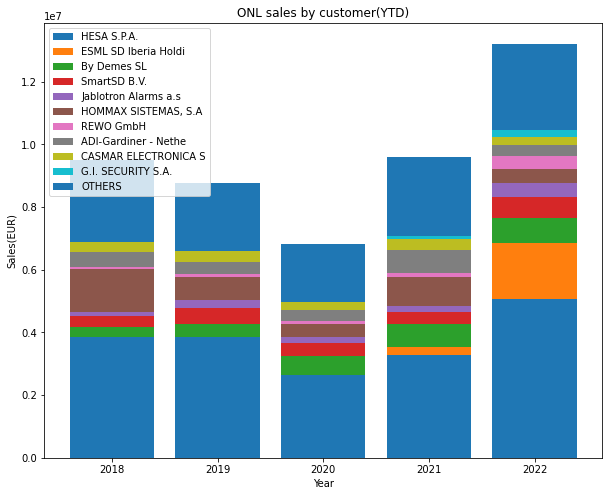

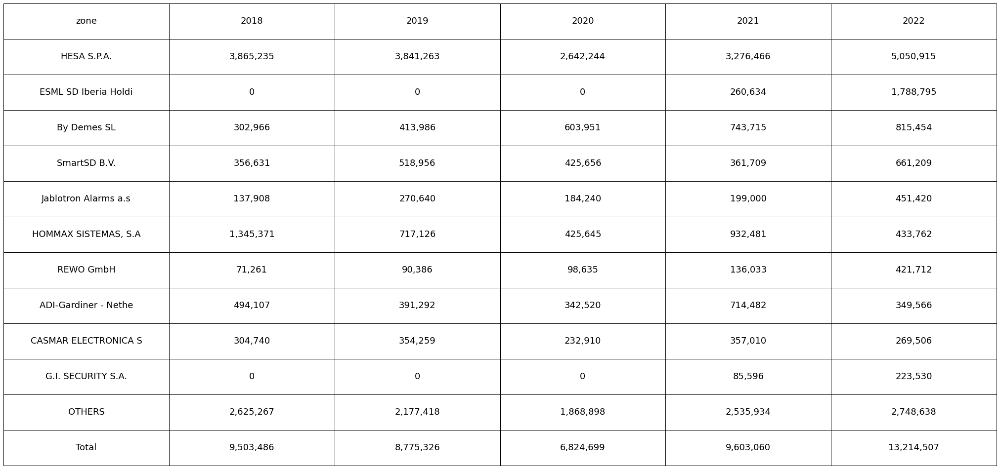

########################################################################################
ONL ゾーン別売上データ（月次）
月


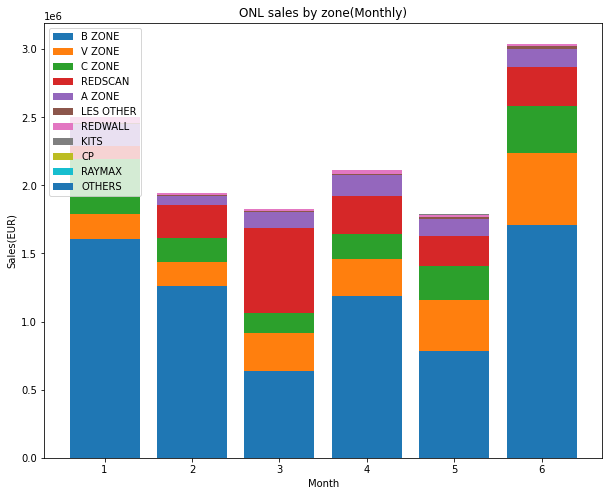

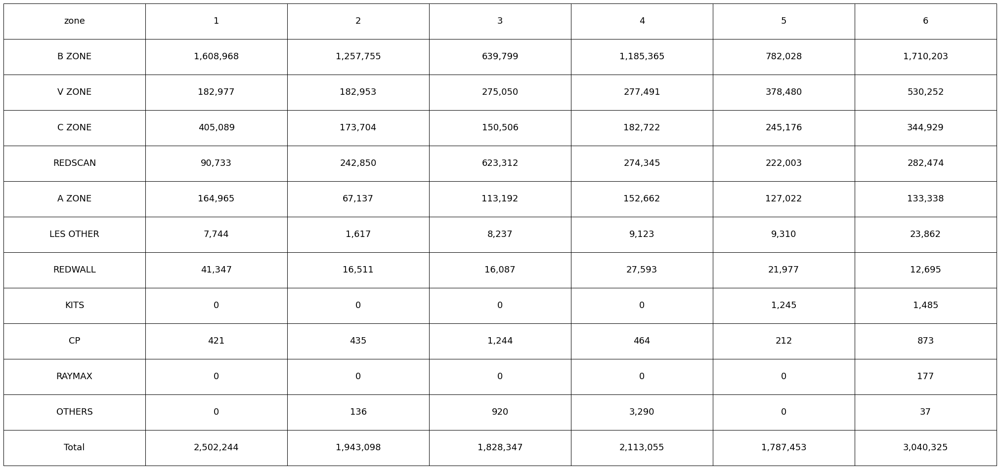

########################################################################################
ONL ゾーン別売上データ（YTD）
年


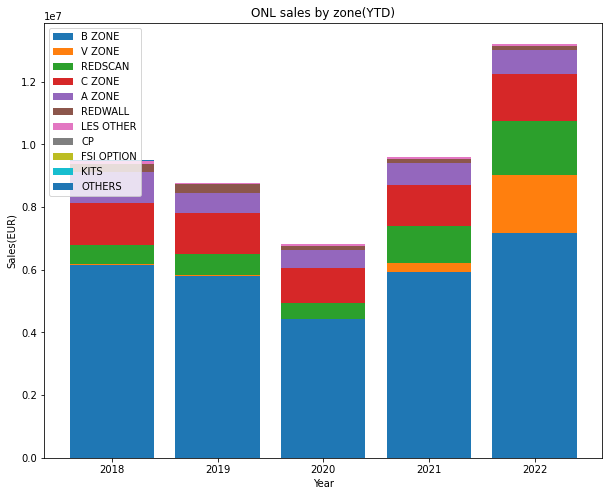

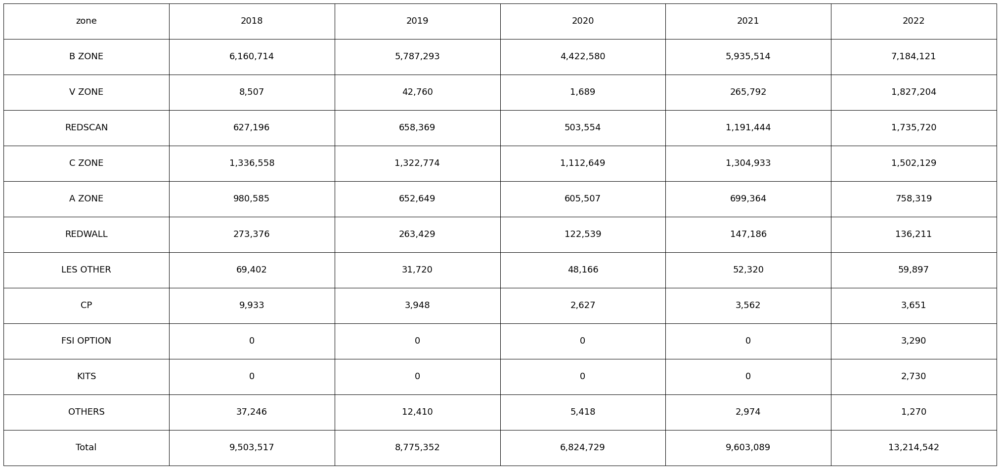

########################################################################################
#############################
各地域機種群別売上データ
#############################
ONL 機種群別売上データ（月次）
月


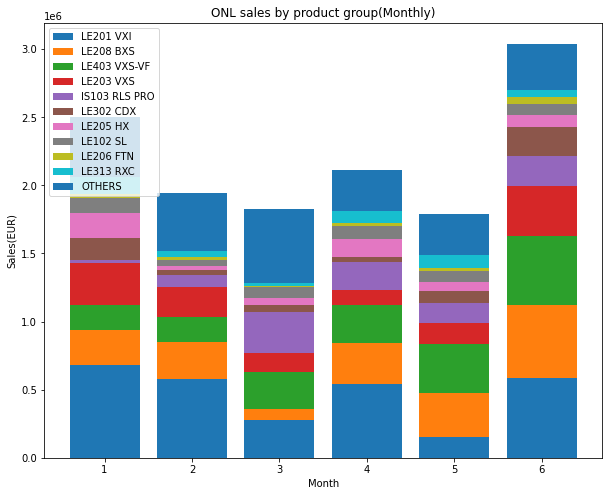

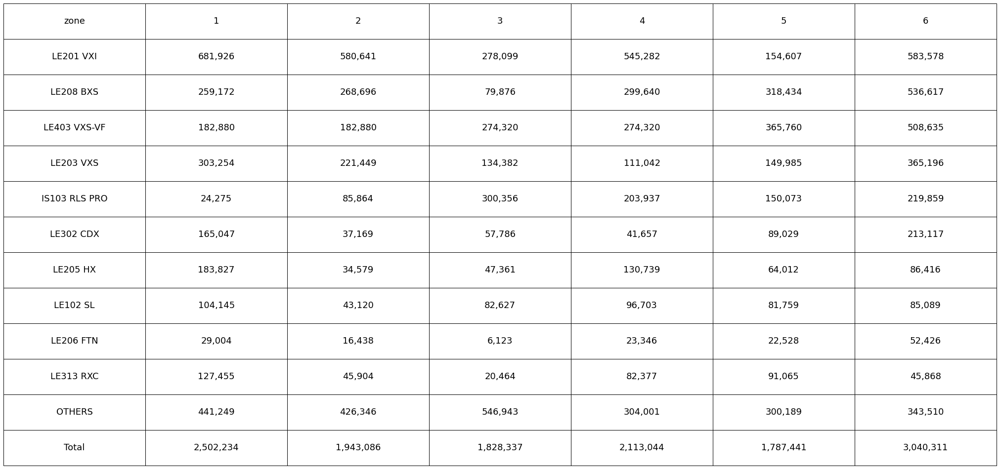

########################################################################################
ONL 機種群別売上データ（YTD）
年


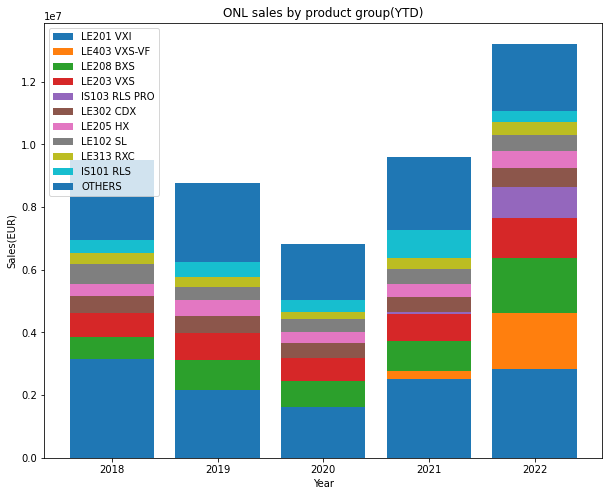

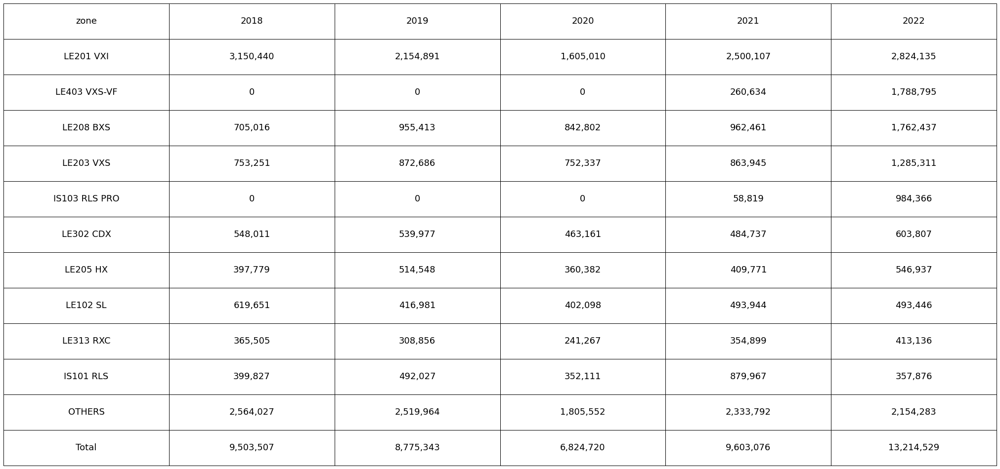

########################################################################################
#############################
各地域機種群別売上データ
#############################
WEU 機種群別売上データ（月次）
月


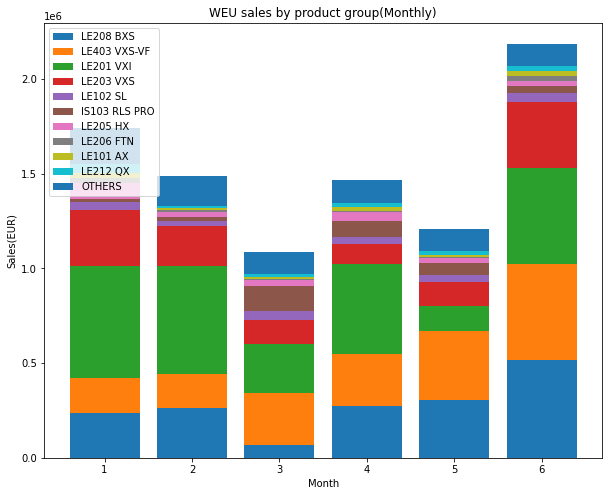

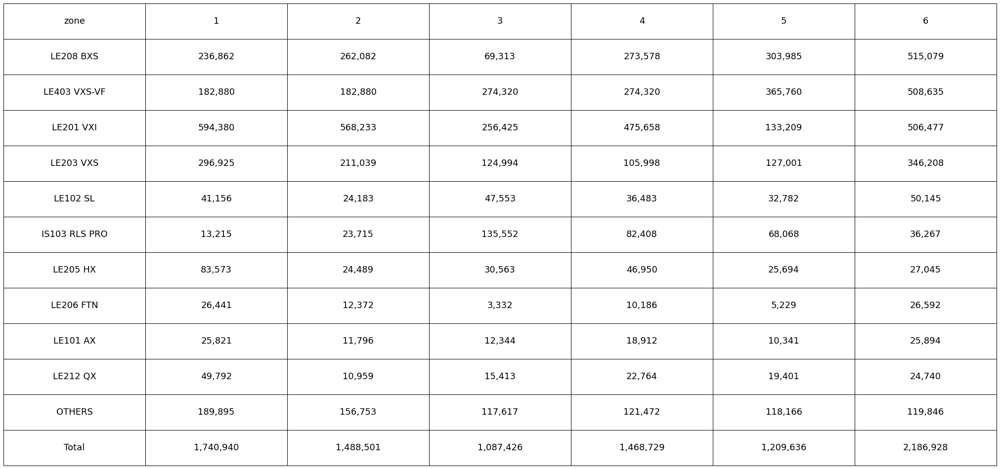

########################################################################################
WEU 機種群別売上データ（YTD）
年


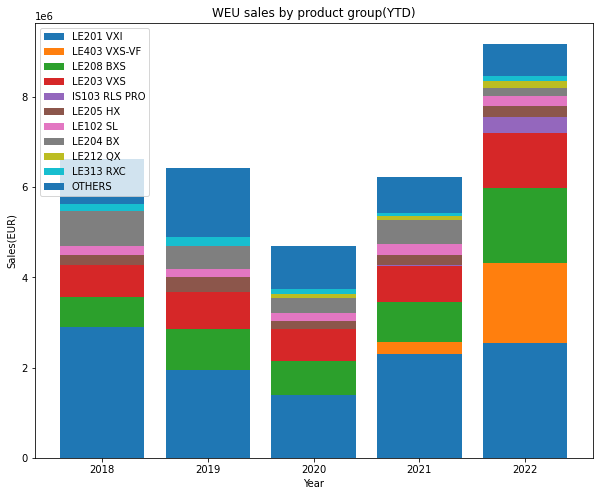

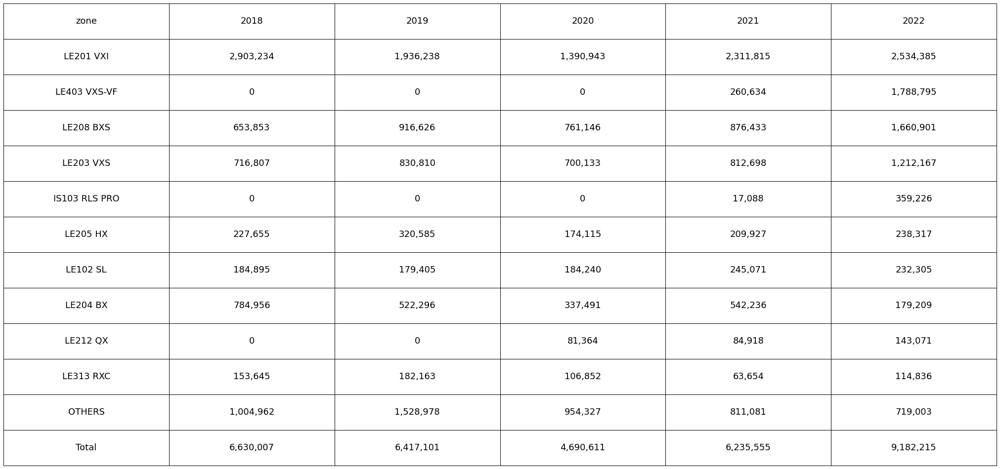

########################################################################################
NEU 機種群別売上データ（月次）
月


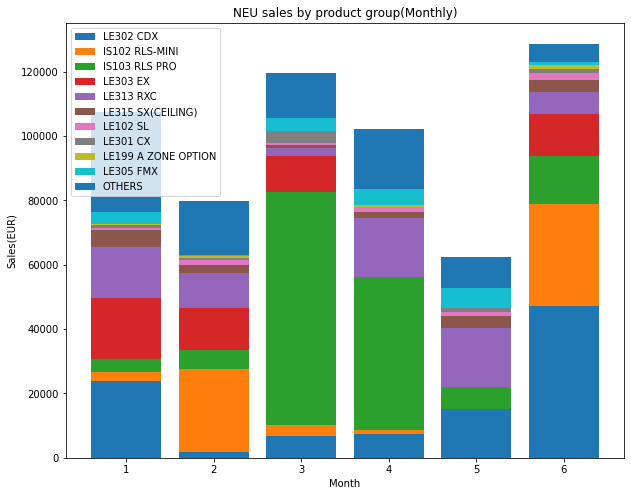

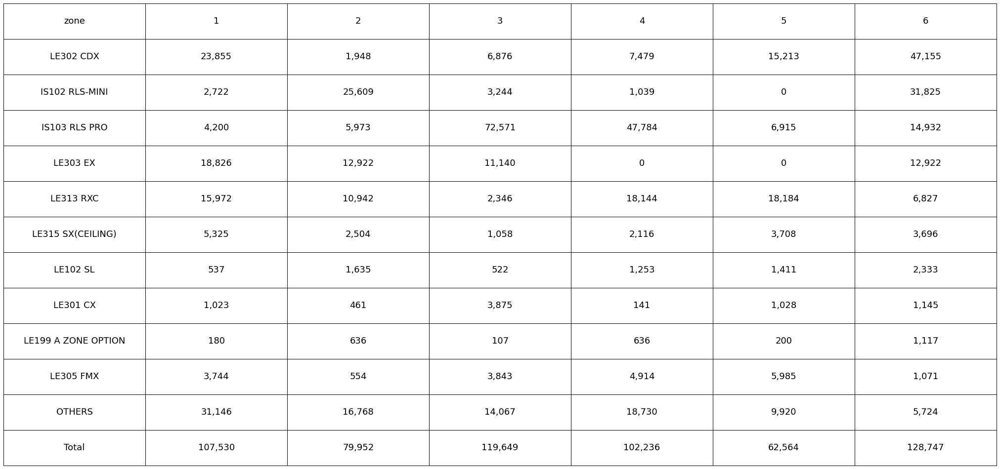

########################################################################################
NEU 機種群別売上データ（YTD）
年


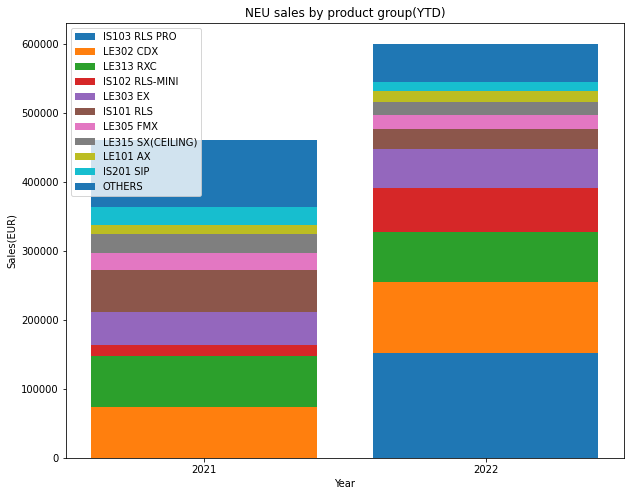

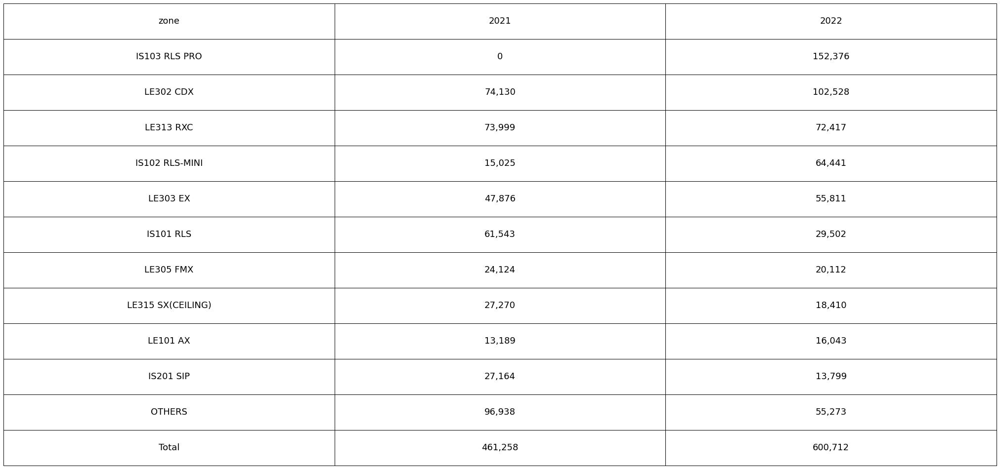

########################################################################################
DACH 機種群別売上データ（月次）
月


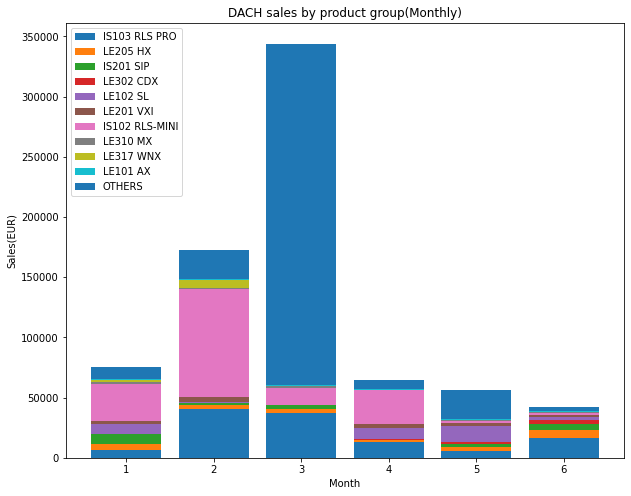

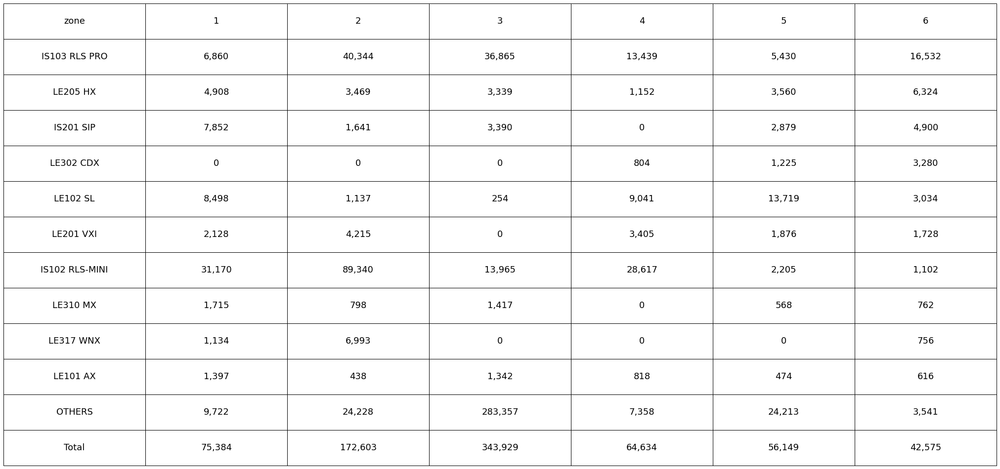

########################################################################################
DACH 機種群別売上データ（YTD）
年


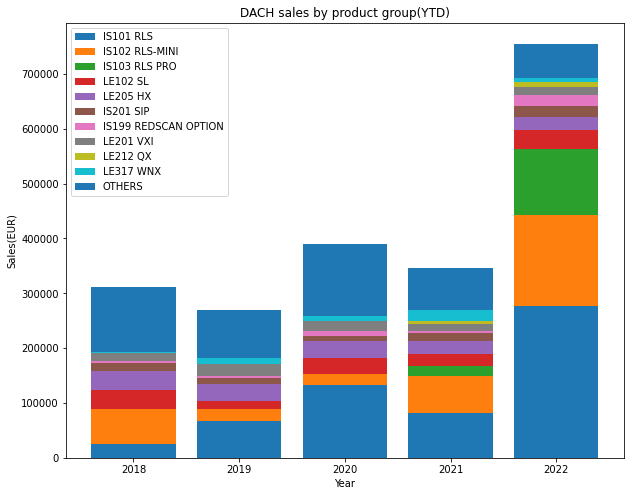

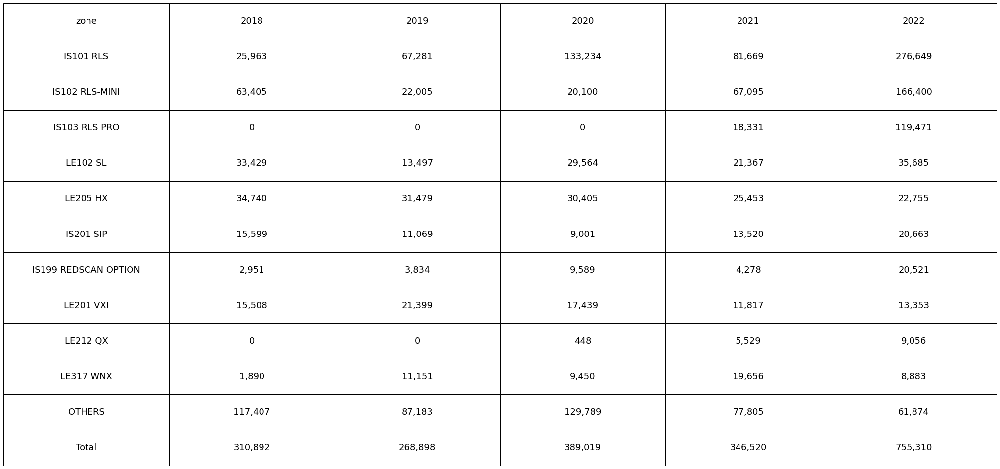

########################################################################################
BENELUX 機種群別売上データ（月次）
月


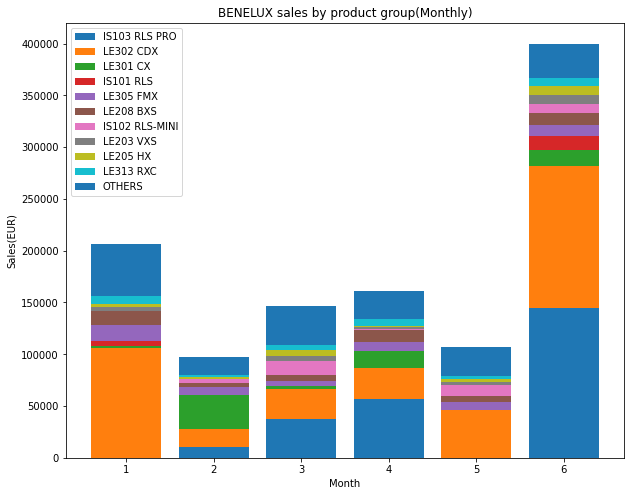

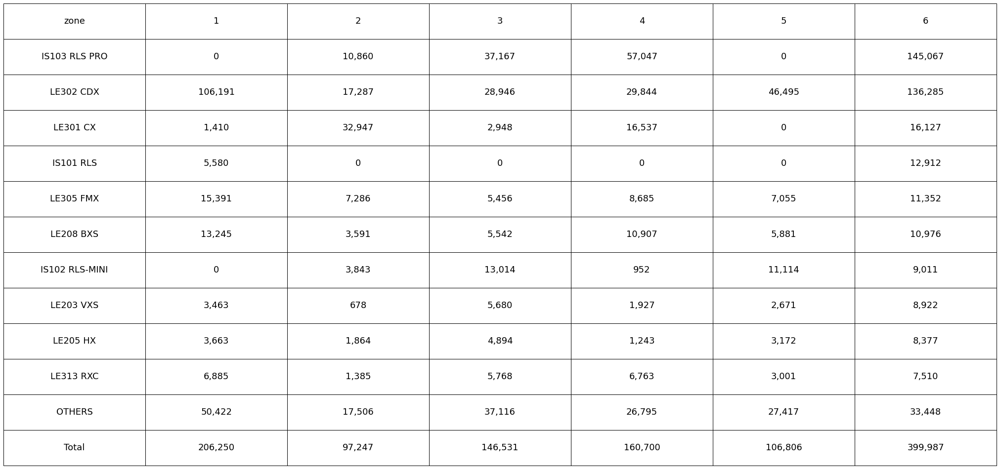

########################################################################################
BENELUX 機種群別売上データ（YTD）
年


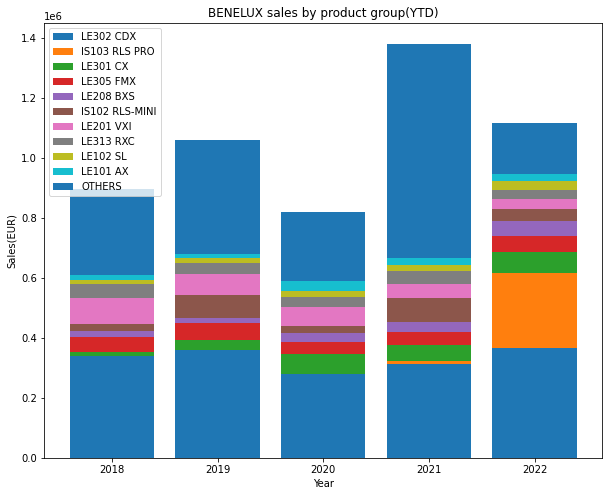

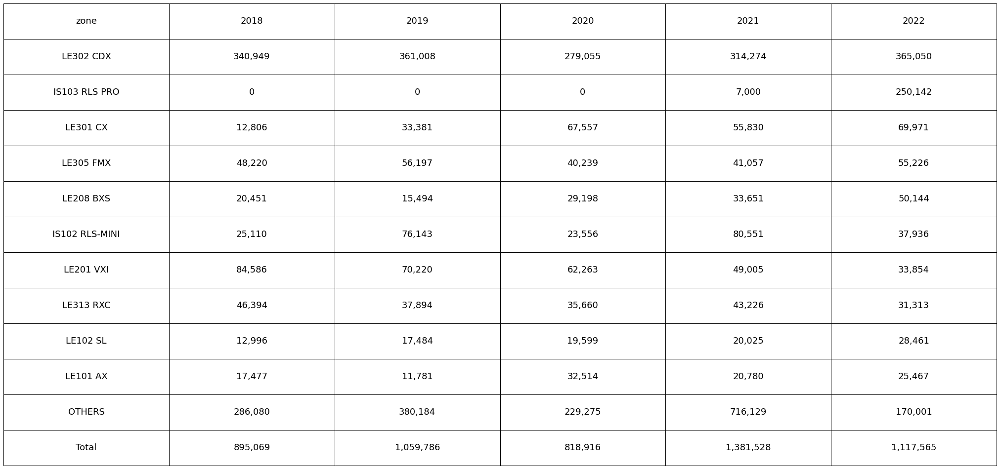

########################################################################################
CEE 機種群別売上データ（月次）
月


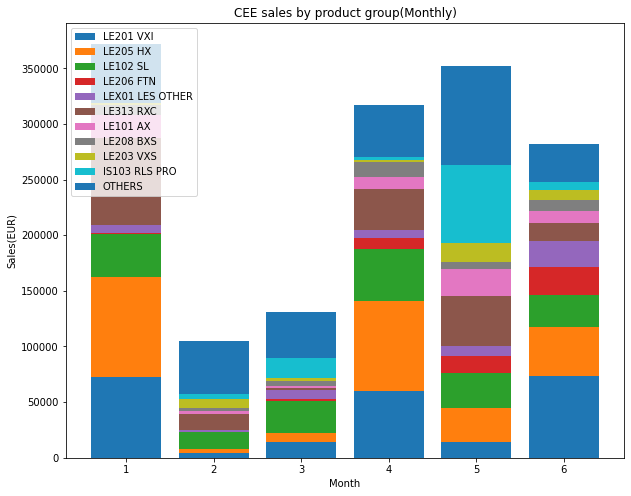

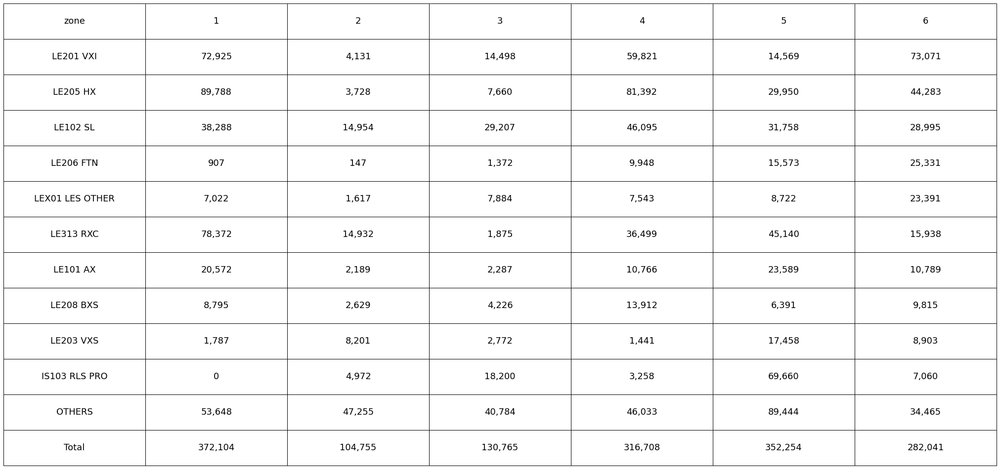

########################################################################################
CEE 機種群別売上データ（YTD）
年


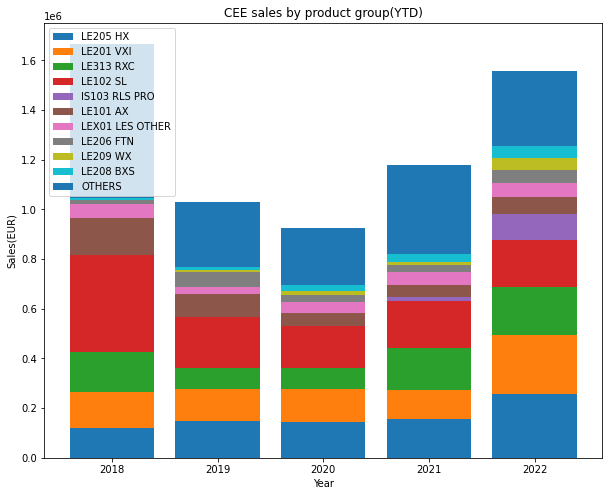

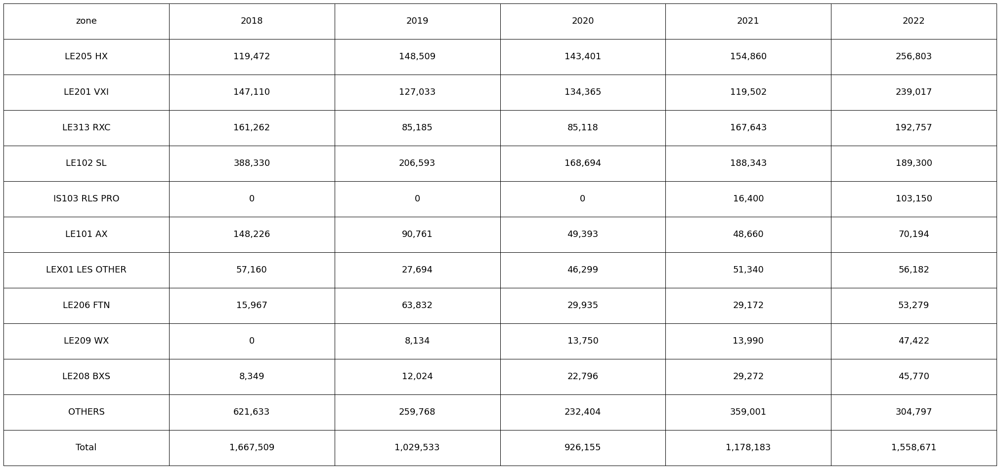

#############################
各地域顧客別売上データ
#############################
WEU 顧客別売上データ（月次）
月


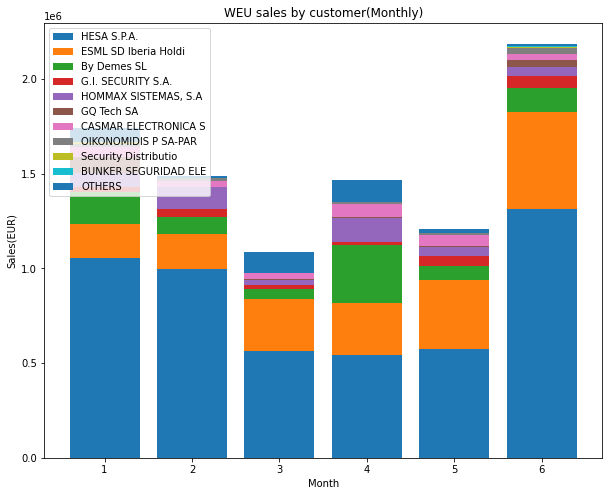

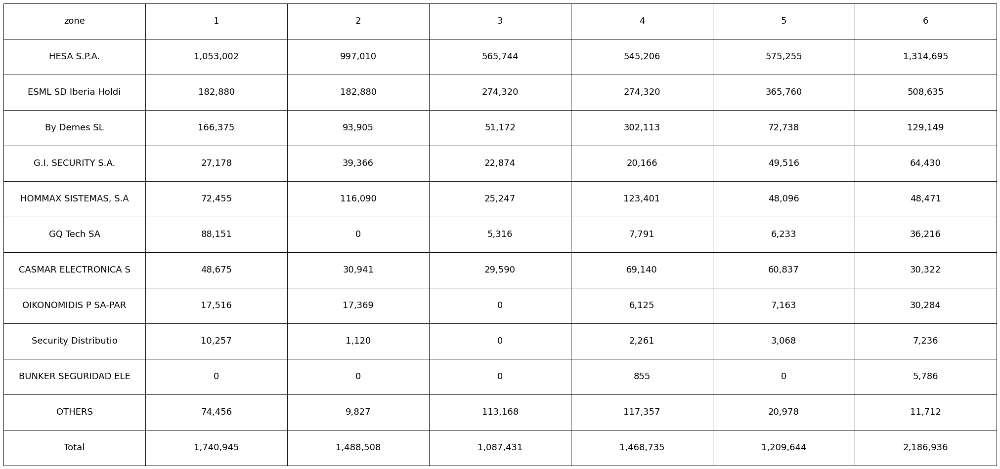

########################################################################################
WEU 顧客別売上データ（YTD）
年


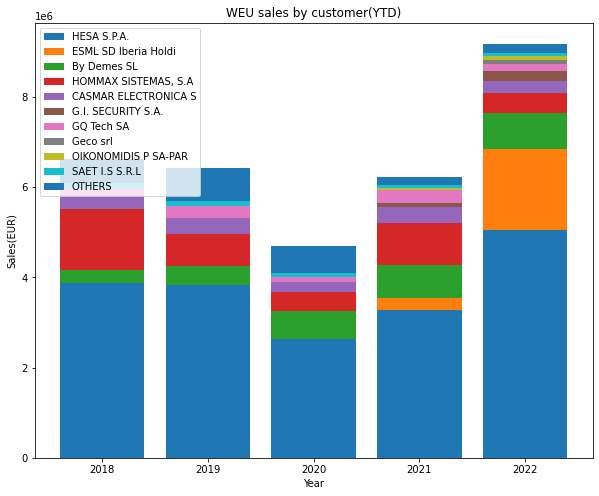

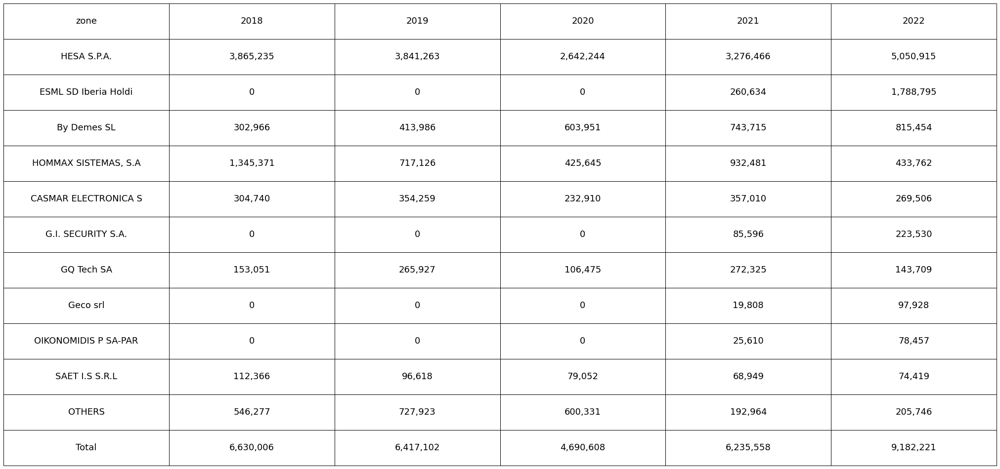

########################################################################################
NEU 顧客別売上データ（月次）
月


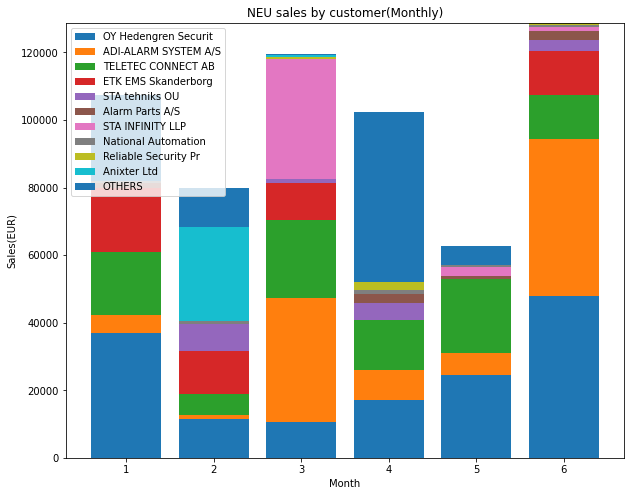

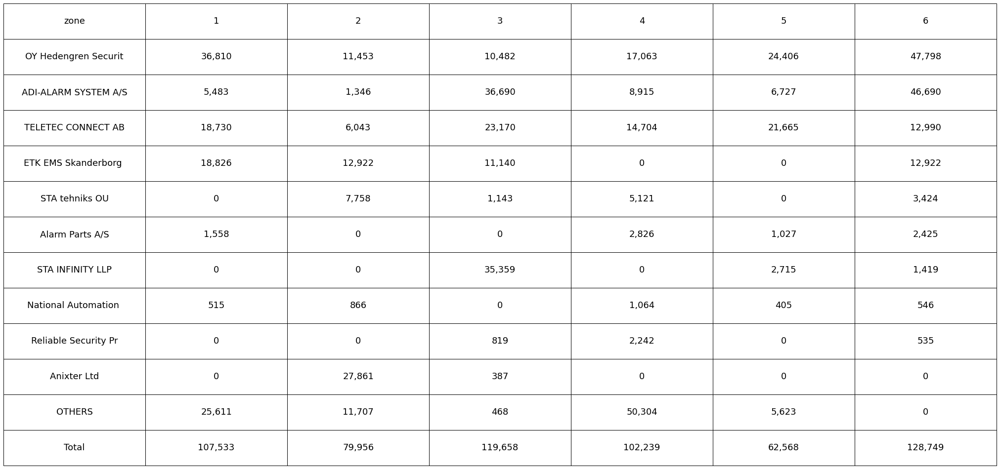

########################################################################################
NEU 顧客別売上データ（YTD）
年


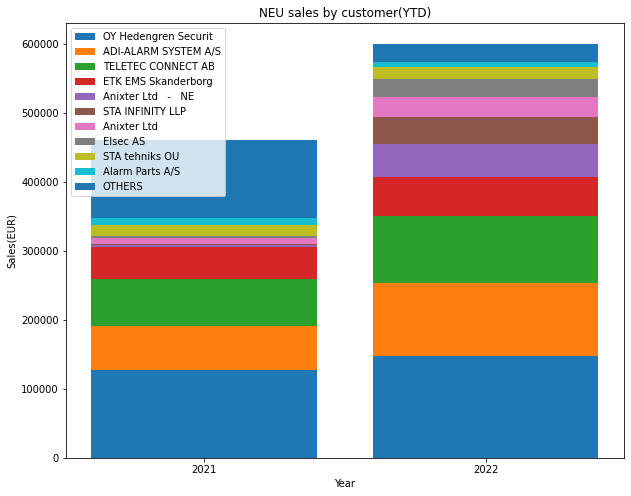

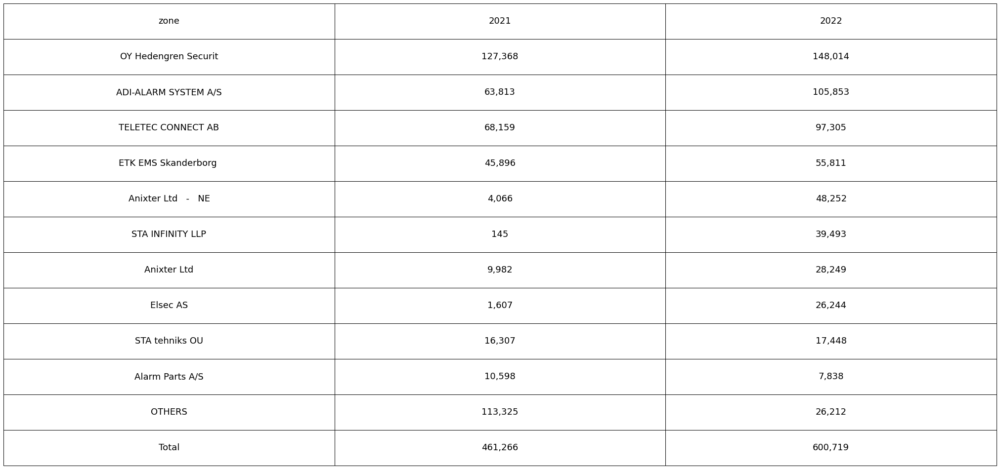

########################################################################################
DACH 顧客別売上データ（月次）
月


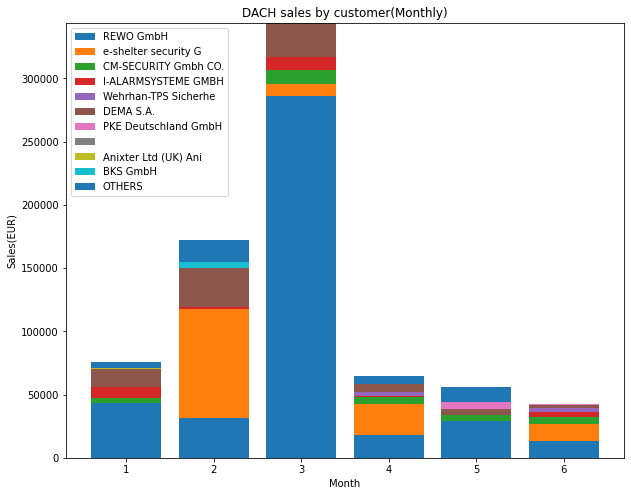

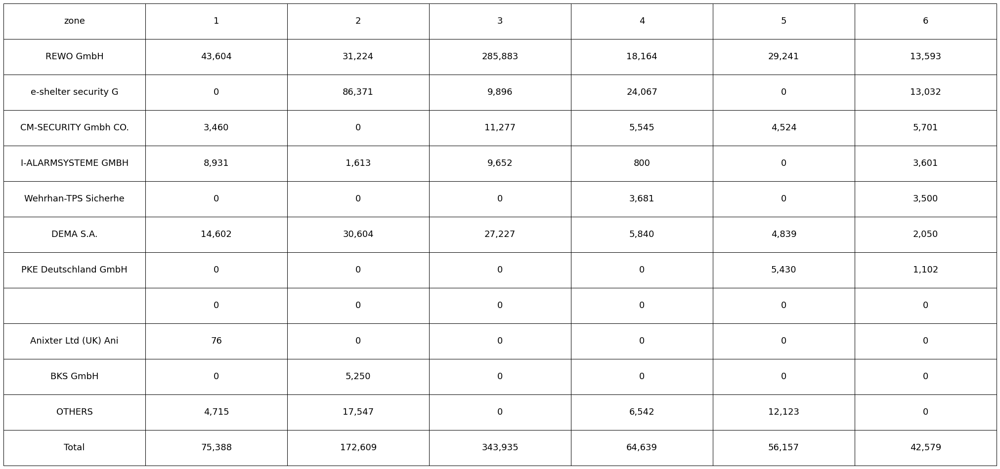

########################################################################################
DACH 顧客別売上データ（YTD）
年


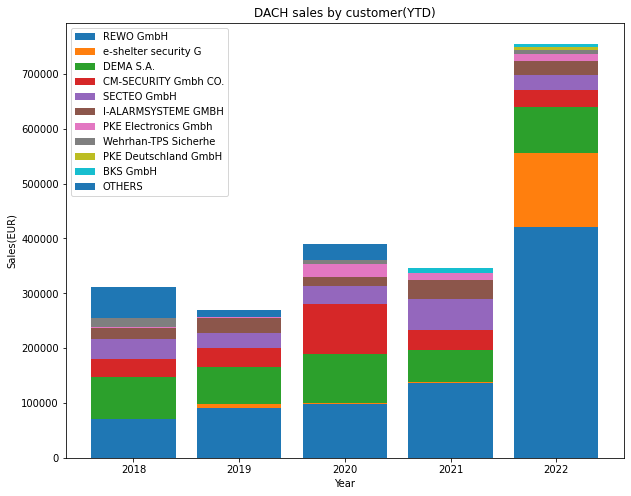

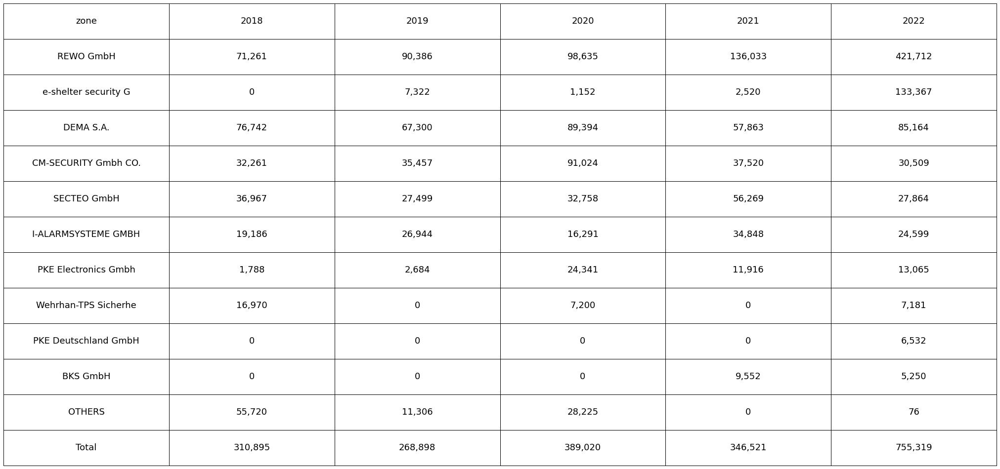

########################################################################################
BENELUX 顧客別売上データ（月次）
月


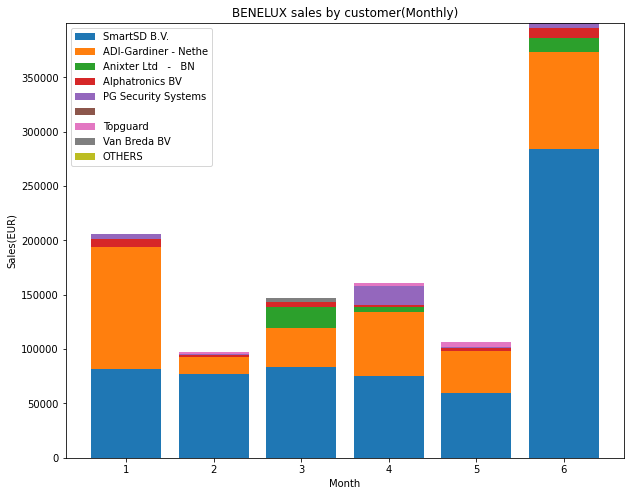

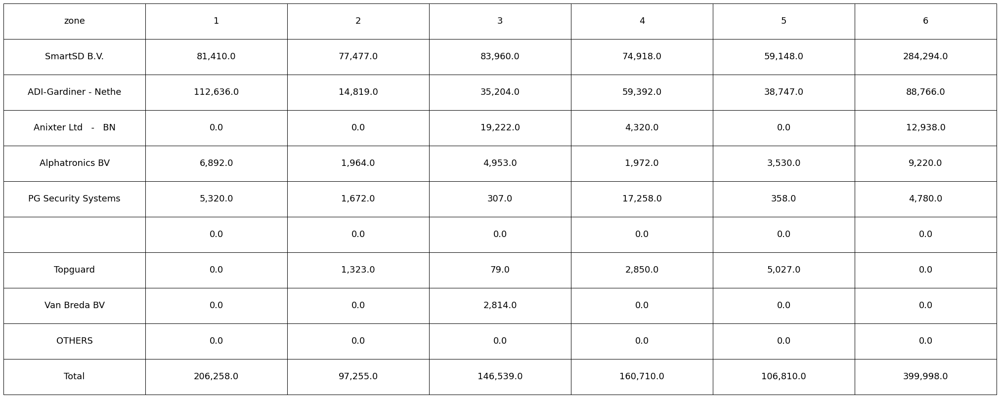

########################################################################################
BENELUX 顧客別売上データ（YTD）
年


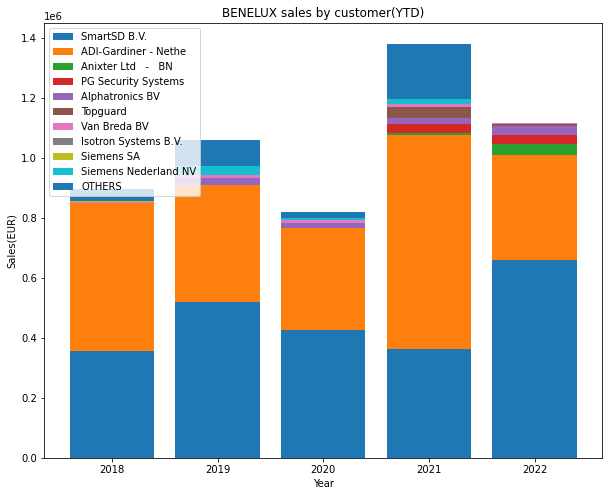

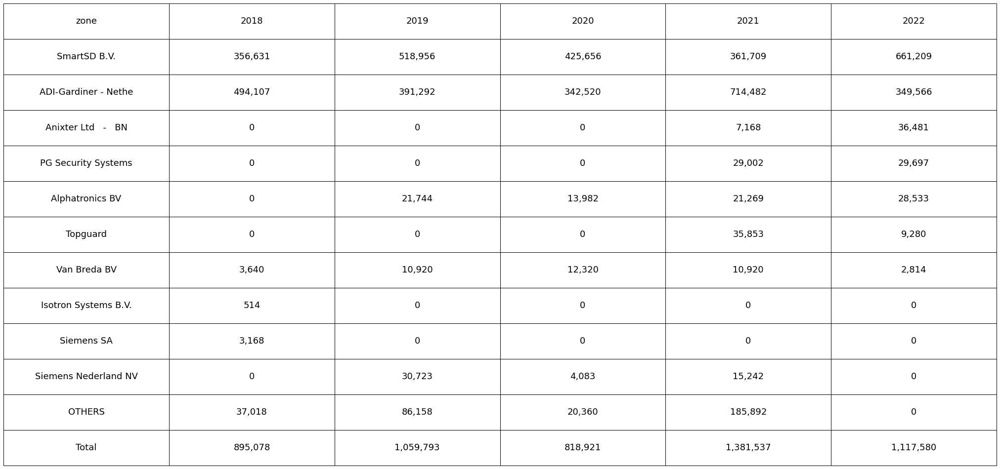

########################################################################################
CEE 顧客別売上データ（月次）
月


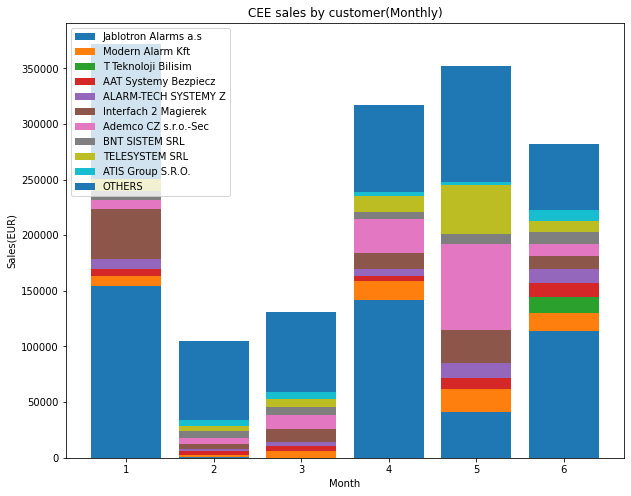

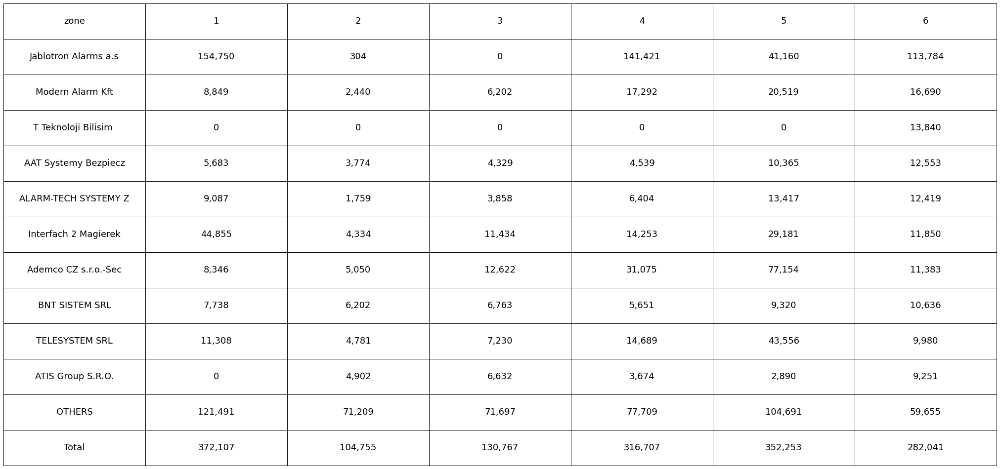

########################################################################################
CEE 顧客別売上データ（YTD）
年


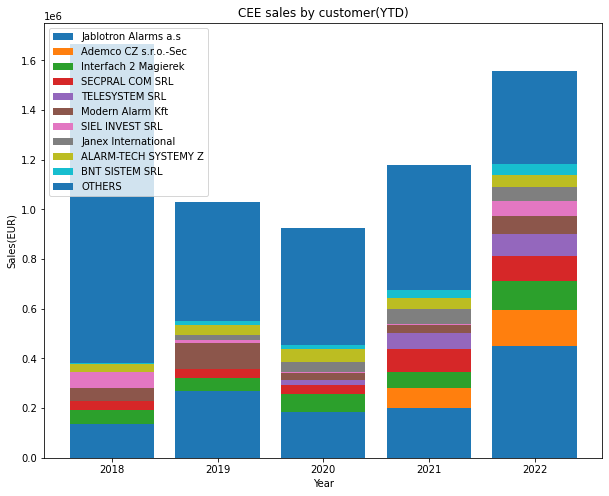

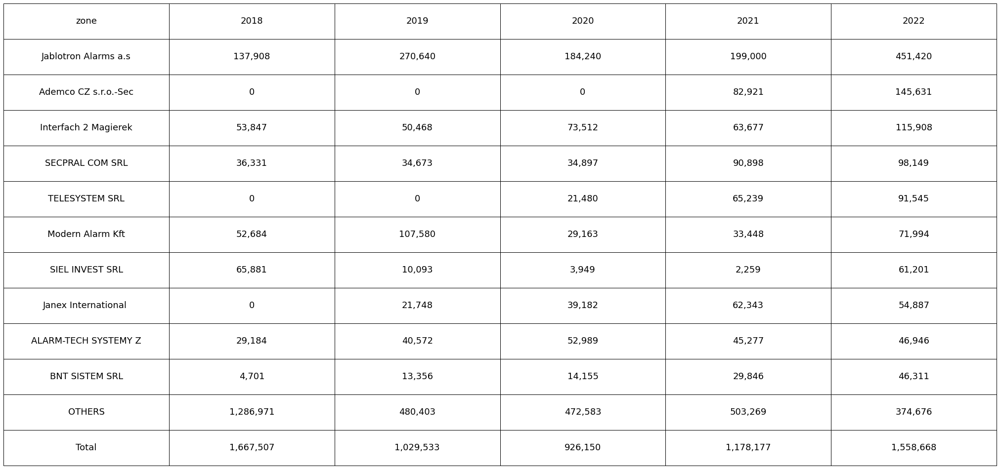

########################################################################################


In [ ]:
import warnings
warnings.simplefilter('ignore')

import time

#######################################################
#顧客別データ加工
#######################################################

########################################
#ONL
########################################

print("#############################")
print("ONL")
print("#############################")



####################
#ONL 売上データ（YTD）
####################



print("ONL 売上データ（月次）")

ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '部門', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','ONL sales(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("ONL 売上データ（YTD）")

ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '部門', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','ONL sales(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")


print("ONL Zone別売上データ（月次）")

ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン（中）', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','ONL sales(Monthly) by zone','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("ONL Zone別売上データ（YTD）")

ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン（中）', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','ONL sales(YTD) by zone','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")



####################
#ONL 顧客別売上データ（YTD）
####################

print("ONL 顧客別売上データ（月次）")

ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','ONL sales by customer(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")


print("ONL 顧客別売上データ（YTD）")
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','ONL sales by customer(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")

####################
#ONL ゾーン別売上データ（YTD）
####################

print("ONL ゾーン別売上データ（月次）")
ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン（中）', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','ONL sales by zone(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")


print("ONL ゾーン別売上データ（YTD）")
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン（中）', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','ONL sales by zone(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")


print("#############################")
print("各地域機種群別売上データ")
print("#############################")

####################
#ONL 機種群別売上データ（YTD）
####################

print("ONL 機種群別売上データ（月次）")
ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','ONL sales by product group(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")


print("ONL 機種群別売上データ（YTD）")
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','ONL sales by product group(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")


print("#############################")
print("各地域機種群別売上データ")
print("#############################")

####################
#WEU 機種群別売上データ（YTD）
####################

print("WEU 機種群別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('WEU')]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','WEU sales by product group(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("WEU 機種群別売上データ（YTD）")
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('WEU')], '売上高　金額（取引通貨）', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','WEU sales by product group(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")

####################
#NEU 機種群別売上データ（YTD）
####################

print("NEU 機種群別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('NEU')]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','NEU sales by product group(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("NEU 機種群別売上データ（YTD）")
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('NEU')], '売上高　金額（取引通貨）', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','NEU sales by product group(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")

####################
#DACH 機種群別売上データ（YTD）
####################

print("DACH 機種群別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('DACH')]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','DACH sales by product group(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("DACH 機種群別売上データ（YTD）")
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('DACH')], '売上高　金額（取引通貨）', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','DACH sales by product group(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")


####################
#BENELUX 機種群別売上データ（YTD）
####################

print("BENELUX 機種群別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('BENELUX')]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','BENELUX sales by product group(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("BENELUX 機種群別売上データ（YTD）")
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('BENELUX')], '売上高　金額（取引通貨）', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','BENELUX sales by product group(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")

####################
#CEE 機種群別売上データ（YTD）
####################

print("CEE 機種群別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]
ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('CEE')]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','CEE sales by product group(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("CEE 機種群別売上データ（YTD）")
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=create_pivot(ONL_dep_YTD[ONL_dep_YTD['部門'].str.startswith('CEE')], '売上高　金額（取引通貨）', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','CEE sales by product group(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("#############################")
print("各地域顧客別売上データ")
print("#############################")

####################
#WEU 顧客別売上データ（YTD）
####################

print("WEU 顧客別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('WEU')]
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','WEU sales by customer(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("WEU 顧客別売上データ（YTD）")
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('WEU')]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','WEU sales by customer(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")

####################
#NEU 顧客別売上データ（YTD）
####################

print("NEU 顧客別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('NEU')]
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','NEU sales by customer(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("NEU 顧客別売上データ（YTD）")
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('NEU')]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','NEU sales by customer(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")

####################
#DACH 顧客別売上データ（YTD）
####################

print("DACH 顧客別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('DACH')]
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','DACH sales by customer(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("DACH 顧客別売上データ（YTD）")
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('DACH')]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','DACH sales by customer(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")

####################
#BENELUX 顧客別売上データ（YTD）
####################

print("BENELUX 顧客別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('BENELUX')]
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','BENELUX sales by customer(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("BENELUX 顧客別売上データ（YTD）")
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('BENELUX')]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','BENELUX sales by customer(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")

####################
#CEE 顧客別売上データ（YTD）
####################

print("CEE 顧客別売上データ（月次）")

d_today = datetime.date.today()
ONL_dep_YTD=df_ONL.copy()
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('CEE')]
if(d_today.month==1):
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year-1]
else:
  ONL_dep_YTD=ONL_dep_YTD[ONL_dep_YTD['年']==d_today.year]

ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '月', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Month','Sales(EUR)','CEE sales by customer(Monthly)','ONL')
create_table_img(ONL_dep_YTD)


print("########################################################################################")

print("CEE 顧客別売上データ（YTD）")
ONL_dep_YTD=df_ONL[df_ONL['部門'].str.startswith('CEE')]
ONL_dep_YTD=create_pivot(ONL_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)

bar_graph(ONL_dep_YTD, 'Year','Sales(EUR)','CEE sales by customer(YTD)','ONL')
create_table_img(ONL_dep_YTD)

print("########################################################################################")




#OE

#############################
OE
#############################
OE 売上データ（月次）


,会社,年,月,伝票起票日,伝票番号,部門(特大),部門,得意先,得意先国,得意先VAT-ID,...,会社通貨,合計総重量,合計正味重量,売上高 数量,売上高 金額（取引通貨）,売上高 金額(会社通貨),売上高 金額(照会通貨),変動費 金額(会社通貨),変動費 金額(照会通貨),item_c
258101,"OPTEX (EUROPE), LTD.",2022,1,2022-01-04,1530000002,#,UK&IE,Security Dynamics (E,GB,NaN,...,GBP,NaN,NaN,30.0,210.00,210.00,31613.0,-127.80,-19239.0,A10008440
258102,"OPTEX (EUROPE), LTD.",2022,1,2022-01-04,1530000005,#,UK&IE,Oprema Ltd,GB,NaN,...,GBP,NaN,NaN,5.0,630.00,630.00,94840.0,-481.79,-72529.0,A10008561
258103,"OPTEX (EUROPE), LTD.",2022,1,2022-01-04,1530000005,#,UK&IE,Oprema Ltd,GB,NaN,...,GBP,NaN,NaN,4.0,1120.00,1120.00,168605.0,-694.17,-104500.0,A10008566
258104,"OPTEX (EUROPE), LTD.",2022,1,2022-01-04,1530000005,#,UK&IE,Oprema Ltd,GB,NaN,...,GBP,NaN,NaN,1.0,67.50,67.50,10161.0,-47.57,-7161.0,A10050272
258105,"OPTEX (EUROPE), LTD.",2022,1,2022-01-04,1530000005,#,UK&IE,Oprema Ltd,GB,NaN,...,GBP,NaN,NaN,20.0,317.00,317.00,47721.0,-306.20,-46095.0,A10008837
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290640,"OPTEX (EUROPE), LTD.",2022,6,2022-06-30,1530001698,UK&IE,A150/150130 UK&IE,Enterprise Security,GB,#,...,GBP,0.29,0.18,1.0,61.55,61.55,9985.0,-45.19,-7331.0,A10008756
290641,"OPTEX (EUROPE), LTD.",2022,6,2022-06-30,1530001698,UK&IE,A150/150130 UK&IE,Enterprise Security,GB,#,...,GBP,4.70,3.15,50.0,342.50,342.50,55560.0,-213.00,-34553.0,A10008440
290642,"OPTEX (EUROPE), LTD.",2022,6,2022-06-30,1530001698,UK&IE,A150/150130 UK&IE,Enterprise Security,GB,#,...,GBP,6.00,4.30,50.0,357.50,357.50,57994.0,-207.99,-33740.0,A10008832
290643,"OPTEX (EUROPE), LTD.",2022,6,2022-06-30,1530001698,UK&IE,A150/150130 UK&IE,Enterprise Security,GB,#,...,GBP,6.16,4.34,70.0,280.00,280.00,45422.0,-236.60,-38381.0,A10008894


月


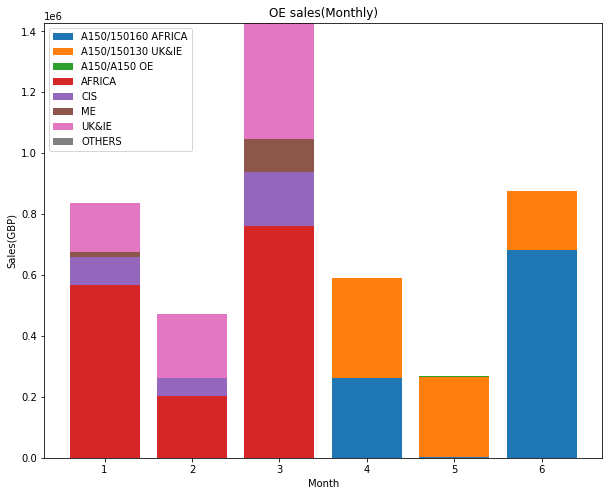

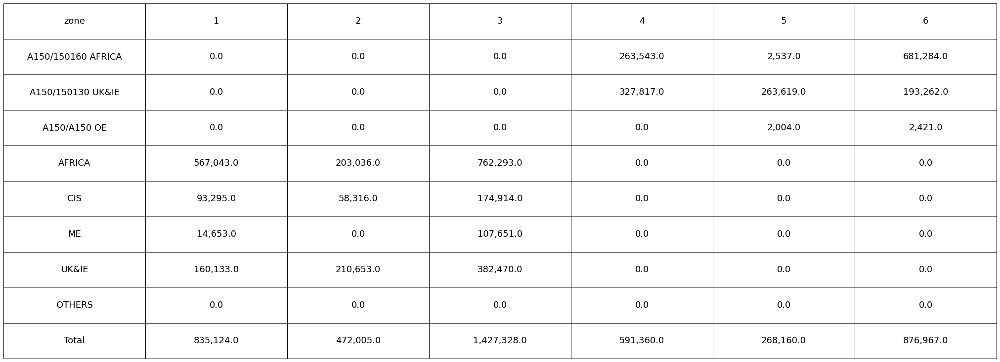

########################################################################################
OE 売上データ（YTD）
年


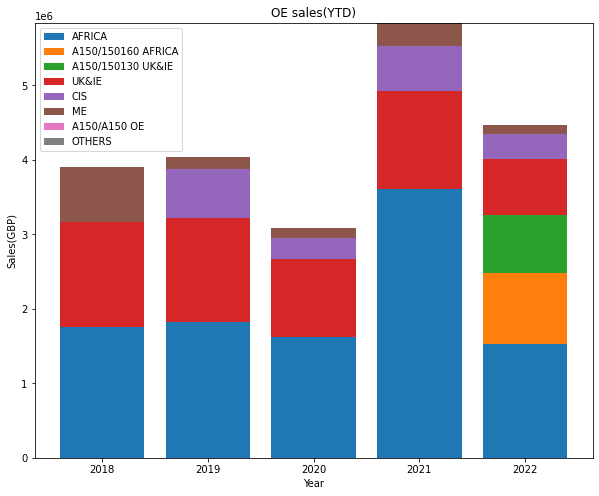

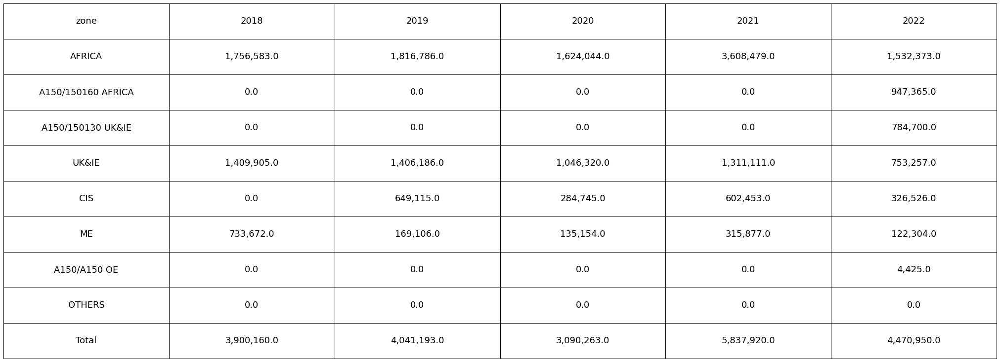

########################################################################################
OE Zone別売上データ（月次）
月


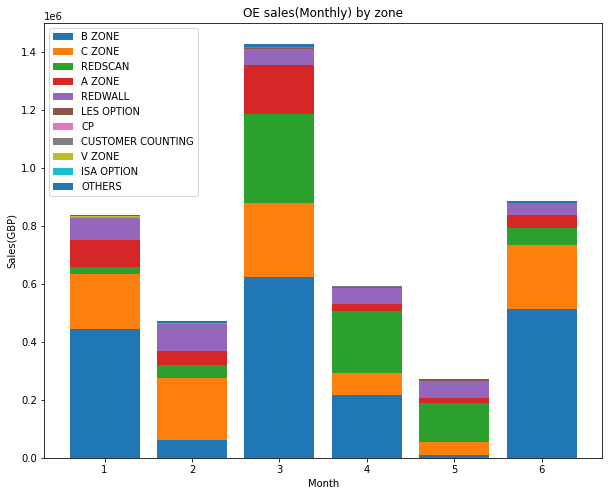

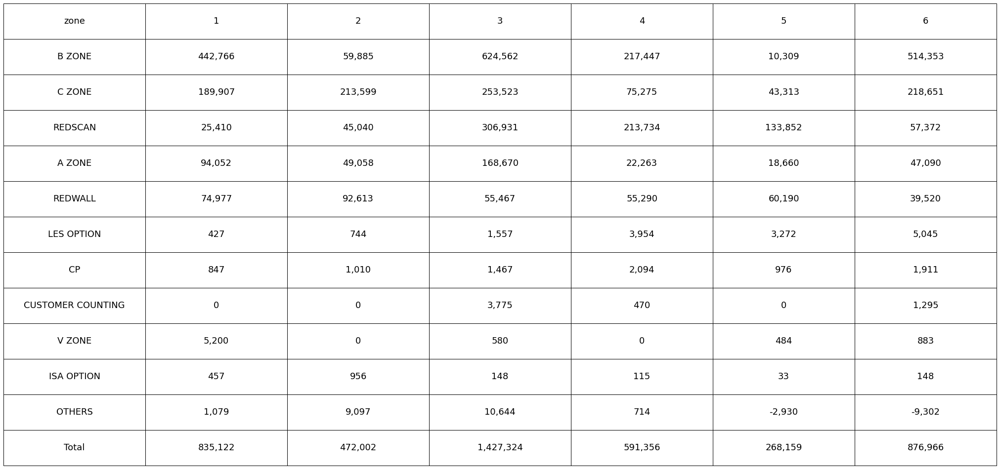

########################################################################################
OE Zone別売上データ（YTD）
年


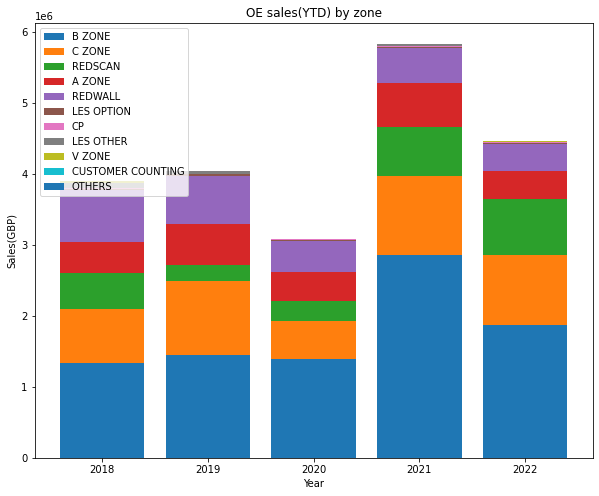

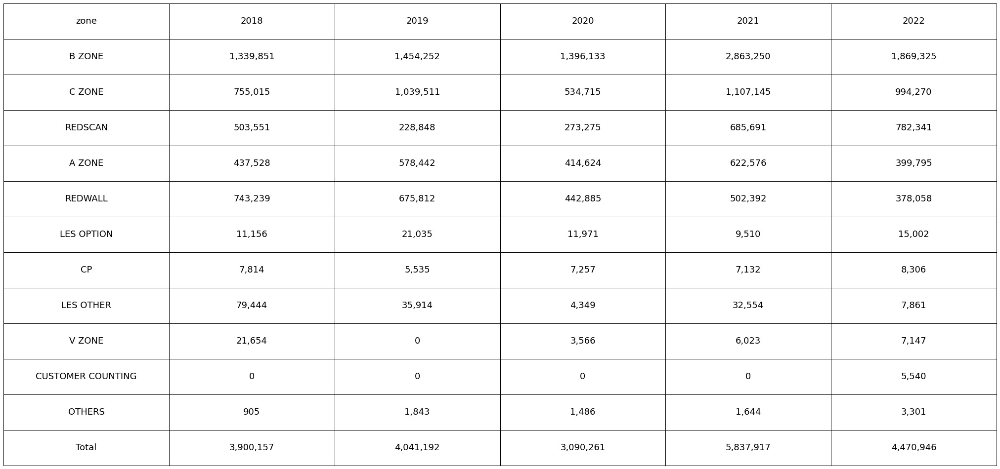

########################################################################################
OE 顧客別売上データ（月次）
月


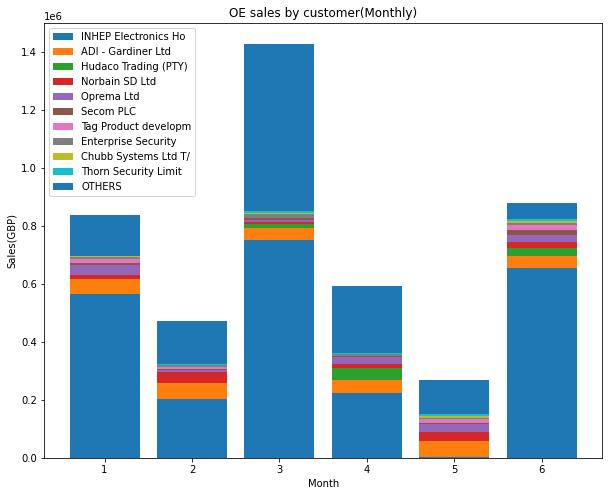

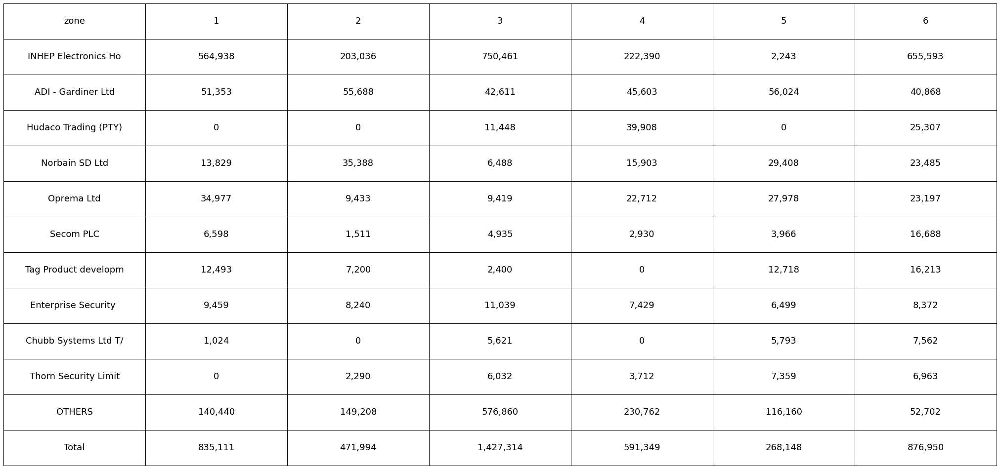

########################################################################################
OE 顧客別売上データ（YTD）
年


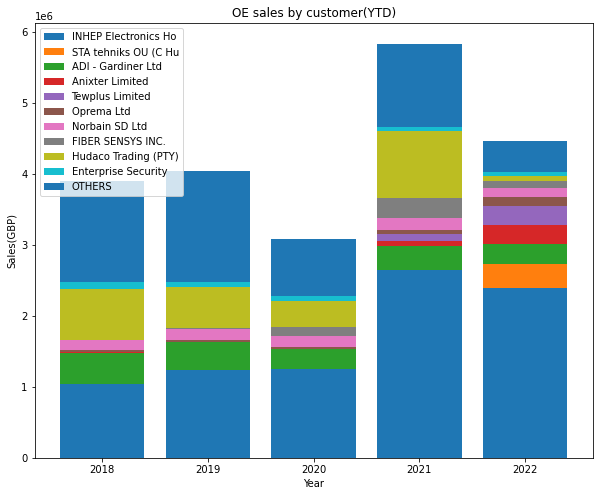

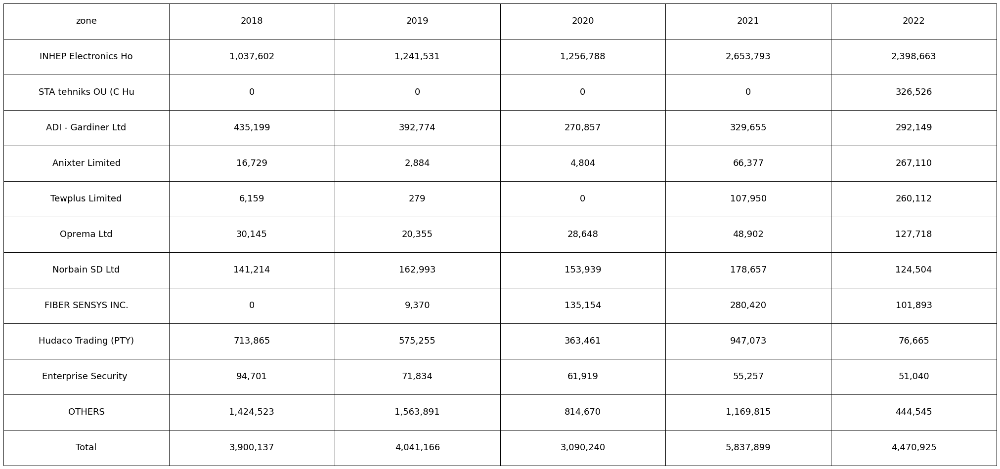

########################################################################################
OE 機種群別売上データ（月次）
月


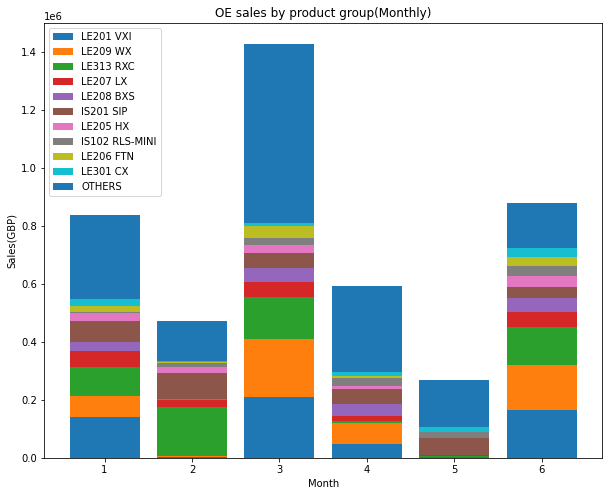

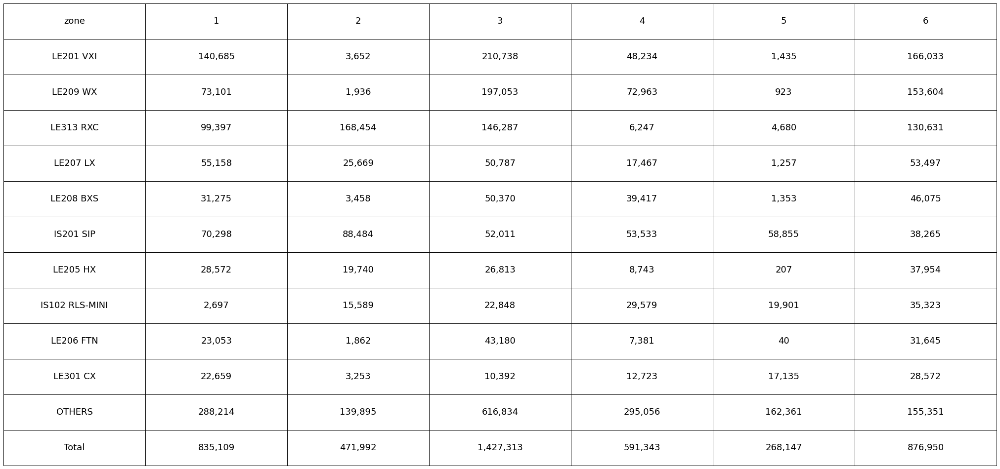

########################################################################################
OE 機種群別売上データ（YTD）
年


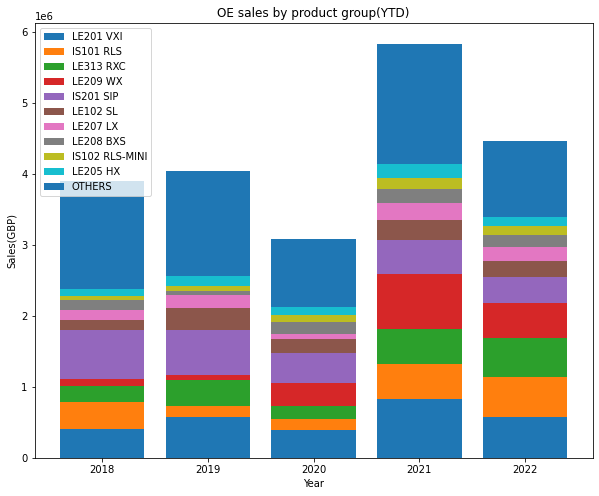

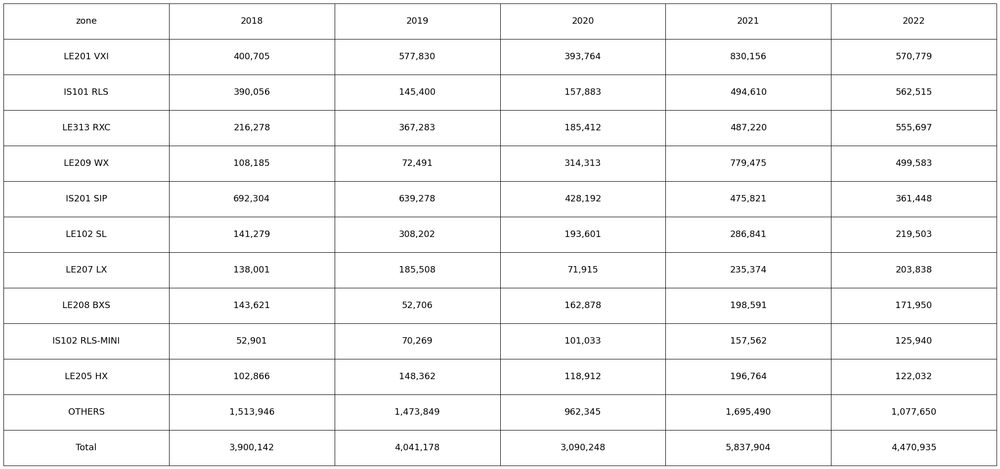

########################################################################################
#############################
各地域機種群別売上データ
#############################
UK&IE 機種群別売上データ（月次）
月


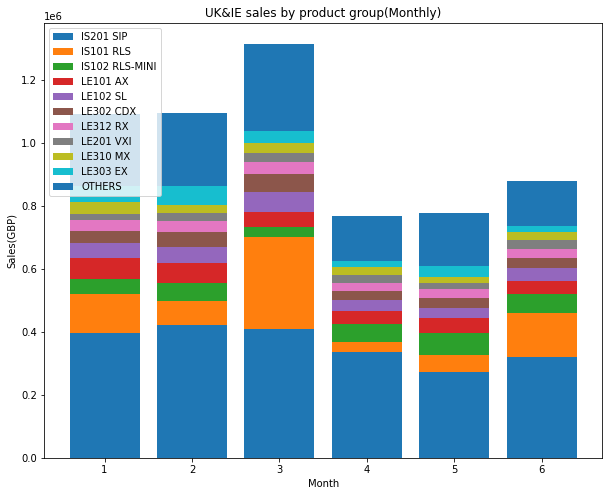

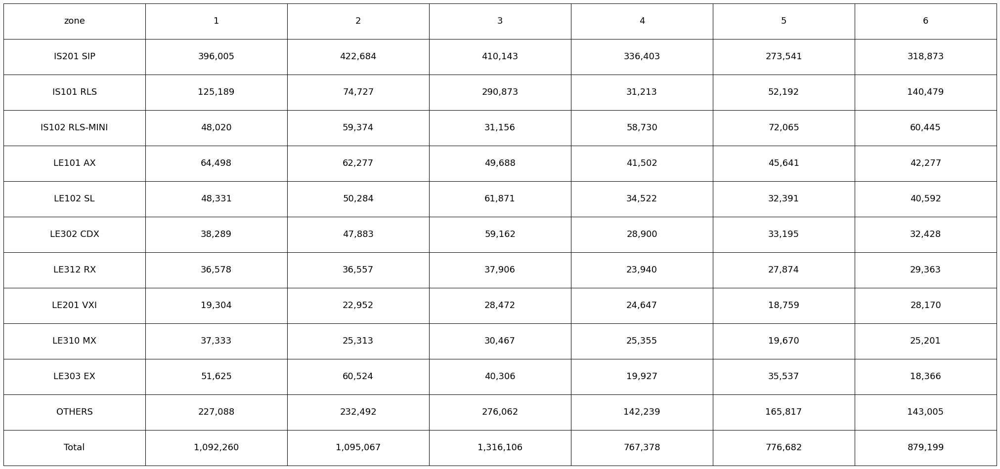

########################################################################################
UK&IE 機種群別売上データ（YTD）
年


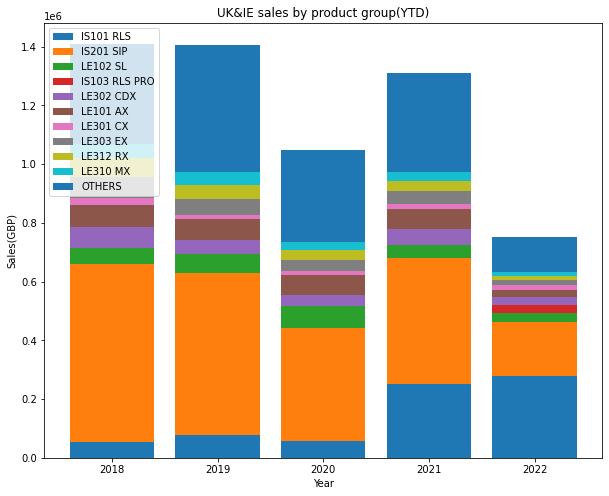

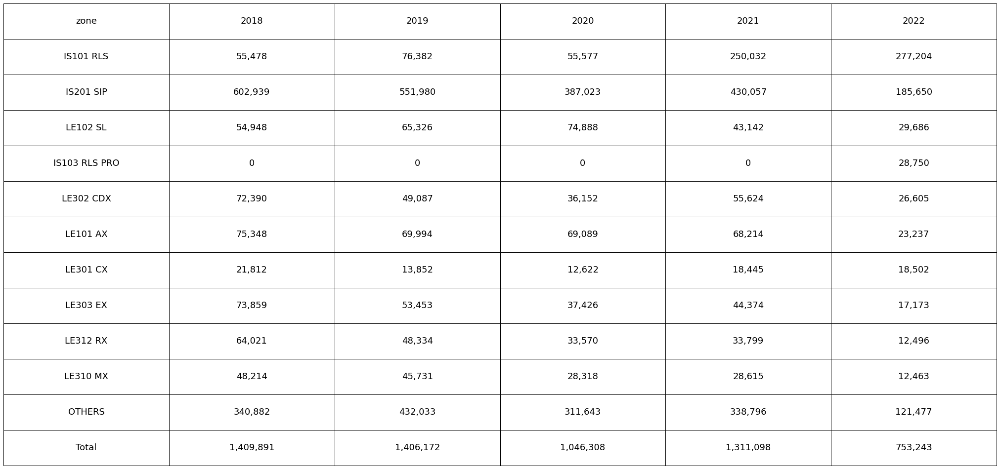

########################################################################################
AFRICA 機種群別売上データ（月次）
月


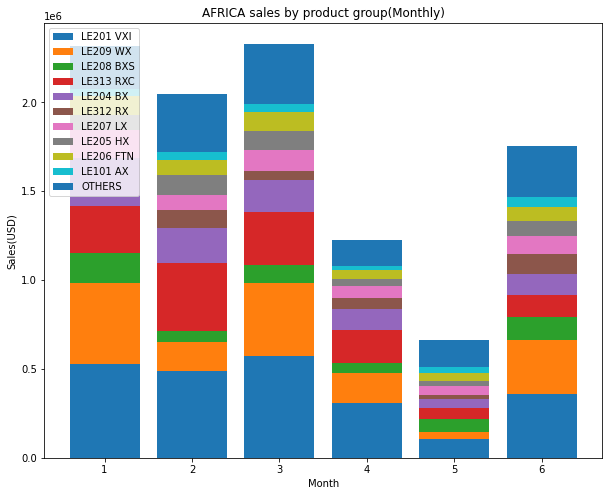

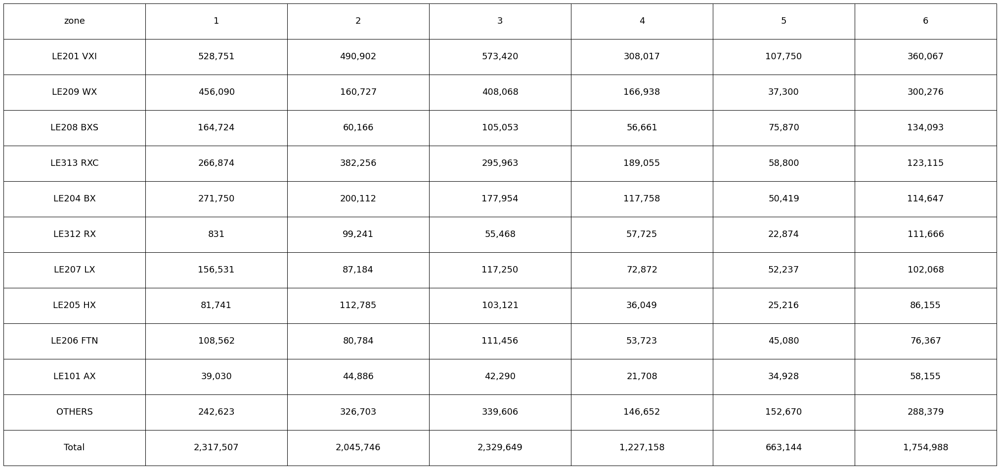

########################################################################################
AFRICA 機種群別売上データ（YTD）
年


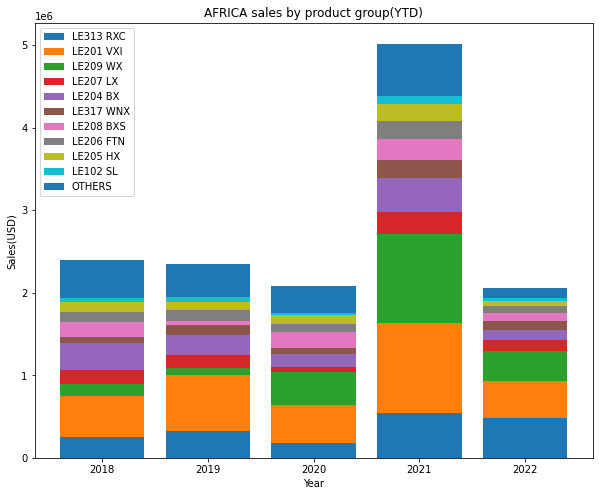

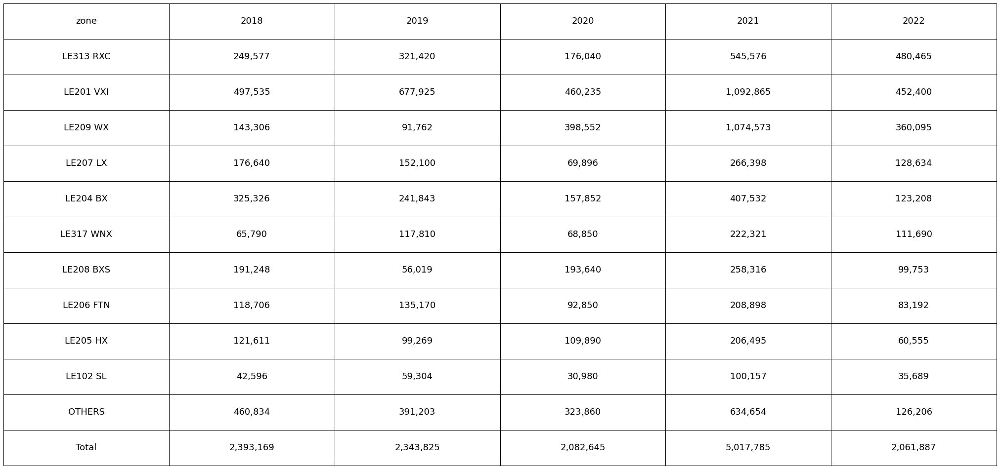

########################################################################################
CIS 機種群別売上データ（月次）
月


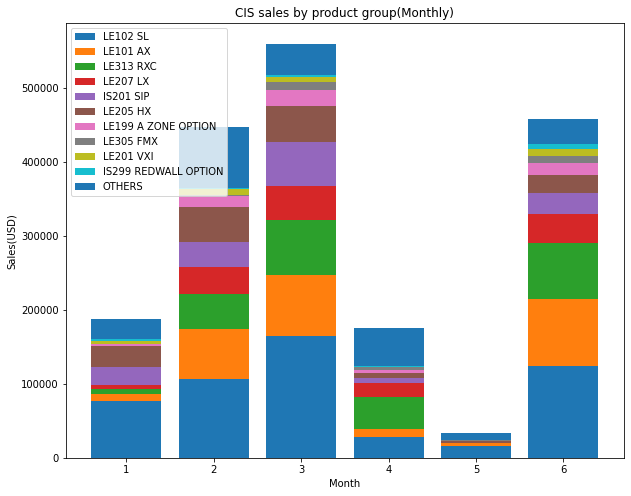

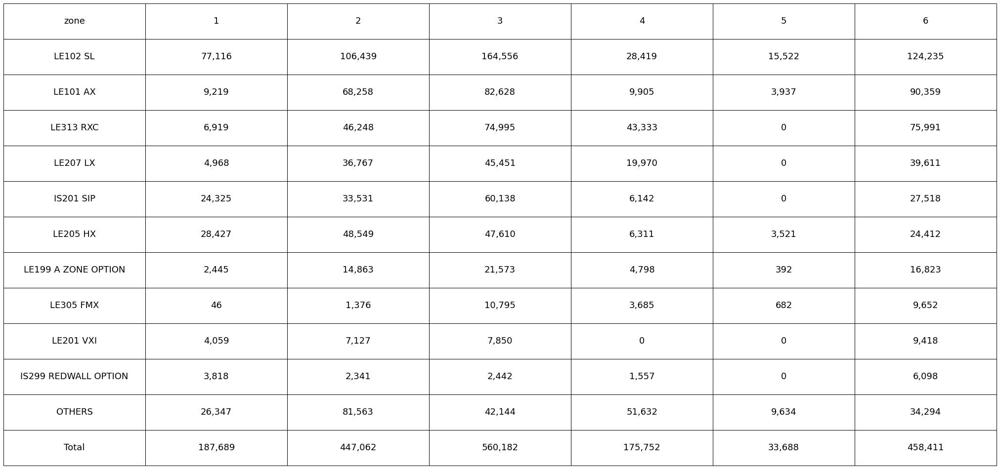

########################################################################################
CIS 機種群別売上データ（YTD）
年


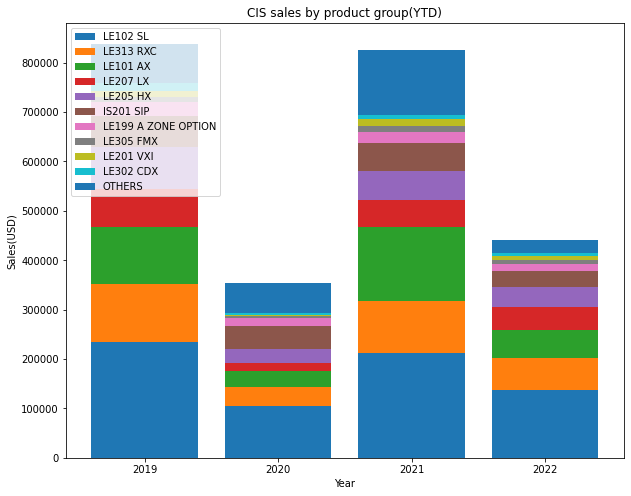

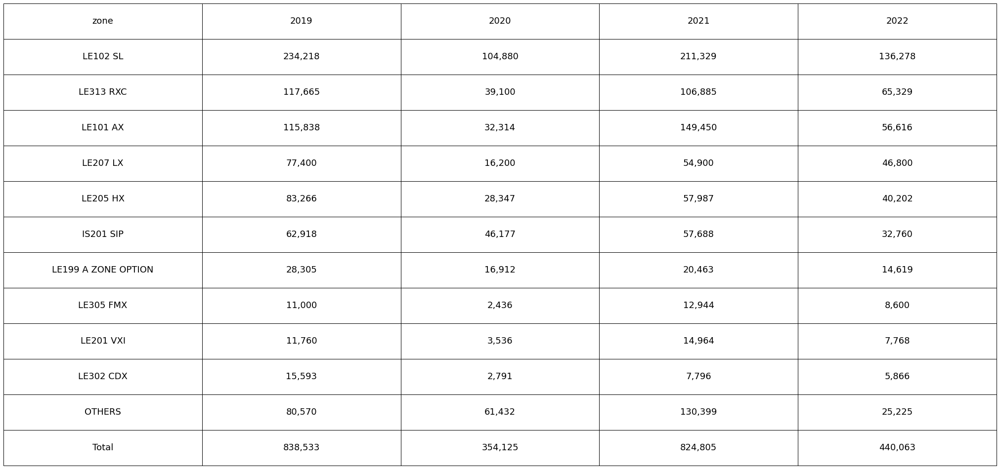

########################################################################################
ME 機種群別売上データ（月次）
月


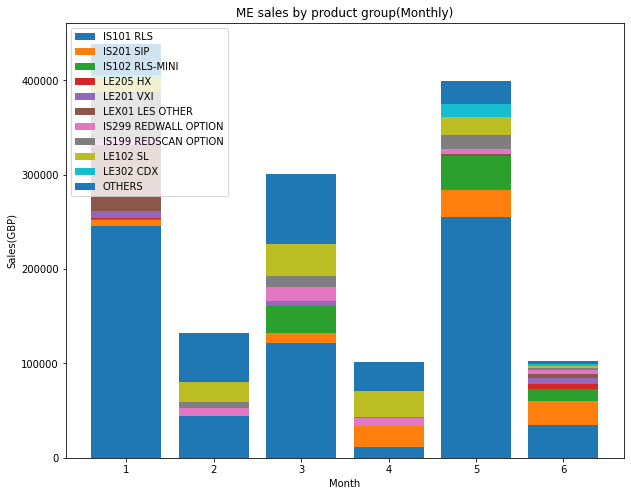

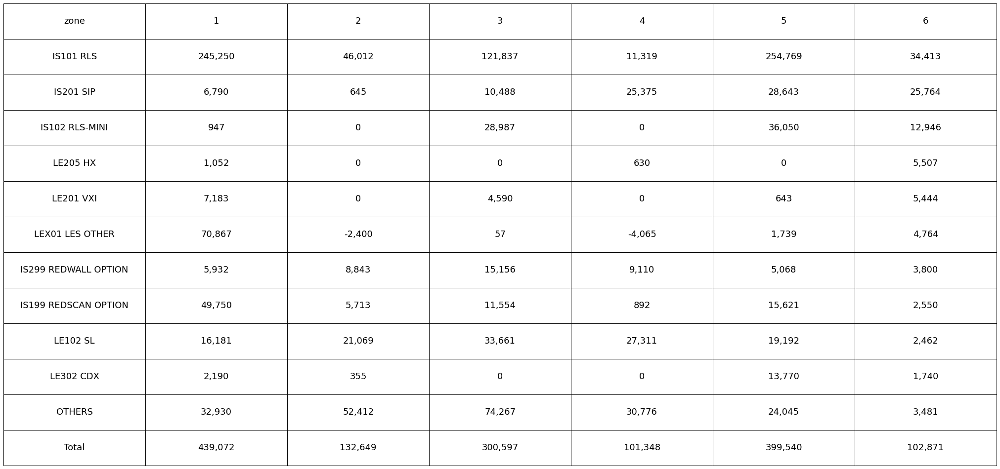

########################################################################################
ME 機種群別売上データ（YTD）
年


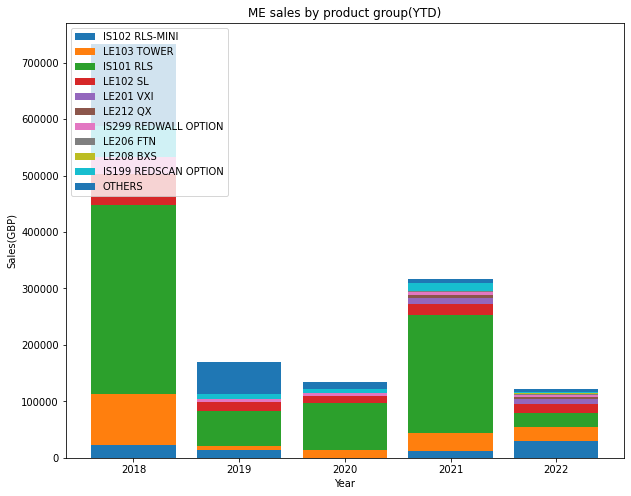

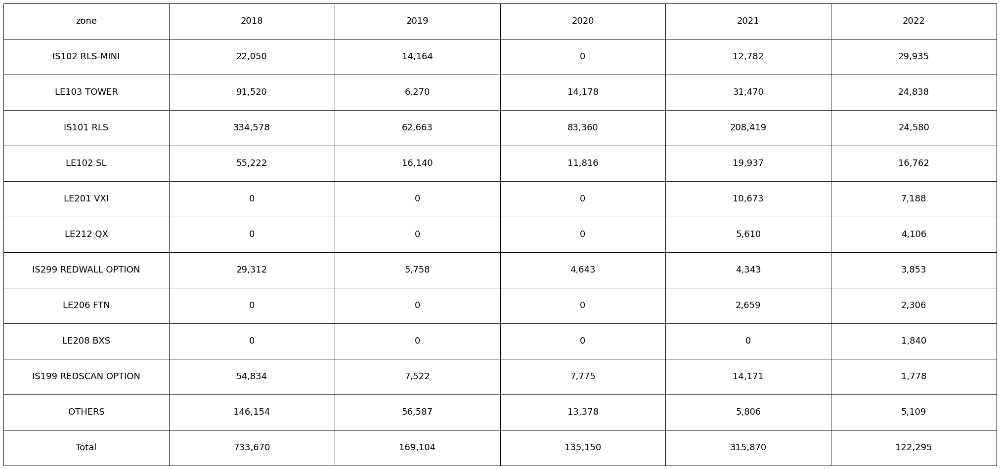

########################################################################################
#############################
各地域顧客別売上データ
#############################
UK&IE 顧客別売上データ（月次）
月


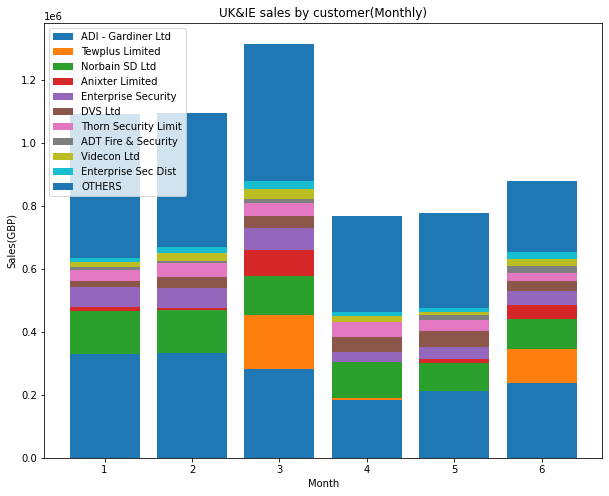

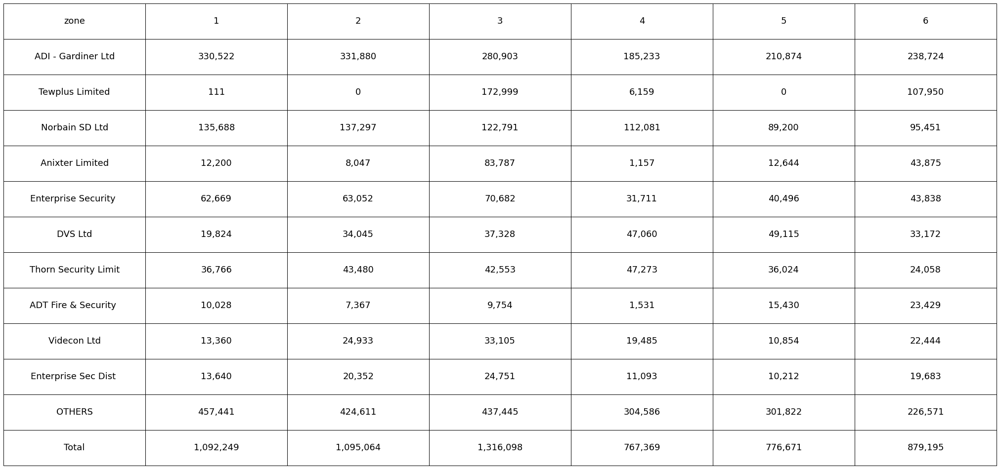

########################################################################################
UK&IE 顧客別売上データ（YTD）
年


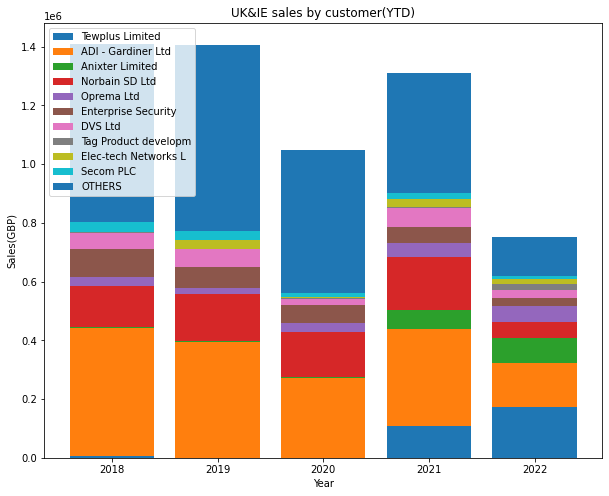

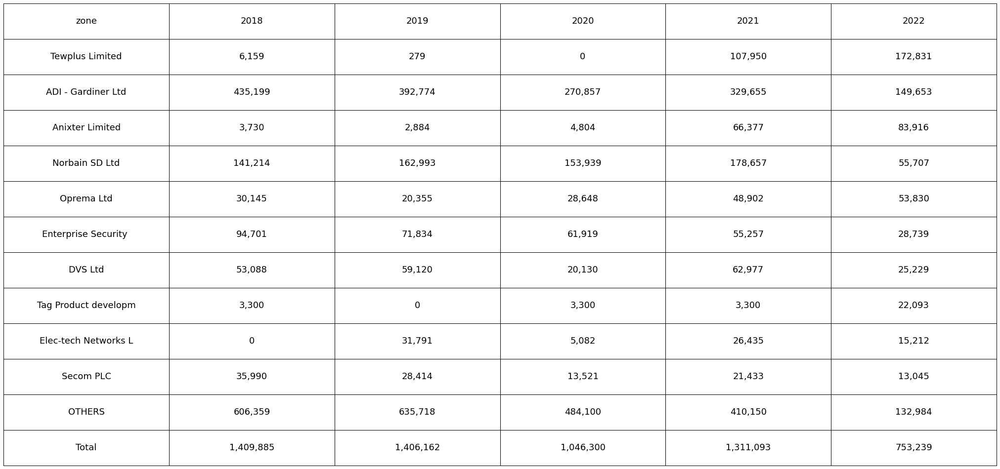

########################################################################################
AFRICA 顧客別売上データ（月次）
月


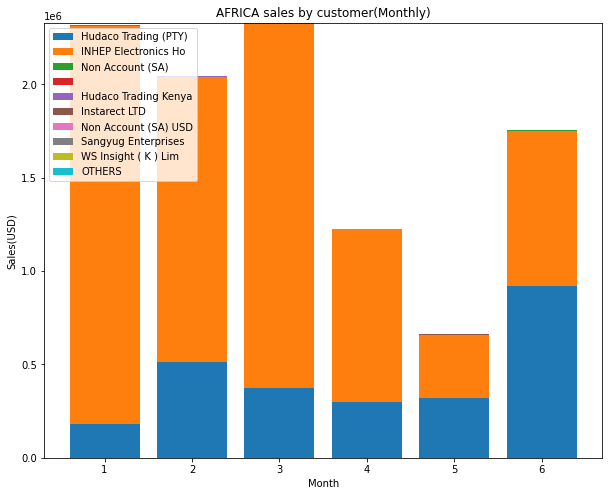

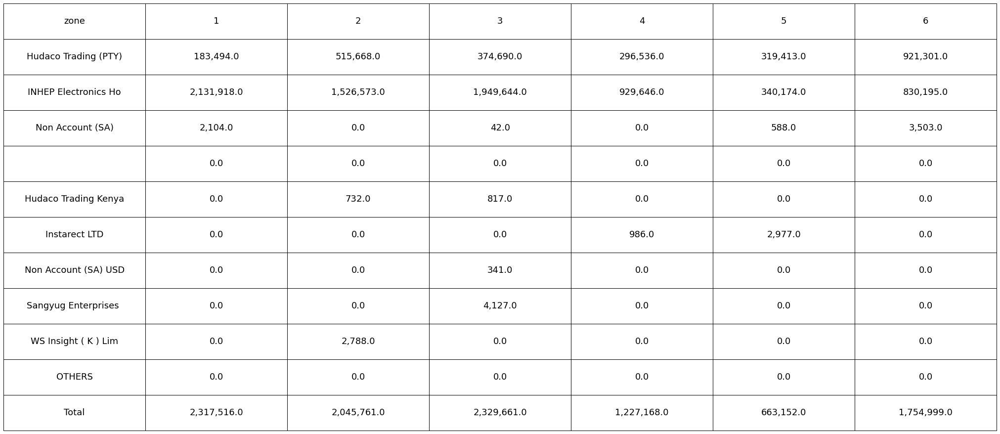

########################################################################################
AFRICA 顧客別売上データ（YTD）
年


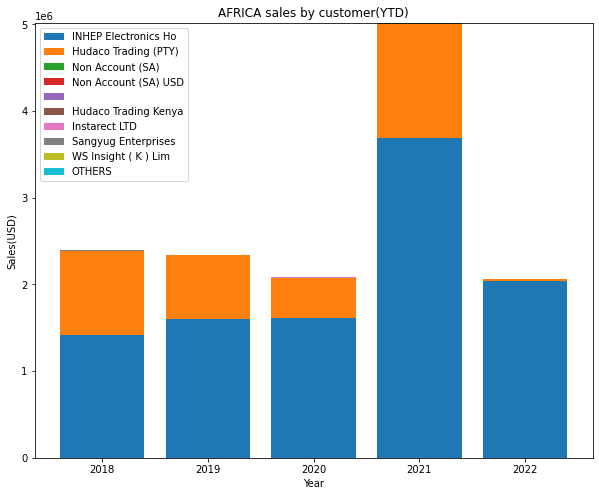

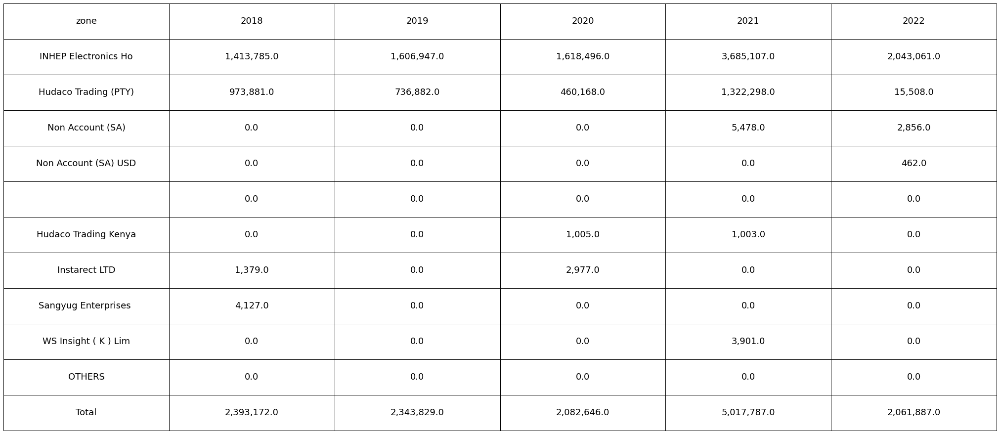

########################################################################################
CIS 顧客別売上データ（月次）
月


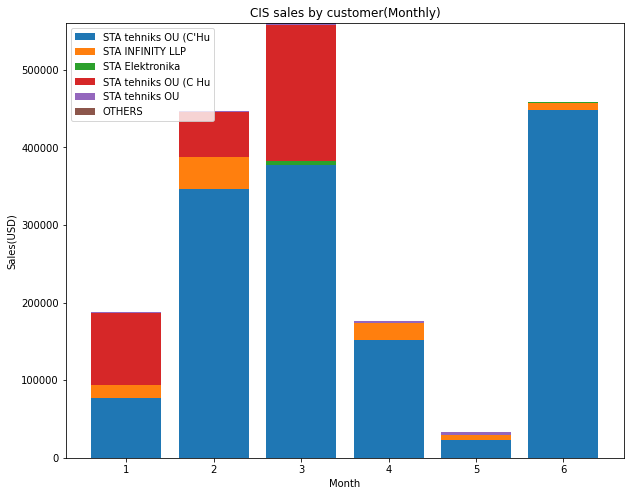

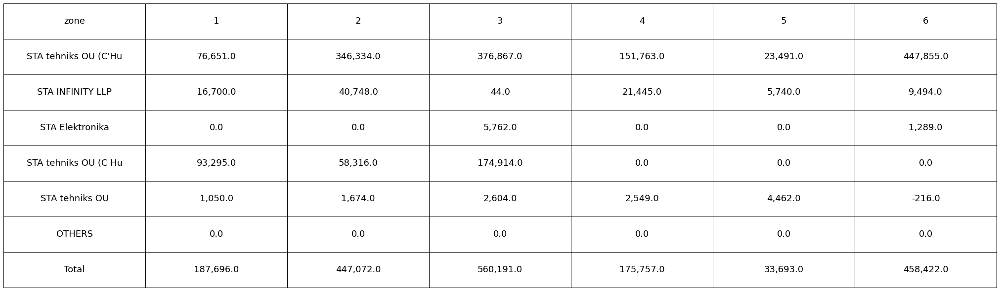

########################################################################################
CIS 顧客別売上データ（YTD）
年


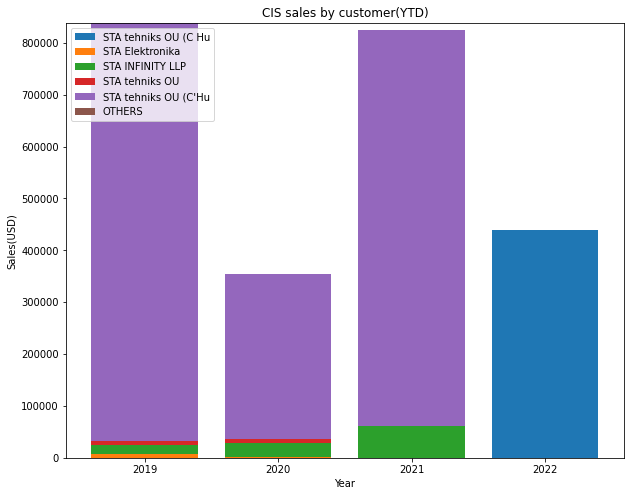

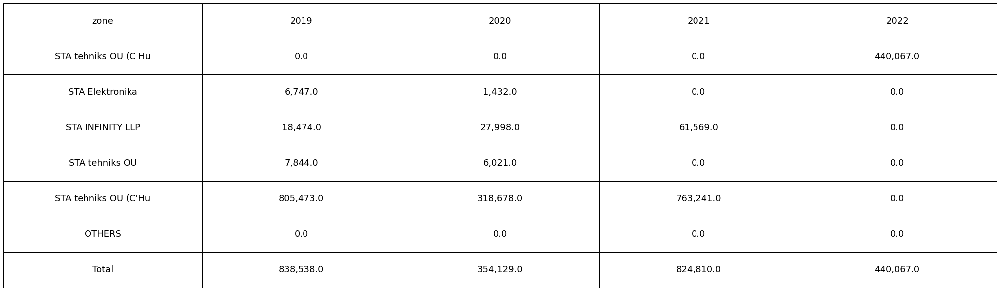

########################################################################################
ME 顧客別売上データ（月次）
月


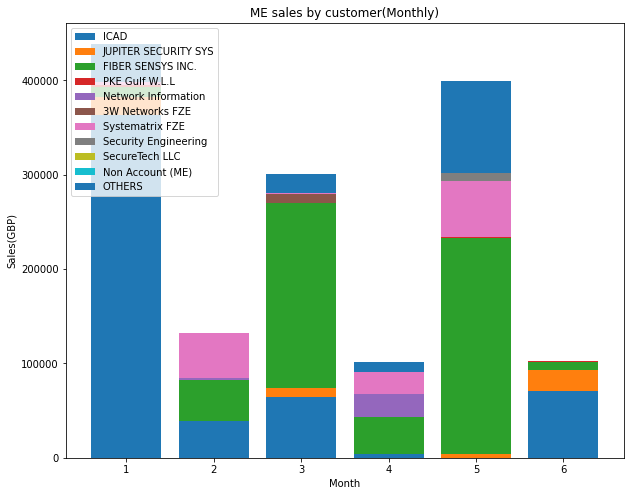

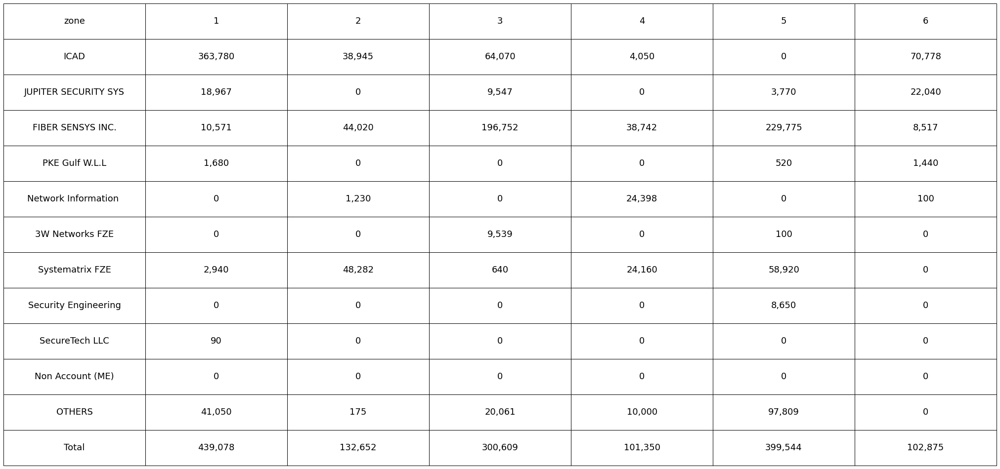

########################################################################################
ME 顧客別売上データ（YTD）
年


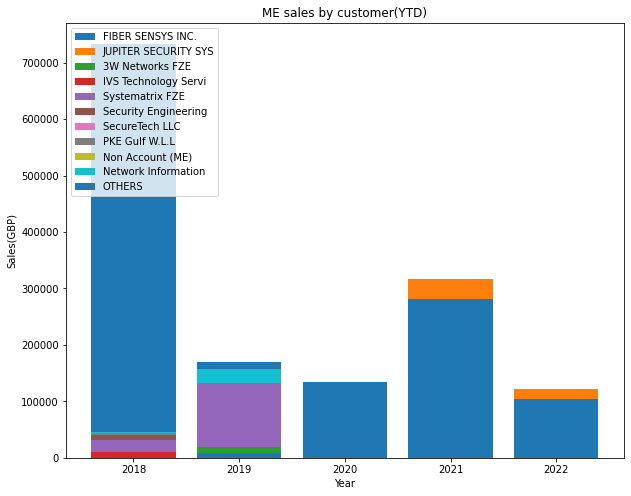

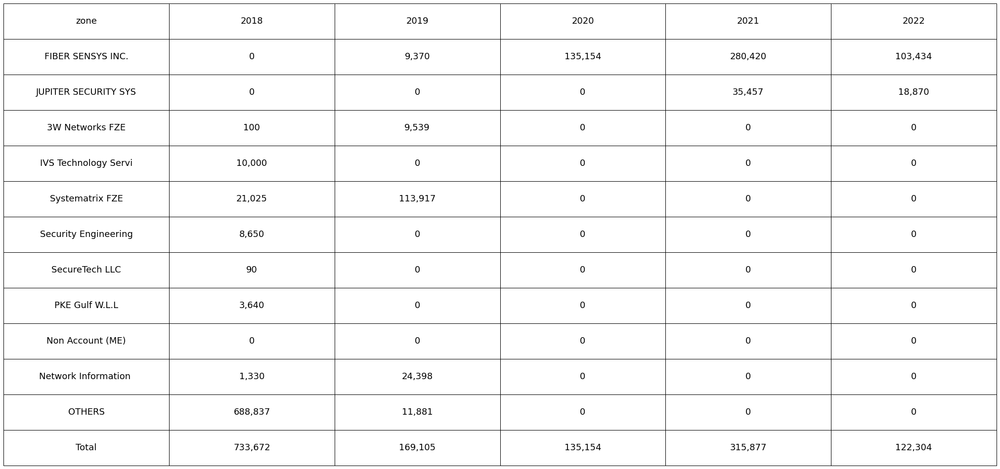

########################################################################################


In [ ]:

import time

#######################################################
#顧客別データ加工
#######################################################

########################################
#OE
########################################

print("#############################")
print("OE")
print("#############################")


####################
#OE 売上データ（YTD）
####################


print("OE 売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]

display(OE_dep_YTD)
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '部門', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(GBP)','OE sales(Monthly)','OE')
create_table_img(OE_dep_YTD)


print("########################################################################################")



print("OE 売上データ（YTD）")
OE_dep_YTD=df_OE.copy()
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '部門', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(GBP)','OE sales(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("OE Zone別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン（中）', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(GBP)','OE sales(Monthly) by zone','OE')
create_table_img(OE_dep_YTD)


print("########################################################################################")



print("OE Zone別売上データ（YTD）")
OE_dep_YTD=df_OE.copy()
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン（中）', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(GBP)','OE sales(YTD) by zone','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

####################
#OE 顧客別売上データ（YTD）
####################

print("OE 顧客別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '得意先', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(GBP)','OE sales by customer(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("OE 顧客別売上データ（YTD）")
OE_dep_YTD=df_OE.copy()
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '得意先', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(GBP)','OE sales by customer(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

####################
#OE 機種群別売上データ（YTD）
####################

print("OE 機種群別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(GBP)','OE sales by product group(Monthly)','OE')
create_table_img(OE_dep_YTD)


print("########################################################################################")

print("OE 機種群別売上データ（YTD）")
OE_dep_YTD=df_OE.copy()
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(GBP)','OE sales by product group(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("#############################")
print("各地域機種群別売上データ")
print("#############################")


####################
#UK&IE 機種群別売上データ（YTD）
####################

print("UK&IE 機種群別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('UK&IE')]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(GBP)','UK&IE sales by product group(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("UK&IE 機種群別売上データ（YTD）")
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('UK&IE')]
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(GBP)','UK&IE sales by product group(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

####################
#AFRICA 機種群別売上データ（YTD）
####################

print("AFRICA 機種群別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('AFRICA')]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(USD)','AFRICA sales by product group(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("AFRICA 機種群別売上データ（YTD）")
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('AFRICA')]
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(USD)','AFRICA sales by product group(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

####################
#CIS 機種群別売上データ（YTD）
####################

print("CIS 機種群別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('CIS')]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(USD)','CIS sales by product group(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("CIS 機種群別売上データ（YTD）")
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('CIS')]
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(USD)','CIS sales by product group(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

####################
#ME 機種群別売上データ（YTD）
####################

print("ME 機種群別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('ME')]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(GBP)','ME sales by product group(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("ME 機種群別売上データ（YTD）")
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('ME')]
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(GBP)','ME sales by product group(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")


print("#############################")
print("各地域顧客別売上データ")
print("#############################")


####################
#UK&IE 顧客別売上データ（YTD）
####################

print("UK&IE 顧客別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('UK&IE')]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '得意先', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(GBP)','UK&IE sales by customer(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")


print("UK&IE 顧客別売上データ（YTD）")
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('UK&IE')]
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '得意先', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(GBP)','UK&IE sales by customer(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

####################
#AFRICA 顧客別売上データ（YTD）
####################

print("AFRICA 顧客別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('AFRICA')]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '得意先', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(USD)','AFRICA sales by customer(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("AFRICA 顧客別売上データ（YTD）")
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('AFRICA')]
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(USD)','AFRICA sales by customer(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

####################
#CIS 顧客別売上データ（YTD）
####################

print("CIS 顧客別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('CIS')]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '得意先', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(USD)','CIS sales by customer(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("CIS 顧客別売上データ（YTD）")
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('CIS')]
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(USD)','CIS sales by customer(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

####################
#ME 顧客別売上データ（YTD）
####################

print("ME 顧客別売上データ（月次）")

d_today = datetime.date.today()
OE_dep_YTD=df_OE.copy()
if(d_today.month==1):
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year-1]
else:
  OE_dep_YTD=OE_dep_YTD[OE_dep_YTD['年']==d_today.year]
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('ME')]

OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '得意先', '月', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Month','Sales(GBP)','ME sales by customer(Monthly)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")

print("ME 顧客別売上データ（YTD）")
OE_dep_YTD=df_OE[df_OE['部門'].str.startswith('ME')]
OE_dep_YTD=create_pivot(OE_dep_YTD, '売上高　金額(会社通貨)', '得意先', '年', YTD=1,num=10)

bar_graph(OE_dep_YTD, 'Year','Sales(GBP)','ME sales by customer(YTD)','OE')
create_table_img(OE_dep_YTD)

print("########################################################################################")



#OSF

#############################
OS
#############################
OSF 売上データ（月次）
月


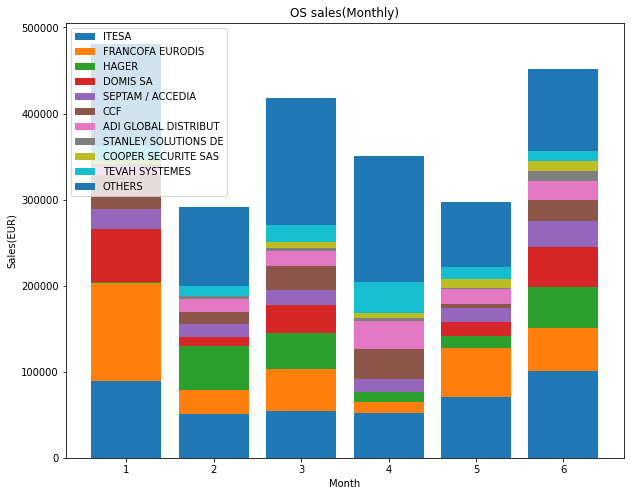

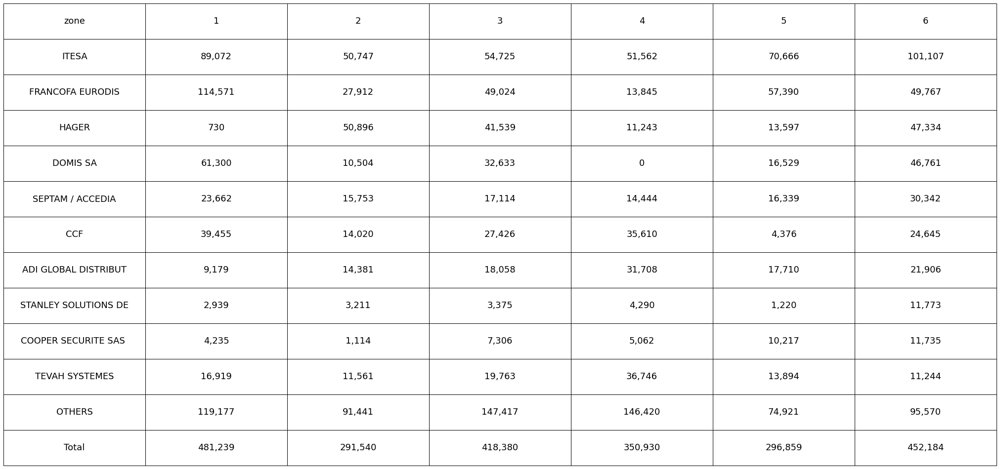

########################################################################################
OS 顧客別売上データ（YTD）
年


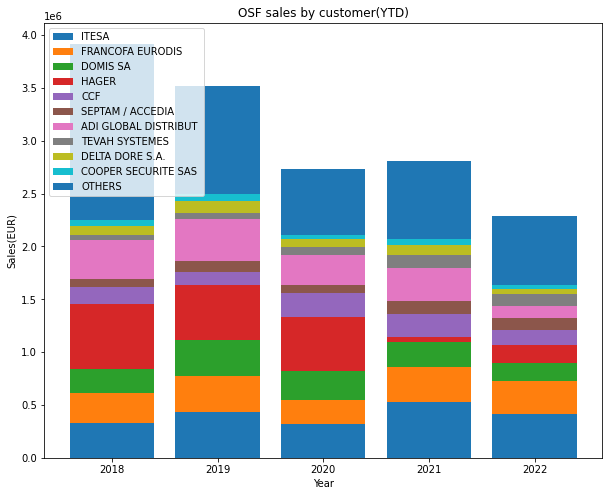

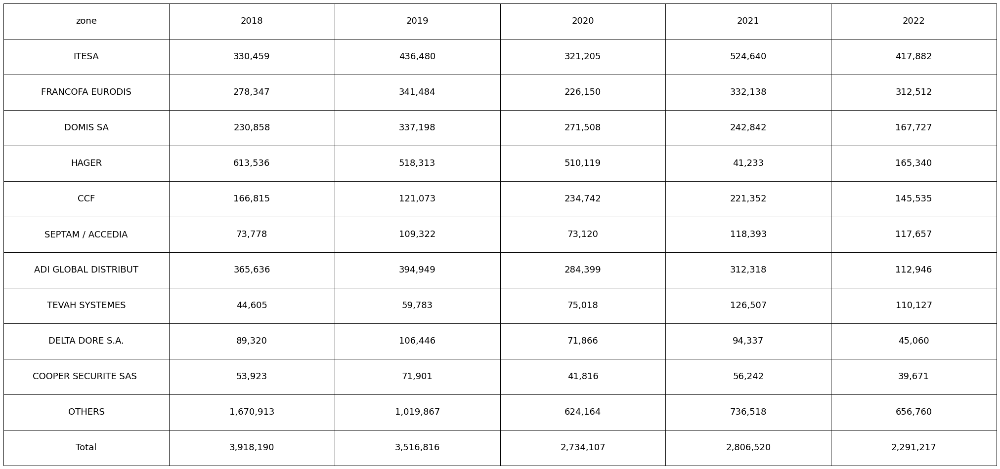

########################################################################################
OSF Zone別売上データ（月次）
月


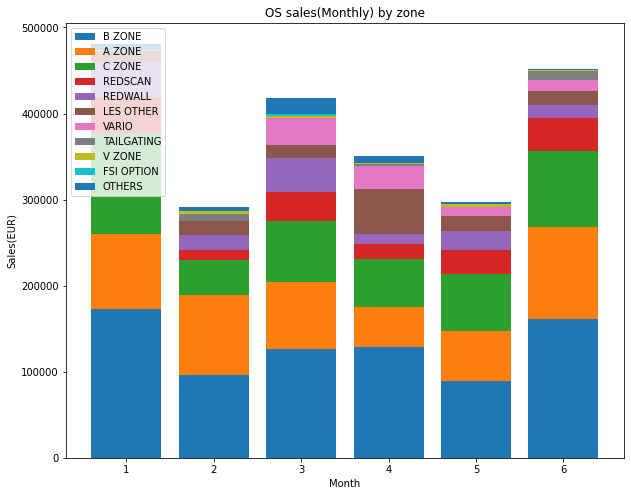

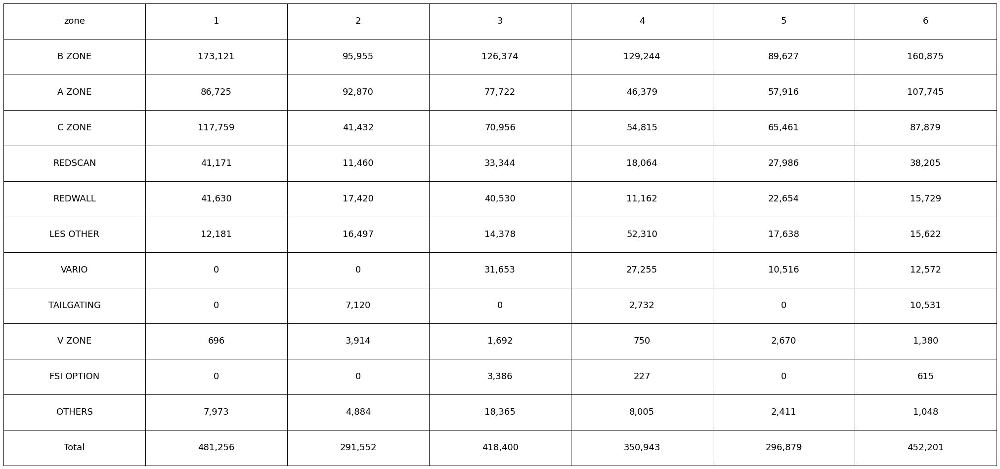

########################################################################################
OS Zone別売上データ（YTD）
年


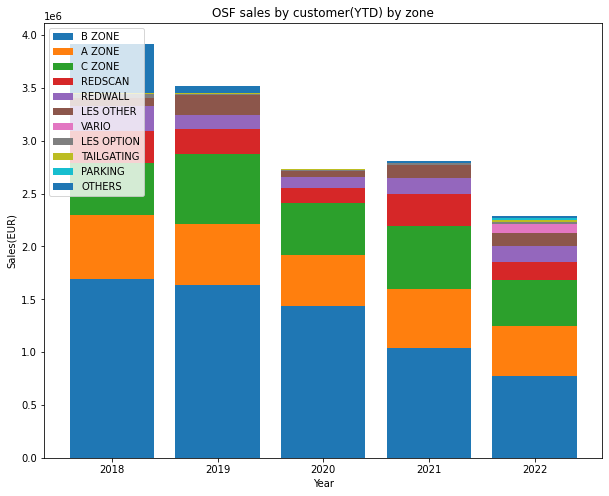

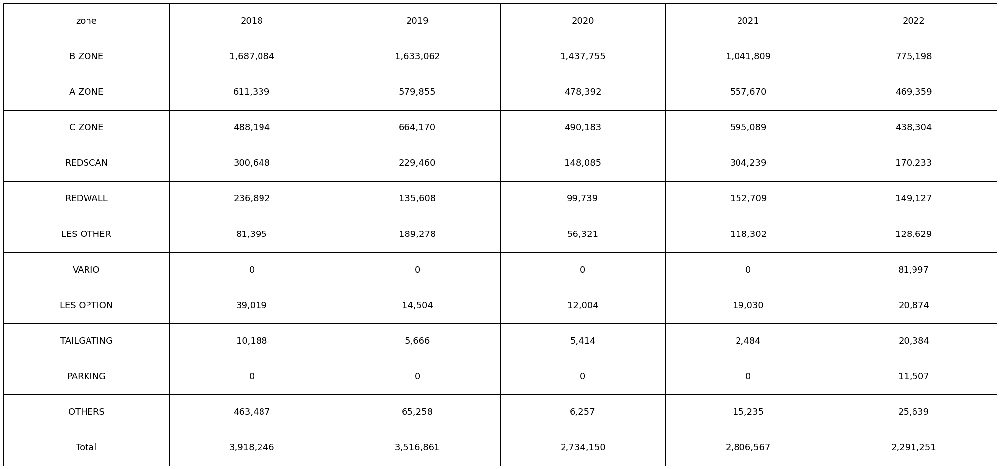

########################################################################################
OSF 売上データ（月次）
月


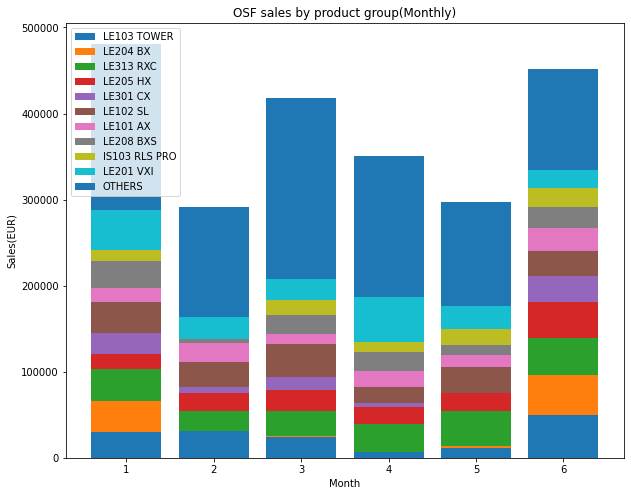

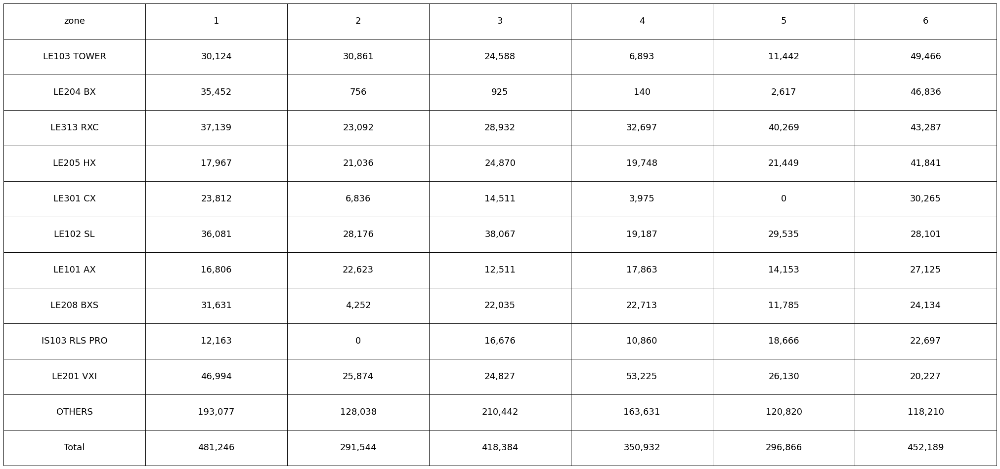

########################################################################################
OS 機種群別売上データ（YTD）
年


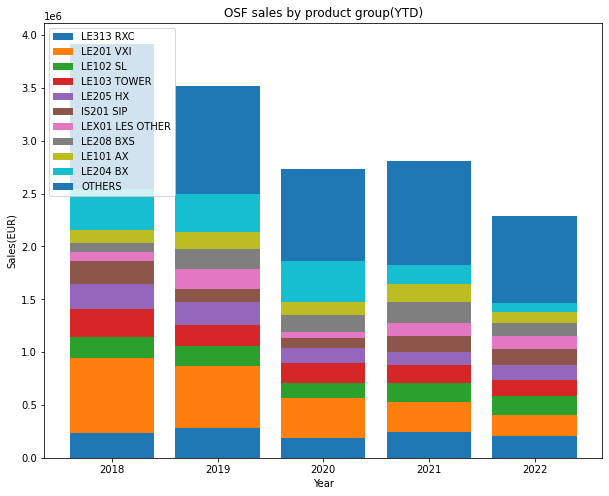

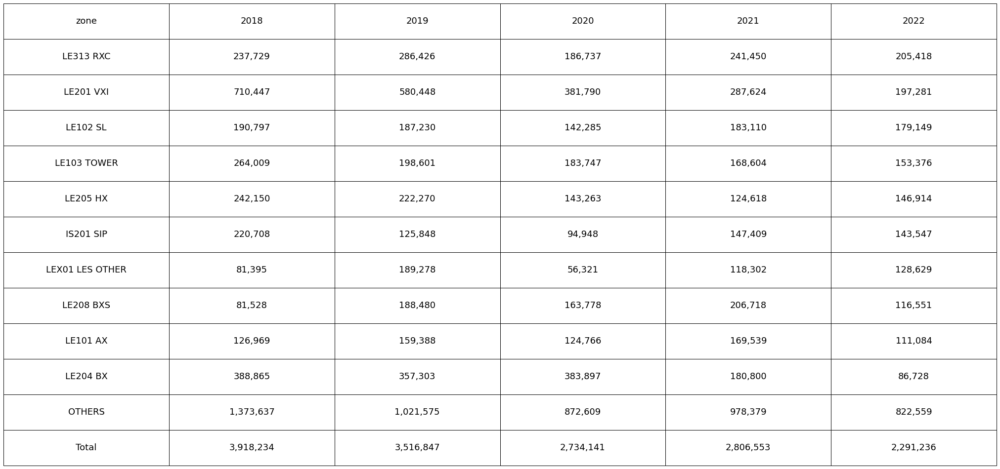

########################################################################################


In [ ]:


########################################
#OS
########################################

print("#############################")
print("OS")
print("#############################")


print("OSF 売上データ（月次）")

d_today = datetime.date.today()
OS_dep_YTD=df_OS.copy()
if(d_today.month==1):
  OS_dep_YTD=OS_dep_YTD[OS_dep_YTD['年']==d_today.year-1]
else:
  OS_dep_YTD=OS_dep_YTD[OS_dep_YTD['年']==d_today.year]

OS_dep_YTD=create_pivot(OS_dep_YTD, '売上高　金額(会社通貨)', '得意先', '月', YTD=1,num=10)

bar_graph(OS_dep_YTD, 'Month','Sales(EUR)','OS sales(Monthly)','OSF')
create_table_img(OS_dep_YTD)


print("########################################################################################")



####################
#顧客別売上データ（YTD）
####################

print("OS 顧客別売上データ（YTD）")
OS_dep_YTD=df_OS
OS_dep_YTD=create_pivot(OS_dep_YTD, '売上高　金額(会社通貨)', '得意先', '年', YTD=1,num=10)

bar_graph(OS_dep_YTD, 'Year','Sales(EUR)','OSF sales by customer(YTD)','OSF')
create_table_img(OS_dep_YTD)
print("########################################################################################")


####################
#Zone別売上データ（YTD）
####################
print("OSF Zone別売上データ（月次）")

d_today = datetime.date.today()
OS_dep_YTD=df_OS.copy()
if(d_today.month==1):
  OS_dep_YTD=OS_dep_YTD[OS_dep_YTD['年']==d_today.year-1]
else:
  OS_dep_YTD=OS_dep_YTD[OS_dep_YTD['年']==d_today.year]

OS_dep_YTD=create_pivot(OS_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン（中）', '月', YTD=1,num=10)

bar_graph(OS_dep_YTD, 'Month','Sales(EUR)','OS sales(Monthly) by zone','OSF')
create_table_img(OS_dep_YTD)


print("########################################################################################")

print("OS Zone別売上データ（YTD）")
OS_dep_YTD=df_OS
OS_dep_YTD=create_pivot(OS_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン（中）', '年', YTD=1,num=10)

bar_graph(OS_dep_YTD, 'Year','Sales(EUR)','OSF sales by customer(YTD) by zone','OSF')
create_table_img(OS_dep_YTD)
print("########################################################################################")

####################
#機種群別売上データ（YTD）
####################

print("OSF 売上データ（月次）")

d_today = datetime.date.today()
OS_dep_YTD=df_OS.copy()
if(d_today.month==1):
  OS_dep_YTD=OS_dep_YTD[OS_dep_YTD['年']==d_today.year-1]
else:
  OS_dep_YTD=OS_dep_YTD[OS_dep_YTD['年']==d_today.year]

OS_dep_YTD=create_pivot(OS_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '月', YTD=1,num=10)

bar_graph(OS_dep_YTD, 'Month','Sales(EUR)','OSF sales by product group(Monthly)','OSF')
create_table_img(OS_dep_YTD)

print("########################################################################################")

print("OS 機種群別売上データ（YTD）")
OS_dep_YTD=df_OS
OS_dep_YTD=create_pivot(OS_dep_YTD, '売上高　金額(会社通貨)', 'ディビジョン', '年', YTD=1,num=10)

bar_graph(OS_dep_YTD, 'Year','Sales(EUR)','OSF sales by product group(YTD)','OSF')
create_table_img(OS_dep_YTD)

print("########################################################################################")





#OTBV

#############################
OTBV
#############################
OTBV 売上データ（月次）
月


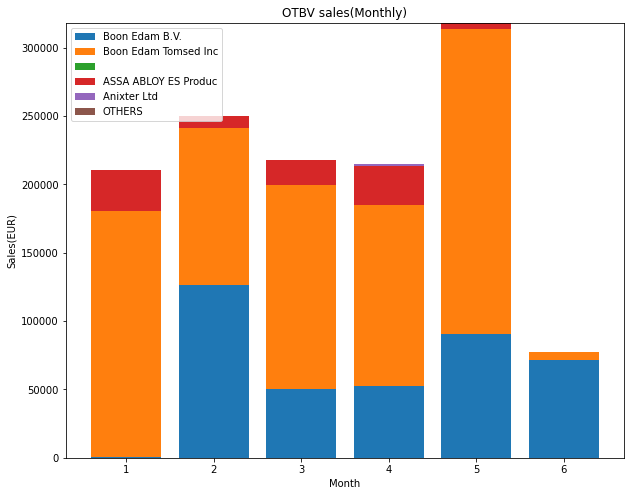

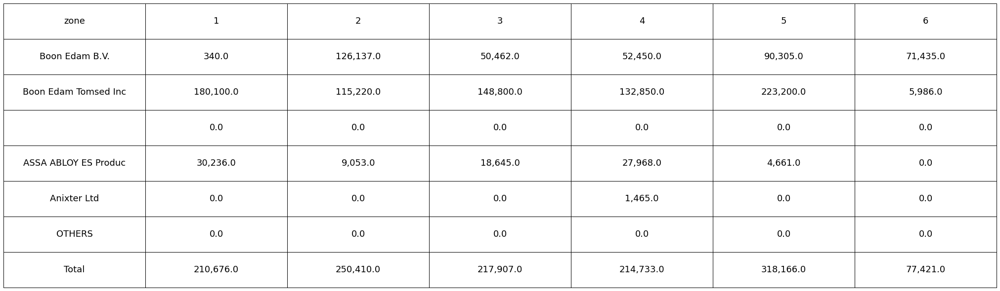

########################################################################################
OTBV 顧客別売上データ（YTD）
年


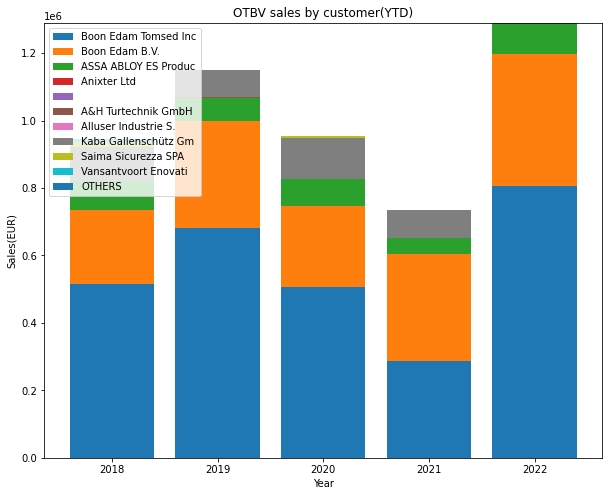

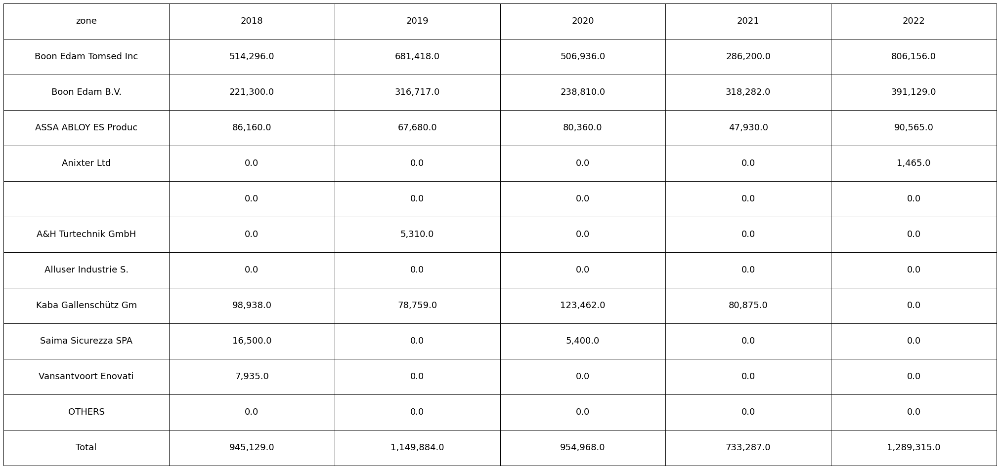

########################################################################################


In [ ]:


########################################
#OTBV
########################################

print("#############################")
print("OTBV")
print("#############################")


print("OTBV 売上データ（月次）")

d_today = datetime.date.today()
OTBV_dep_YTD=df_OTBV.copy()
if(d_today.month==1):
  OTBV_dep_YTD=OTBV_dep_YTD[OTBV_dep_YTD['年']==d_today.year-1]
else:
  OTBV_dep_YTD=OTBV_dep_YTD[OTBV_dep_YTD['年']==d_today.year]

OTBV_dep_YTD=create_pivot(OTBV_dep_YTD, '売上高　金額(会社通貨)', '得意先', '月', YTD=1,num=10)

bar_graph(OTBV_dep_YTD, 'Month','Sales(EUR)','OTBV sales(Monthly)','OTBV')
create_table_img(OTBV_dep_YTD)


print("########################################################################################")



####################
#顧客別売上データ（YTD）
####################

print("OTBV 顧客別売上データ（YTD）")
OTBV_dep_YTD=df_OTBV.copy()
OTBV_dep_YTD=create_pivot(OTBV_dep_YTD, '売上高　金額(会社通貨)', '得意先', '年', YTD=1,num=10)

bar_graph(OTBV_dep_YTD, 'Year','Sales(EUR)','OTBV sales by customer(YTD)','OTBV')
create_table_img(OTBV_dep_YTD)
print("########################################################################################")



#OI

In [ ]:


#######################################################
#顧客別データ加工
#######################################################

########################################
#OI
########################################

print("#############################")
print("OI")
print("#############################")


####################
#売上データ（通年）
####################

print("OI 売上データ（通年）")
OI_dep=df_OI
OI_dep=create_pivot(OI_dep, '売上高　金額（取引通貨）', '部門', '年',num=7)
display(OI_dep)

bar_graph(OI_dep, 'Year','Sales(USD)','OI sales','OI')


####################
#売上データ（YTD）
####################

print("OI 売上データ（YTD）")
OI_dep_YTD=df_OI
OI_dep_YTD=create_pivot(OI_dep_YTD, '売上高　金額（取引通貨）', '部門', '年', YTD=1,num=7)
display(OI_dep_YTD)

bar_graph(OI_dep_YTD, 'Year','Sales(USD)','OI sales(YTD)','OI')


####################
#zone 売上データ（通年）
####################

print("OI Zone別売上データ（通年）")
OI_div=df_OI
OI_div=create_pivot(OI_div, '売上高　金額（取引通貨）', 'ディビジョン', '年')
display(OI_div)

bar_graph(OI_div, 'Year','Sales(USD)','OI sales by zone','OI')


####################
#zone 売上データ（YTD）
####################

print("OI Zone別売上データ（YTD）")
OI_div_YTD=df_OI
OI_div_YTD=create_pivot(OI_div_YTD, '売上高　金額（取引通貨）', 'ディビジョン', '年',YTD=1)
display(OI_div)

bar_graph(OI_div_YTD, 'Year','Sales(USD)','OI sales by zone(YTD)','OI')




####################
#顧客別売上データ（通年）
####################

print("OI 顧客別売上データ（通年）")
OI_cust=df_OI
OI_cust=create_pivot(OI_cust, '売上高　金額（取引通貨）', '得意先', '年',num=10)
display(OI_cust)

bar_graph(OI_cust, 'Year','Sales(USD)','OI sales by customer','OI')


####################
#顧客別売上データ（YTD）
####################

print("OI 顧客別売上データ（YTD）")
OI_dep_YTD=df_OI
OI_dep_YTD=create_pivot(OI_dep_YTD, '売上高　金額（取引通貨）', '得意先', '年', YTD=1,num=10)
display(OI_dep_YTD)

bar_graph(OI_dep_YTD, 'Year','Sales(USD)','OI sales by customer(YTD)','OI')


####################
#時系列顧客売上、移動平均プロット
####################

from dateutil.relativedelta import relativedelta#削除してよい

OI_cust_plot=df_OI

xmonthago = d_today - relativedelta(months=24)

OI_cust_plot=OI_cust_plot[OI_cust_plot['年']>=xmonthago.year]
OI_cust_plot=OI_cust_plot[(~OI_cust_plot['年']<d_today.year)&(~OI_cust_plot['月']<xmonthago.month)]

OI_cust_plot=OI_cust_plot.pivot_table(values=['売上高　金額（取引通貨）'],
                               index=['得意先'],columns=['年','月'],
                               aggfunc='sum', fill_value=0)#,margins=True,margins_name='TOTAL')

OI_cust_plot = pd.concat([OI_cust_plot, pd.DataFrame(OI_cust_plot.sum(axis=1), columns=['Total'])], axis=1)
OI_cust_plot=OI_cust_plot.reindex(OI_cust_plot.sort_values(by='Total', ascending=False).index)
OI_cust_plot=OI_cust_plot[:20]
OI_cust_plot=OI_cust_plot.drop('Total', axis=1)

cust_sales(OI_cust_plot,'OI/cust_sales','USD')






##########################################################################
#製品群別台数のグラフ作成(OI)
##########################################################################

productG=df_SEC
productG=productG[productG['会社'].str.startswith("OPTEX INCORPORATED")]
productG=productG[productG['ディビジョン'].str.startswith('LE')|productG['ディビジョン'].str.startswith('IS')|productG['ディビジョン'].str.startswith('LE')]

productG=productG.pivot_table(values=['売上高　数量'],
                               index=['ディビジョン'],columns=['年','月'],
                               aggfunc='sum', fill_value=0)#,margins=True,margins_name='TOTAL')

display(productG)

plot_qty(productG,"OI/productG")





#APAC

In [ ]:


#######################################################
#顧客別データ加工
#######################################################

########################################
#APAC
########################################

print("#############################")
print("APAC")
print("#############################")


####################
#売上データ（通年）
####################

print("APAC 売上データ（通年）")
APAC=df_APAC
APAC=create_pivot(APAC, '売上金額', 'デパートメント（小）', '会計年度',num=7)
display(APAC)

bar_graph(APAC, 'Year','Sales(USD)','APAC sales','APAC')


####################
#売上データ（YTD）
####################

print("APAC 売上データ（YTD）")
APAC_YTD=df_APAC
APAC_YTD=create_pivot(APAC_YTD, '売上金額', 'デパートメント（小）', '会計年度', YTD=1,num=7)
display(APAC_YTD)

bar_graph(APAC_YTD, 'Year','Sales(USD)','APAC sales(YTD)','APAC')


####################
#zone 売上データ（通年）
####################

print("APAC Zone別売上データ（通年）")
APAC_div=df_APAC
APAC_div=create_pivot(APAC_div, '売上金額', 'ディビジョン（中）', '会計年度')
display(APAC_div)

bar_graph(APAC_div, 'Year','Sales(USD)','APAC sales by zone','APAC')


####################
#zone 売上データ（YTD）
####################

print("APAC Zone別売上データ（YTD）")
APAC_div_YTD=df_APAC
APAC_div_YTD=create_pivot(APAC_div_YTD, '売上金額', 'ディビジョン（中）', '会計年度',YTD=1)
display(APAC_div)

bar_graph(APAC_div_YTD, 'Year','Sales(USD)','APAC sales by zone(YTD)','APAC')




####################
#顧客別売上データ（通年）
####################

print("APAC 顧客別売上データ（通年）")
APAC_cust=df_APAC
APAC_cust=create_pivot(APAC_cust, '売上金額', '得意先名', '会計年度',num=10)
display(APAC_cust)

bar_graph(APAC_cust, 'Year','Sales(USD)','APAC sales by customer','APAC')


####################
#顧客別売上データ（YTD）
####################

print("APAC 顧客別売上データ（YTD）")
APAC_dep_YTD=df_APAC
APAC_dep_YTD=create_pivot(APAC_dep_YTD, '売上金額', '得意先名', '会計年度', YTD=1,num=10)
display(APAC_dep_YTD)

bar_graph(APAC_dep_YTD, 'Year','Sales(USD)','APAC sales by customer(YTD)','APAC')


####################
#時系列顧客売上、移動平均プロット
####################

from dateutil.relativedelta import relativedelta#削除してよい

APAC_cust_plot=df_APAC

xmonthago = d_today - relativedelta(months=24)

APAC_cust_plot=APAC_cust_plot[APAC_cust_plot['会計年度']>=xmonthago.year]
APAC_cust_plot=APAC_cust_plot[(~APAC_cust_plot['会計年度']<d_today.year)&(~APAC_cust_plot['会計期間']<xmonthago.month)]

APAC_cust_plot=APAC_cust_plot.pivot_table(values=['売上金額'],
                               index=['得意先名'],columns=['会計年度','会計期間'],
                               aggfunc='sum', fill_value=0)#,margins=True,margins_name='TOTAL')

APAC_cust_plot = pd.concat([APAC_cust_plot, pd.DataFrame(APAC_cust_plot.sum(axis=1), columns=['Total'])], axis=1)
APAC_cust_plot=APAC_cust_plot.reindex(APAC_cust_plot.sort_values(by='Total', ascending=False).index)
APAC_cust_plot=APAC_cust_plot[:20]
APAC_cust_plot=APAC_cust_plot.drop('Total', axis=1)

cust_sales(APAC_cust_plot,'APAC/cust_sales','USD')






##########################################################################
#製品群別台数のグラフ作成(APAC)
##########################################################################

APAC_div=df_APAC
APAC_div=APAC_div[APAC_div['会計年度']>2017]
APAC_div=APAC_div[APAC_div['ディビジョン（小）'].str.match('(?:VXI|VXS|BX|WX|RLS|CMOD|QXI|SL|AX|IVPC|RXC|CDX|SIP)')]

APACproductG=APAC_div.pivot_table(values=['数量'],
                               index=['ディビジョン（中）','ディビジョン（小）'],columns=['会計年度','会計期間'],
                               aggfunc='sum', fill_value=0)#,margins=True,margins_name='TOTAL')

plot_qty(APACproductG,"APAC/productG")





In [ ]:
display(APAC)

#各地域製品群別時系列データ

In [ ]:
print("#############################")
print("各地域製品群別時系列データ")
print("#############################")

plot_qty_for_each_region(df_ONL,"WEU", "ONL/WEU")
#plot_qty_for_each_region(df_ONL,"NEU", "ONL/NEU")
#plot_qty_for_each_region(df_ONL,"DACH", "ONL/DACH")
#plot_qty_for_each_region(df_ONL,"BENELUX", "ONL/BENELUX")
#plot_qty_for_each_region(df_ONL,"CEE", "ONL/CEE")
#plot_qty_for_each_region(df_OE,"UK&IE", "OE/UK&IE")

#挿入用HTML作成

In [ ]:
import string

!wget https://raw.githubusercontent.com/HirakuShibuya/data/master/SAC/sales_base_data/template.html

companies=['index','OE','OSF','OTBV','OI']

with open('template.html') as f:
  t=string.Template(f.read())

contents=[]

for company in companies:
  if company=="index":
    title="SEC ALL"
  else:
    title=company

  #Regionある会社のみ表示
  if company=='OE' or company=='OI':
    c_sales_by_region='''
    <h2>sales by Region</h2>
    <img src="graph/img/$company/$company sales.png" alt="sample" width="100%" height="100%" /><br>
    <img src="graph/img/$company/$company sales(YTD).png" alt="sample" width="100%" height="100%" /><br>
    '''
    t_sales_by_region=string.Template(c_sales_by_region)
    sales_by_region=t_sales_by_region.substitute(company=company)

  else:
    sales_by_region=""


  #index.html以外は顧客別時系列データを表示
  if company=='index':
    customer_sales=""
    cust_sales=""

  else:
    #棒グラフ
    html_c=cHtml(company+"/cust_sales")
    customer_sales+=html_c

    c_customer_sales='''
    <h2>sales by Customer</h2>
    <img src="graph/img/$company/$company sales by customer.png" alt="sample" width="100%" height="100%" /><br>
    <img src="graph/img/$company/$company sales by customer(YTD).png" alt="sample" width="100%" height="100%" /><br>
    '''
    t_customer_sales=string.Template(c_customer_sales)
    customer_sales=t_customer_sales.substitute(company=company)

    #顧客時系列
    cust_sales='<h2>customer sales timeseries</h2>'
    html_p=cHtml(company+"/cust_sales")
    cust_sales+=html_p




  #製品グループ
  product_group_sales='<h2>product group timeseries</h2>'
  html_p=cHtml(company+"/productG")
  product_group_sales+=html_p

  contents=t.substitute(title=title, sales_by_region=sales_by_region, 
                        customer_sales=customer_sales,
                        cust_sales=cust_sales,
                        product_group_sales=product_group_sales)
  
  with open(company+'.html', mode='w') as f:
    f.write(contents)



#データをzipに圧縮してダウンロード

In [ ]:
from google.colab import files

!rm -rf graph.zip
#作成したグラフをzipに圧縮
!zip -r graph.zip img *html
#!zip -r graph.zip *html

files.download('graph.zip')


In [ ]:
#!rm -rf *html
files.download('OE.html')